In [1]:
import os

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

# 解壓縮資料

In [2]:
def unzip_data(path):
    for folder, _, files in os.walk(path):
        for file in files:
            if file.endswith('zip'):
                file_path = os.path.join(folder, file)
                print(file_path)

                sotre_path = os.path.join(folder, file.rsplit('.')[0])
                # 開啟 ZIP 壓縮檔 
                with zipfile.ZipFile(file_path, 'r') as zf:
                    # 解壓縮所有檔案至 /my/folder 目錄
                    zf.extractall(path=sotre_path)

In [3]:
# unzip_data('./swing')

In [4]:
def convert_csv(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=',')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=',')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=',')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=',')
    device_df = pd.read_csv(os.path.join(path, 'meta', 'device.csv'), delimiter=',')
    time_df = pd.read_csv(os.path.join(path, 'meta', 'time.csv'), delimiter=',')
    
    acc_df.to_csv(os.path.join(path, 'Accelerometer.csv'), index=False, sep=';')
    gyo_df.to_csv(os.path.join(path, 'Gyroscope.csv'), index=False, sep=';')
    linacc_df.to_csv(os.path.join(path, 'Linear Accelerometer.csv'), index=False, sep=';')
    mag_df.to_csv(os.path.join(path, 'Magnetometer.csv'), index=False, sep=';')
    device_df.to_csv(os.path.join(path, 'meta', 'device.csv'), index=False, sep=';')
    time_df.to_csv(os.path.join(path, 'meta', 'time.csv'), index=False, sep=';')

In [5]:
# convert_csv('./pocket/202301101952/target')
# convert_csv('./pocket/202301101952/source')

# 讀檔

In [6]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def load_original_data(path):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = rename_data(total_df)
    
    return total_df

In [7]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, chunk_size=5, seq_len=25):
#     length = datapoint_per_second * duration
    length = chunk_size * seq_len
    num_of_segs = int(np.floor(len(df) / length))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * length):int((i + 1) * length)].to_numpy()
        segments.append(np.array(np.split(seg, chunk_size)))
        
    return segments


def select_data(df):
    return df[['acc_x', 'acc_y', 'acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z', 'system_time']]


def preprocess_data(df, chunk_size=5, seq_len=25):
    pre_df = select_data(df)
    segs = split_segments(pre_df, chunk_size, seq_len)
    
    return segs

In [8]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

        print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num):
    pair_data = []

    for folder in os.listdir(root_folder):
        if folder.startswith('.'):
            continue

        folder_path = os.path.join(root_folder, folder)
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        #print(folder_path)
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path)
        target_df = load_original_data(target_path)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = align_data(source_df, target_df)
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        
#         print(source_df.system_time[0], target_df.system_time[0])
#         print(source_df.system_time[len(source_df) - 1], target_df.system_time[len(target_df) - 1])
#         print(len(source_df), len(target_df))
        
#         plt.figure(figsize=(30, 5))
#         plt.plot(np.arange(len(source_df)), source_df.acc_x)
#         plt.plot(np.arange(len(target_df)), target_df.acc_y)
#         plt.show()
        
        source_segs = preprocess_data(source_df, chunk_size, seq_len)
        target_segs = preprocess_data(target_df, chunk_size, seq_len)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [9]:
datapoint_per_second = 20
duration = 2
chunk_size = 10
seq_len = 25
classes = {'target': 0, 'front_pocket': 1, 'pocket': 2, 'swing': 3}

In [10]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [11]:
front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1)
pocket_pair_data = load_pair_data('./pocket', class_num=2)
swing_pair_data = load_pair_data('./swing', class_num=3)

./front_pocket/202302071628/source ./front_pocket/202302071628/target
./front_pocket/202302071652/source ./front_pocket/202302071652/target
./front_pocket/202302071523/source ./front_pocket/202302071523/target
./front_pocket/202302071531/source ./front_pocket/202302071531/target
./front_pocket/202302071715/source ./front_pocket/202302071715/target
./front_pocket/202302071641/source ./front_pocket/202302071641/target
./front_pocket/202302071541/source ./front_pocket/202302071541/target
./front_pocket/202302071619/source ./front_pocket/202302071619/target
./front_pocket/202302071704/source ./front_pocket/202302071704/target
./front_pocket/202302071724/source ./front_pocket/202302071724/target
./pocket/202302132108/source ./pocket/202302132108/target
./pocket/202302131750/source ./pocket/202302131750/target
./pocket/202302131601/source ./pocket/202302131601/target
./pocket/202302071606/source ./pocket/202302071606/target
./pocket/202302132053/source ./pocket/202302132053/target
./pocket/2

In [12]:
print(len(front_pocket_pair_data), len(pocket_pair_data), len(swing_pair_data))

226 215 210


In [13]:
front_pocket_pair_data[0][0][0, -1], front_pocket_pair_data[0][2][0, -1]

(array([-1.18164276e+00,  1.13118269e+01, -1.10844498e+00, -5.40463984e-01,
        -1.87591553e+00,  5.90145647e-01,  4.08018416e-01, -1.88228362e+00,
        -2.25128342e+00,  1.24117289e+01, -1.55095520e+01,  3.97043762e+01,
         1.67575812e+09]),
 array([ 1.08823700e-01,  9.23489594e+00,  6.51071091e+00,  2.38888234e-01,
        -1.13709919e-01,  3.30951400e-02,  3.23165961e-01,  9.69002332e-01,
         1.22304923e+00, -3.65958176e+01,  1.05057907e+00, -2.49110413e+01,
         1.67575811e+09]))

# 建立dataloader

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [15]:
# class ClassDataset(Dataset):
#     def __init__(self, data, label):
#         self.data = data
#         self.label = label

#     def __len__(self):
#         return len(self.data)

#     def __getitem__(self, idx):
#         return self.data[idx], self.label[idx]

In [16]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.cnn = nn.Sequential(
            nn.Conv1d(9, 16, kernel_size=5),
            nn.LeakyReLU(),
            nn.Conv1d(16, 16, kernel_size=5),
            nn.LeakyReLU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16 * (seq_len - 8), hidden_size=64, num_layers=2, batch_first=True)
        
        self.last = nn.Sequential(
            nn.Linear(64, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
            nn.Softmax(dim=2),
        )
        
    def forward(self, x):  # input: (bs, chunk_size, seq_len, 9)
        h = torch.reshape(x, (len(x) * self.chunk_size, self.seq_len, -1))  # (bs, chunk_size, seq_len, 9) -> (bs * chunk_size, seq_len, 9)
        h = torch.permute(h, (0, 2, 1))  # (bs * chunk_size, seq_len, 9) -> (bs * chunk_size, 9, seq_len) [CNN要對最後一個維度做卷積]
        
        h = self.cnn(h)

        h = torch.permute(h, (0, 2, 1))
        h = torch.reshape(h, (len(x), self.chunk_size, -1))
        
        hz, _ = self.rnn(h)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.chunk_size, self.num_of_classes))
        
        return out, hz
    

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, chunk_size=5, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.chunk_size = chunk_size
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.pos_encoder = PositionalEncoding(64 * self.seq_len, 0.1)
        
        ################
        ### Imu Part ###
        ################
        #self.classifier = Classifier(chunk_size, seq_len, num_of_classes)
        
        ################
        ### Mag Part ###
        ################
        self.imu_embedding = nn.Sequential(
            nn.Linear(9, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU()
        )
        
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        
        self.mag_transformer_encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_transformer_decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64 * self.seq_len, nhead=8, dropout=0.1, batch_first=True), num_layers=4)
        self.mag_last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16 * self.seq_len),
            nn.LeakyReLU(),
            nn.Linear(16 * self.seq_len, 3 * self.seq_len),
        )
        
    def forward(self, source_imu, source_mag, target_mag=None):

        if target_mag != None:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            
            target_mag = torch.concat([torch.zeros(len(target_mag), 1, self.seq_len, 3).to(source_mag.device), target_mag], dim=1)
            tgt = self.mag_layer(target_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            tgt = self.pos_encoder(tgt)  # (batch, chunk_size, seq_len * 64)
            
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            mem_mask = get_tgt_mask(self.chunk_size).to(source_mag.device)
            predict_mag_latent = self.mag_transformer_decoder(tgt, source_mag_hz, tgt_mask, mem_mask)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)
            predict_mag = self.mag_last(predict_mag_latent)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)

            return predict_mag
        
        else:
            ################
            ### imu part ###
            ################
#             source_h = self.imu_layer(source_imu)
#             source_hz, _ = self.imu_rnn(source_h)
#             source_predict_probability = self.imu_last(source_hz[:, -1])

            ################
            ### mag part ###
            ################
            source_mag_h = self.mag_layer(source_mag)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            source_mag_h = torch.reshape(source_mag_h, (len(source_mag), self.chunk_size, -1))  # (batch, chunk_size, seq_len, 64) -> (batch, chunk_size, seq_len * 64)
            source_mag_h = self.pos_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64)
            source_imu_h = self.imu_embedding(source_imu)
            source_imu_h = torch.reshape(source_imu_h, (len(source_imu), self.chunk_size, -1))
            source_mag_h += source_imu_h
            source_mag_hz= self.mag_transformer_encoder(source_mag_h)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 64)

#             source_latent = torch.add(source_hz, source_mag_hz)  # (batch, chunk_size, 48)
            tgt = torch.zeros(len(source_mag), 1, self.seq_len, 3).to(source_mag.device)
            tgt = self.mag_layer(tgt)  # (batch, chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 64)
            tgt = torch.reshape(tgt, (len(source_mag), 1, -1))
        
            for i in range(source_mag_hz.size(1)):
#                 tgt_pos = self.pos_encoder(torch.zeros(source_mag_hz.size(0), 1, source_mag_hz.size(-1)).to(source_mag_hz.device) + i)
                tgt_pos = self.pos_encoder(tgt.clone())
                tgt_mask = get_tgt_mask(tgt.size(1)).to(source_mag.device)
                decode_position = self.mag_transformer_decoder(tgt_pos, source_mag_hz[:, :i+1, :], tgt_mask, tgt_mask, memory_key_padding_mask=None)
                tgt = torch.concat([tgt, decode_position[:, -1:]], dim=1)
            predict_mag = self.mag_last(tgt)  # (batch, chunk_size, seq_len * 64) -> (batch, chunk_size, seq_len * 3)
            predict_mag = torch.reshape(predict_mag, (len(source_mag), self.chunk_size + 1, self.seq_len, -1))  # (batch * chunk_size, seq_len, 3) -> (batch, chunk_size, seq_len, 3)
            
            return predict_mag[:, 1:]


In [19]:
front_pocket_half = int(len(front_pocket_pair_data) * 0.8)
pocket_half = int(len(pocket_pair_data) * 0.8)
swing_half = int(len(swing_pair_data) * 0.8)

train_data = front_pocket_pair_data[:front_pocket_half] #+ pocket_pair_data[:pocket_half] + swing_pair_data[:swing_half]
valid_data = front_pocket_pair_data[front_pocket_half:] #+ pocket_pair_data[pocket_half:] + swing_pair_data[swing_half:]

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=32)

In [20]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean', chunk_size=5):
        super(FirstDerivativeLoss, self).__init__()
        self.chunk_size = chunk_size

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), self.chunk_size, -1))
        target_o = torch.reshape(target, (len(target), self.chunk_size, -1))
        d_source = source[1:] - source[:-1]
        d_target = target[1:] - target[:-1]
        deriv = source - target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [21]:
batch = next(iter(train_loader))

In [22]:
len(batch), len(batch[0]), len(batch[0][0]), len(batch[0][0][0]), len(batch[0][0][0][0])

(4, 32, 10, 25, 13)

In [23]:
EPOCH = 2000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
diff_loss = FirstDerivativeLoss(chunk_size=chunk_size)

In [24]:
model = NotSimpleTransformer(chunk_size=chunk_size, seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)

In [25]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [26]:
def train(model, dataloader, optimizer, draw=False):
    model.train()

    losses = []
    pred_loss = []

    for source_data, source_label, target_data, target_label in tqdm(dataloader):
        optimizer.zero_grad()

        source_data = source_data.to(device)
        target_data = target_data.to(device)

        one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

        predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12], target_data[:, :-1, :, 9:12])
        torch.cuda.empty_cache()
        #_, predict_classes = torch.max(predict_probability, 1)

#         class_loss = ce_loss(predict_probability, one_hot)
        predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
        div_loss = diff_loss(predict_mag, target_data[:, :, :, 9:12])
        loss = predict_loss + div_loss

        # backward
        loss.backward()
#         class_loss.backward()
#         predict_loss.backward()
        optimizer.step()
        
        losses.append(loss.item())
        pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

In [27]:
def evalute(model, dataloader, draw=False):
    model.eval()

    losses = []
    pred_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)
            
            one_hot = F.one_hot(source_label, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, :9], source_data[:, :, :, 9:12])
            #_, predict_classes = torch.max(predict_probability, 1)

            #class_loss = ce_loss(predict_probability, one_hot)
            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            div_loss = diff_loss(predict_mag, target_data[:, :, :, 9:12])
            loss = predict_loss + div_loss
            
            losses.append(loss.item())
            pred_loss.append(predict_loss.item())
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_data[0, :, :, 9:12].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(losses), np.mean(pred_loss)

100%|██████████| 6/6 [00:00<00:00, 13.77it/s]


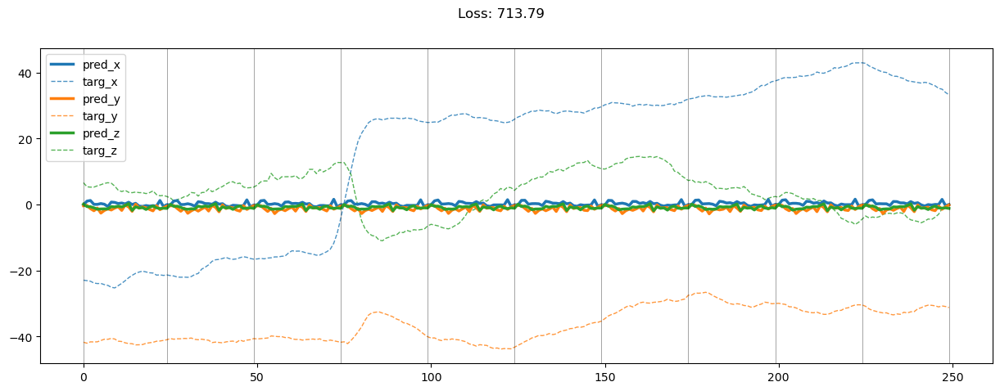

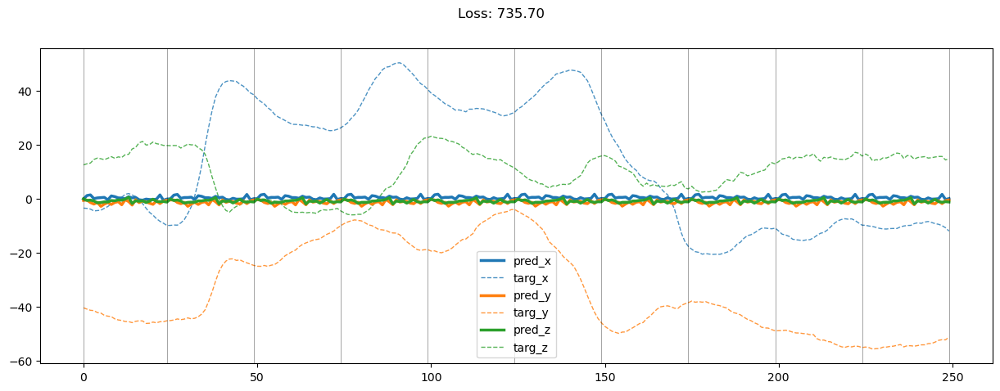

00000: train total loss:  1287.827, pred loss:  643.913, valid total loss:  1344.306, pred loss:  672.153


100%|██████████| 6/6 [00:00<00:00, 15.41it/s]


00001: train total loss:  1250.846, pred loss:  625.423, valid total loss:  1314.077, pred loss:  657.038


100%|██████████| 6/6 [00:00<00:00, 14.72it/s]


00002: train total loss:  1227.698, pred loss:  613.849, valid total loss:  1289.860, pred loss:  644.930


100%|██████████| 6/6 [00:00<00:00, 13.57it/s]


00003: train total loss:  1196.148, pred loss:  598.074, valid total loss:  1273.933, pred loss:  636.966


100%|██████████| 6/6 [00:00<00:00, 14.63it/s]


00004: train total loss:  1177.979, pred loss:  588.990, valid total loss:  1249.623, pred loss:  624.811


100%|██████████| 6/6 [00:00<00:00, 15.45it/s]


00005: train total loss:  1152.198, pred loss:  576.099, valid total loss:  1224.174, pred loss:  612.087


100%|██████████| 6/6 [00:00<00:00, 13.58it/s]


00006: train total loss:  1117.091, pred loss:  558.546, valid total loss:  1188.031, pred loss:  594.015


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00007: train total loss:  1083.479, pred loss:  541.740, valid total loss:  1154.436, pred loss:  577.218


100%|██████████| 6/6 [00:00<00:00, 15.72it/s]


00008: train total loss:  1041.878, pred loss:  520.939, valid total loss:  1119.476, pred loss:  559.738


100%|██████████| 6/6 [00:00<00:00, 15.59it/s]


00009: train total loss:  998.118, pred loss:  499.059, valid total loss:  1076.714, pred loss:  538.357


100%|██████████| 6/6 [00:00<00:00, 13.46it/s]


00010: train total loss:  960.380, pred loss:  480.190, valid total loss:  1040.921, pred loss:  520.461


100%|██████████| 6/6 [00:00<00:00, 14.00it/s]


00011: train total loss:  921.366, pred loss:  460.683, valid total loss:  1002.642, pred loss:  501.321


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00012: train total loss:  884.360, pred loss:  442.180, valid total loss:  971.123, pred loss:  485.562


100%|██████████| 6/6 [00:00<00:00, 13.83it/s]


00013: train total loss:  839.195, pred loss:  419.597, valid total loss:  916.208, pred loss:  458.104


100%|██████████| 6/6 [00:00<00:00, 13.49it/s]


00014: train total loss:  794.024, pred loss:  397.012, valid total loss:  899.844, pred loss:  449.922


100%|██████████| 6/6 [00:00<00:00, 15.18it/s]


00015: train total loss:  754.933, pred loss:  377.466, valid total loss:  876.503, pred loss:  438.251


100%|██████████| 6/6 [00:00<00:00, 15.83it/s]


00016: train total loss:  714.294, pred loss:  357.147, valid total loss:  812.648, pred loss:  406.324


100%|██████████| 6/6 [00:00<00:00, 13.80it/s]


00017: train total loss:  667.998, pred loss:  333.999, valid total loss:  764.686, pred loss:  382.343


100%|██████████| 6/6 [00:00<00:00, 13.73it/s]


00018: train total loss:  637.620, pred loss:  318.810, valid total loss:  770.261, pred loss:  385.131


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00019: train total loss:  620.104, pred loss:  310.052, valid total loss:  767.878, pred loss:  383.939


100%|██████████| 6/6 [00:00<00:00, 14.55it/s]


00020: train total loss:  579.024, pred loss:  289.512, valid total loss:  713.448, pred loss:  356.724


100%|██████████| 6/6 [00:00<00:00, 13.37it/s]


00021: train total loss:  544.370, pred loss:  272.185, valid total loss:  651.385, pred loss:  325.693


100%|██████████| 6/6 [00:00<00:00, 14.65it/s]


00022: train total loss:  512.723, pred loss:  256.361, valid total loss:  615.446, pred loss:  307.723


100%|██████████| 6/6 [00:00<00:00, 15.82it/s]


00023: train total loss:  480.622, pred loss:  240.311, valid total loss:  659.418, pred loss:  329.709


100%|██████████| 6/6 [00:00<00:00, 13.45it/s]


00024: train total loss:  459.060, pred loss:  229.530, valid total loss:  646.905, pred loss:  323.453


100%|██████████| 6/6 [00:00<00:00, 13.71it/s]


00025: train total loss:  430.414, pred loss:  215.207, valid total loss:  584.139, pred loss:  292.070


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00026: train total loss:  405.497, pred loss:  202.748, valid total loss:  572.008, pred loss:  286.004


100%|██████████| 6/6 [00:00<00:00, 15.19it/s]


00027: train total loss:  379.979, pred loss:  189.989, valid total loss:  543.336, pred loss:  271.668


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00028: train total loss:  358.668, pred loss:  179.334, valid total loss:  533.534, pred loss:  266.767


100%|██████████| 6/6 [00:00<00:00, 13.86it/s]


00029: train total loss:  343.142, pred loss:  171.571, valid total loss:  497.274, pred loss:  248.637


100%|██████████| 6/6 [00:00<00:00, 15.45it/s]


00030: train total loss:  318.300, pred loss:  159.150, valid total loss:  495.743, pred loss:  247.871


100%|██████████| 6/6 [00:00<00:00, 13.92it/s]


00031: train total loss:  302.996, pred loss:  151.498, valid total loss:  524.124, pred loss:  262.062


100%|██████████| 6/6 [00:00<00:00, 13.25it/s]


00032: train total loss:  286.676, pred loss:  143.338, valid total loss:  532.124, pred loss:  266.062


100%|██████████| 6/6 [00:00<00:00, 14.77it/s]


00033: train total loss:  278.200, pred loss:  139.100, valid total loss:  449.865, pred loss:  224.932


100%|██████████| 6/6 [00:00<00:00, 15.47it/s]


00034: train total loss:  262.147, pred loss:  131.073, valid total loss:  422.306, pred loss:  211.153


100%|██████████| 6/6 [00:00<00:00, 13.10it/s]


00035: train total loss:  239.816, pred loss:  119.908, valid total loss:  491.679, pred loss:  245.840


100%|██████████| 6/6 [00:00<00:00, 13.28it/s]


00036: train total loss:  228.086, pred loss:  114.043, valid total loss:  400.034, pred loss:  200.017


100%|██████████| 6/6 [00:00<00:00, 15.35it/s]


00037: train total loss:  218.183, pred loss:  109.092, valid total loss:  374.451, pred loss:  187.225


100%|██████████| 6/6 [00:00<00:00, 14.07it/s]


00038: train total loss:  208.255, pred loss:  104.127, valid total loss:  376.916, pred loss:  188.458


100%|██████████| 6/6 [00:00<00:00, 13.11it/s]


00039: train total loss:  198.314, pred loss:  99.157, valid total loss:  381.635, pred loss:  190.818


100%|██████████| 6/6 [00:00<00:00, 14.04it/s]


00040: train total loss:  188.467, pred loss:  94.234, valid total loss:  397.732, pred loss:  198.866


100%|██████████| 6/6 [00:00<00:00, 15.16it/s]


00041: train total loss:  179.398, pred loss:  89.699, valid total loss:  430.818, pred loss:  215.409


100%|██████████| 6/6 [00:00<00:00, 12.99it/s]


00042: train total loss:  171.102, pred loss:  85.551, valid total loss:  350.562, pred loss:  175.281


100%|██████████| 6/6 [00:00<00:00, 12.81it/s]


00043: train total loss:  167.165, pred loss:  83.583, valid total loss:  390.900, pred loss:  195.450


100%|██████████| 6/6 [00:00<00:00, 15.07it/s]


00044: train total loss:  156.669, pred loss:  78.335, valid total loss:  330.264, pred loss:  165.132


100%|██████████| 6/6 [00:00<00:00, 14.24it/s]


00045: train total loss:  154.497, pred loss:  77.249, valid total loss:  390.848, pred loss:  195.424


100%|██████████| 6/6 [00:00<00:00, 13.13it/s]


00046: train total loss:  150.075, pred loss:  75.038, valid total loss:  342.794, pred loss:  171.397


100%|██████████| 6/6 [00:00<00:00, 13.81it/s]


00047: train total loss:  146.070, pred loss:  73.035, valid total loss:  395.277, pred loss:  197.638


100%|██████████| 6/6 [00:00<00:00, 14.78it/s]


00048: train total loss:  144.314, pred loss:  72.157, valid total loss:  258.315, pred loss:  129.158


100%|██████████| 6/6 [00:00<00:00, 12.86it/s]


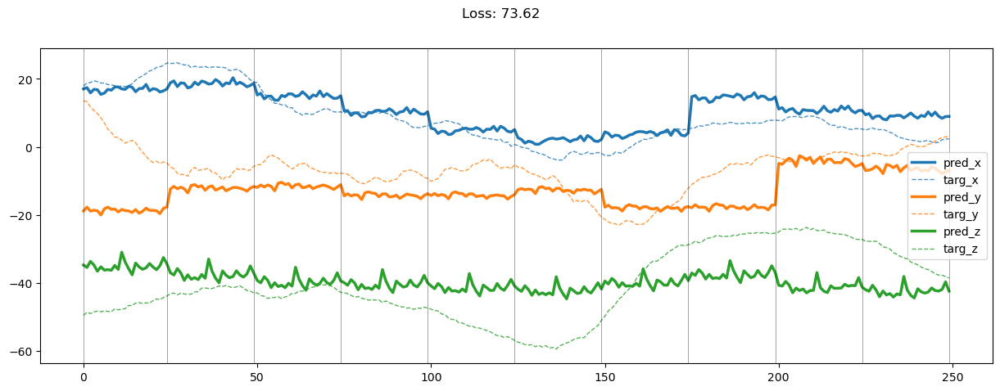

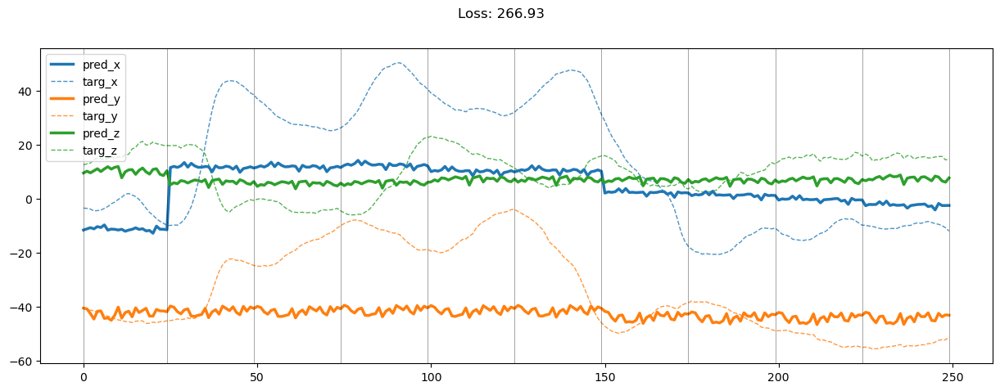

00049: train total loss:  140.997, pred loss:  70.498, valid total loss:  367.231, pred loss:  183.616


100%|██████████| 6/6 [00:00<00:00, 15.17it/s]


00050: train total loss:  135.138, pred loss:  67.569, valid total loss:  265.630, pred loss:  132.815


100%|██████████| 6/6 [00:00<00:00, 13.70it/s]


00051: train total loss:  129.547, pred loss:  64.773, valid total loss:  318.588, pred loss:  159.294


100%|██████████| 6/6 [00:00<00:00, 12.83it/s]


00052: train total loss:  125.587, pred loss:  62.794, valid total loss:  275.781, pred loss:  137.890


100%|██████████| 6/6 [00:00<00:00, 14.27it/s]


00053: train total loss:  120.767, pred loss:  60.383, valid total loss:  276.560, pred loss:  138.280


100%|██████████| 6/6 [00:00<00:00, 15.50it/s]


00054: train total loss:  115.422, pred loss:  57.711, valid total loss:  259.052, pred loss:  129.526


100%|██████████| 6/6 [00:00<00:00, 12.86it/s]


00055: train total loss:  110.482, pred loss:  55.241, valid total loss:  240.563, pred loss:  120.282


100%|██████████| 6/6 [00:00<00:00, 12.97it/s]


00056: train total loss:  104.076, pred loss:  52.038, valid total loss:  266.752, pred loss:  133.376


100%|██████████| 6/6 [00:00<00:00, 14.95it/s]


00057: train total loss:  100.788, pred loss:  50.394, valid total loss:  246.761, pred loss:  123.380


100%|██████████| 6/6 [00:00<00:00, 13.56it/s]


00058: train total loss:  101.075, pred loss:  50.537, valid total loss:  254.267, pred loss:  127.133


100%|██████████| 6/6 [00:00<00:00, 12.80it/s]


00059: train total loss:  102.046, pred loss:  51.023, valid total loss:  229.259, pred loss:  114.629


100%|██████████| 6/6 [00:00<00:00, 14.54it/s]


00060: train total loss:  101.619, pred loss:  50.809, valid total loss:  266.881, pred loss:  133.441


100%|██████████| 6/6 [00:00<00:00, 15.37it/s]


00061: train total loss:  94.909, pred loss:  47.455, valid total loss:  272.678, pred loss:  136.339


100%|██████████| 6/6 [00:00<00:00, 12.81it/s]


00062: train total loss:  95.116, pred loss:  47.558, valid total loss:  236.453, pred loss:  118.226


100%|██████████| 6/6 [00:00<00:00, 13.10it/s]


00063: train total loss:  93.046, pred loss:  46.523, valid total loss:  232.556, pred loss:  116.278


100%|██████████| 6/6 [00:00<00:00, 14.90it/s]


00064: train total loss:  92.069, pred loss:  46.034, valid total loss:  254.209, pred loss:  127.104


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00065: train total loss:  87.970, pred loss:  43.985, valid total loss:  233.039, pred loss:  116.520


100%|██████████| 6/6 [00:00<00:00, 12.86it/s]


00066: train total loss:  85.857, pred loss:  42.929, valid total loss:  255.967, pred loss:  127.983


100%|██████████| 6/6 [00:00<00:00, 14.59it/s]


00067: train total loss:  86.189, pred loss:  43.095, valid total loss:  216.572, pred loss:  108.286


100%|██████████| 6/6 [00:00<00:00, 15.38it/s]


00068: train total loss:  82.326, pred loss:  41.163, valid total loss:  232.681, pred loss:  116.341


100%|██████████| 6/6 [00:00<00:00, 13.03it/s]


00069: train total loss:  83.173, pred loss:  41.587, valid total loss:  244.704, pred loss:  122.352


100%|██████████| 6/6 [00:00<00:00, 13.15it/s]


00070: train total loss:  81.220, pred loss:  40.610, valid total loss:  229.888, pred loss:  114.944


100%|██████████| 6/6 [00:00<00:00, 15.26it/s]


00071: train total loss:  77.641, pred loss:  38.820, valid total loss:  227.432, pred loss:  113.716


100%|██████████| 6/6 [00:00<00:00, 14.32it/s]


00072: train total loss:  76.412, pred loss:  38.206, valid total loss:  238.898, pred loss:  119.449


100%|██████████| 6/6 [00:00<00:00, 13.07it/s]


00073: train total loss:  74.709, pred loss:  37.355, valid total loss:  242.172, pred loss:  121.086


100%|██████████| 6/6 [00:00<00:00, 14.37it/s]


00074: train total loss:  73.677, pred loss:  36.839, valid total loss:  235.349, pred loss:  117.674


100%|██████████| 6/6 [00:00<00:00, 15.42it/s]


00075: train total loss:  72.893, pred loss:  36.447, valid total loss:  225.427, pred loss:  112.714


100%|██████████| 6/6 [00:00<00:00, 12.96it/s]


00076: train total loss:  72.374, pred loss:  36.187, valid total loss:  232.269, pred loss:  116.135


100%|██████████| 6/6 [00:00<00:00, 13.06it/s]


00077: train total loss:  69.854, pred loss:  34.927, valid total loss:  235.837, pred loss:  117.918


100%|██████████| 6/6 [00:00<00:00, 15.59it/s]


00078: train total loss:  68.776, pred loss:  34.388, valid total loss:  201.467, pred loss:  100.733


100%|██████████| 6/6 [00:00<00:00, 14.73it/s]


00079: train total loss:  70.972, pred loss:  35.486, valid total loss:  225.029, pred loss:  112.514


100%|██████████| 6/6 [00:00<00:00, 13.35it/s]


00080: train total loss:  70.999, pred loss:  35.500, valid total loss:  231.773, pred loss:  115.886


100%|██████████| 6/6 [00:00<00:00, 14.09it/s]


00081: train total loss:  69.916, pred loss:  34.958, valid total loss:  235.435, pred loss:  117.718


100%|██████████| 6/6 [00:00<00:00, 15.72it/s]


00082: train total loss:  68.703, pred loss:  34.351, valid total loss:  220.733, pred loss:  110.367


100%|██████████| 6/6 [00:00<00:00, 14.60it/s]


00083: train total loss:  68.788, pred loss:  34.394, valid total loss:  211.750, pred loss:  105.875


100%|██████████| 6/6 [00:00<00:00, 13.38it/s]


00084: train total loss:  68.524, pred loss:  34.262, valid total loss:  233.924, pred loss:  116.962


100%|██████████| 6/6 [00:00<00:00, 16.91it/s]


00085: train total loss:  67.075, pred loss:  33.538, valid total loss:  211.675, pred loss:  105.838


100%|██████████| 6/6 [00:00<00:00, 15.66it/s]


00086: train total loss:  65.629, pred loss:  32.814, valid total loss:  214.053, pred loss:  107.027


100%|██████████| 6/6 [00:00<00:00, 16.71it/s]


00087: train total loss:  65.365, pred loss:  32.682, valid total loss:  232.420, pred loss:  116.210


100%|██████████| 6/6 [00:00<00:00, 13.19it/s]


00088: train total loss:  64.278, pred loss:  32.139, valid total loss:  244.994, pred loss:  122.497


100%|██████████| 6/6 [00:00<00:00, 13.33it/s]


00089: train total loss:  64.211, pred loss:  32.105, valid total loss:  236.706, pred loss:  118.353


100%|██████████| 6/6 [00:00<00:00, 15.17it/s]


00090: train total loss:  62.118, pred loss:  31.059, valid total loss:  225.876, pred loss:  112.938


100%|██████████| 6/6 [00:00<00:00, 15.26it/s]


00091: train total loss:  61.543, pred loss:  30.771, valid total loss:  240.827, pred loss:  120.413


100%|██████████| 6/6 [00:00<00:00, 13.38it/s]


00092: train total loss:  63.372, pred loss:  31.686, valid total loss:  215.602, pred loss:  107.801


100%|██████████| 6/6 [00:00<00:00, 13.72it/s]


00093: train total loss:  61.723, pred loss:  30.862, valid total loss:  223.895, pred loss:  111.948


100%|██████████| 6/6 [00:00<00:00, 15.74it/s]


00094: train total loss:  59.157, pred loss:  29.579, valid total loss:  229.781, pred loss:  114.891


100%|██████████| 6/6 [00:00<00:00, 13.75it/s]


00095: train total loss:  59.261, pred loss:  29.630, valid total loss:  220.947, pred loss:  110.474


100%|██████████| 6/6 [00:00<00:00, 13.52it/s]


00096: train total loss:  59.179, pred loss:  29.589, valid total loss:  230.591, pred loss:  115.295


100%|██████████| 6/6 [00:00<00:00, 14.29it/s]


00097: train total loss:  58.388, pred loss:  29.194, valid total loss:  221.271, pred loss:  110.635


100%|██████████| 6/6 [00:00<00:00, 15.20it/s]


00098: train total loss:  56.791, pred loss:  28.396, valid total loss:  207.737, pred loss:  103.869


100%|██████████| 6/6 [00:00<00:00, 13.95it/s]


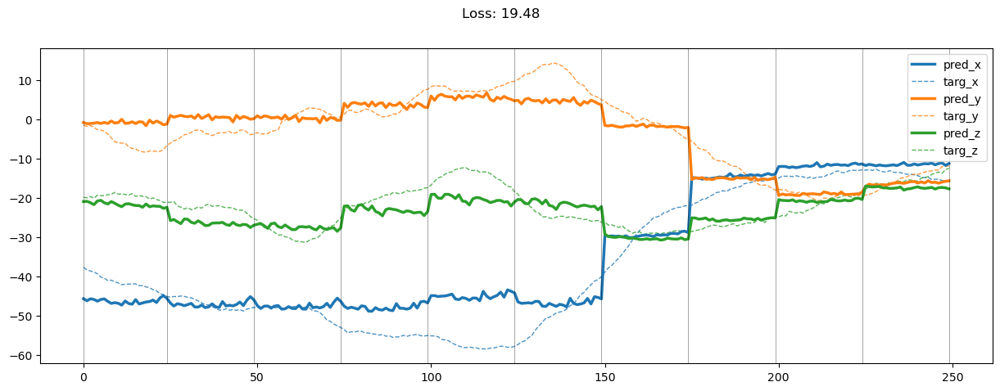

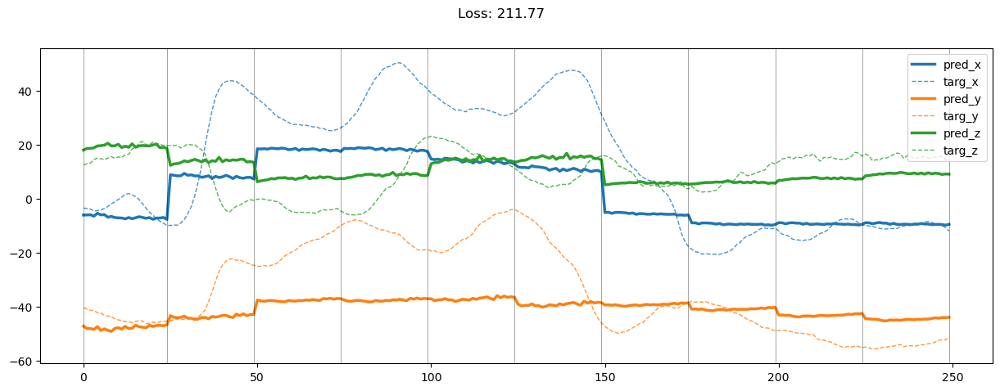

00099: train total loss:  57.476, pred loss:  28.738, valid total loss:  221.401, pred loss:  110.701


100%|██████████| 6/6 [00:00<00:00, 15.09it/s]


00100: train total loss:  56.101, pred loss:  28.050, valid total loss:  208.160, pred loss:  104.080


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00101: train total loss:  56.007, pred loss:  28.004, valid total loss:  208.688, pred loss:  104.344


100%|██████████| 6/6 [00:00<00:00, 13.37it/s]


00102: train total loss:  55.160, pred loss:  27.580, valid total loss:  201.766, pred loss:  100.883


100%|██████████| 6/6 [00:00<00:00, 13.44it/s]


00103: train total loss:  56.356, pred loss:  28.178, valid total loss:  206.822, pred loss:  103.411


100%|██████████| 6/6 [00:00<00:00, 15.70it/s]


00104: train total loss:  54.630, pred loss:  27.315, valid total loss:  212.930, pred loss:  106.465


100%|██████████| 6/6 [00:00<00:00, 14.68it/s]


00105: train total loss:  55.897, pred loss:  27.949, valid total loss:  229.166, pred loss:  114.583


100%|██████████| 6/6 [00:00<00:00, 13.29it/s]


00106: train total loss:  55.160, pred loss:  27.580, valid total loss:  209.328, pred loss:  104.664


100%|██████████| 6/6 [00:00<00:00, 14.39it/s]


00107: train total loss:  53.668, pred loss:  26.834, valid total loss:  225.537, pred loss:  112.768


100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


00108: train total loss:  55.327, pred loss:  27.664, valid total loss:  221.913, pred loss:  110.956


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00109: train total loss:  53.582, pred loss:  26.791, valid total loss:  204.709, pred loss:  102.355


100%|██████████| 6/6 [00:00<00:00, 13.01it/s]


00110: train total loss:  53.492, pred loss:  26.746, valid total loss:  225.365, pred loss:  112.683


100%|██████████| 6/6 [00:00<00:00, 15.59it/s]


00111: train total loss:  52.778, pred loss:  26.389, valid total loss:  221.227, pred loss:  110.614


100%|██████████| 6/6 [00:00<00:00, 15.30it/s]


00112: train total loss:  53.784, pred loss:  26.892, valid total loss:  209.745, pred loss:  104.873


100%|██████████| 6/6 [00:00<00:00, 13.79it/s]


00113: train total loss:  52.948, pred loss:  26.474, valid total loss:  226.027, pred loss:  113.013


100%|██████████| 6/6 [00:00<00:00, 13.77it/s]


00114: train total loss:  54.953, pred loss:  27.476, valid total loss:  230.389, pred loss:  115.195


100%|██████████| 6/6 [00:00<00:00, 15.71it/s]


00115: train total loss:  53.825, pred loss:  26.912, valid total loss:  186.264, pred loss:  93.132


100%|██████████| 6/6 [00:00<00:00, 14.34it/s]


00116: train total loss:  54.021, pred loss:  27.010, valid total loss:  211.726, pred loss:  105.863


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00117: train total loss:  53.513, pred loss:  26.757, valid total loss:  192.843, pred loss:  96.422


100%|██████████| 6/6 [00:00<00:00, 14.72it/s]


00118: train total loss:  53.910, pred loss:  26.955, valid total loss:  184.544, pred loss:  92.272


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00119: train total loss:  52.552, pred loss:  26.276, valid total loss:  206.379, pred loss:  103.190


100%|██████████| 6/6 [00:00<00:00, 13.51it/s]


00120: train total loss:  52.725, pred loss:  26.362, valid total loss:  206.272, pred loss:  103.136


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00121: train total loss:  51.579, pred loss:  25.790, valid total loss:  201.287, pred loss:  100.644


100%|██████████| 6/6 [00:00<00:00, 15.62it/s]


00122: train total loss:  52.676, pred loss:  26.338, valid total loss:  195.989, pred loss:  97.995


100%|██████████| 6/6 [00:00<00:00, 15.26it/s]


00123: train total loss:  51.243, pred loss:  25.621, valid total loss:  216.827, pred loss:  108.414


100%|██████████| 6/6 [00:00<00:00, 13.31it/s]


00124: train total loss:  51.847, pred loss:  25.924, valid total loss:  227.604, pred loss:  113.802


100%|██████████| 6/6 [00:00<00:00, 13.99it/s]


00125: train total loss:  50.402, pred loss:  25.201, valid total loss:  216.053, pred loss:  108.026


100%|██████████| 6/6 [00:00<00:00, 16.48it/s]


00126: train total loss:  50.795, pred loss:  25.398, valid total loss:  219.984, pred loss:  109.992


100%|██████████| 6/6 [00:00<00:00, 14.57it/s]


00127: train total loss:  49.897, pred loss:  24.948, valid total loss:  199.679, pred loss:  99.840


100%|██████████| 6/6 [00:00<00:00, 13.70it/s]


00128: train total loss:  50.625, pred loss:  25.312, valid total loss:  197.546, pred loss:  98.773


100%|██████████| 6/6 [00:00<00:00, 14.46it/s]


00129: train total loss:  51.975, pred loss:  25.988, valid total loss:  211.238, pred loss:  105.619


100%|██████████| 6/6 [00:00<00:00, 15.89it/s]


00130: train total loss:  50.470, pred loss:  25.235, valid total loss:  192.014, pred loss:  96.007


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00131: train total loss:  49.946, pred loss:  24.973, valid total loss:  197.421, pred loss:  98.711


100%|██████████| 6/6 [00:00<00:00, 13.45it/s]


00132: train total loss:  48.385, pred loss:  24.192, valid total loss:  204.867, pred loss:  102.434


100%|██████████| 6/6 [00:00<00:00, 15.59it/s]


00133: train total loss:  47.707, pred loss:  23.853, valid total loss:  204.416, pred loss:  102.208


100%|██████████| 6/6 [00:00<00:00, 15.52it/s]


00134: train total loss:  47.124, pred loss:  23.562, valid total loss:  198.704, pred loss:  99.352


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00135: train total loss:  47.856, pred loss:  23.928, valid total loss:  209.067, pred loss:  104.533


100%|██████████| 6/6 [00:00<00:00, 13.80it/s]


00136: train total loss:  47.742, pred loss:  23.871, valid total loss:  191.943, pred loss:  95.971


100%|██████████| 6/6 [00:00<00:00, 15.72it/s]


00137: train total loss:  46.317, pred loss:  23.158, valid total loss:  204.516, pred loss:  102.258


100%|██████████| 6/6 [00:00<00:00, 13.73it/s]


00138: train total loss:  46.739, pred loss:  23.369, valid total loss:  188.440, pred loss:  94.220


100%|██████████| 6/6 [00:00<00:00, 13.57it/s]


00139: train total loss:  46.861, pred loss:  23.431, valid total loss:  196.181, pred loss:  98.091


100%|██████████| 6/6 [00:00<00:00, 15.06it/s]


00140: train total loss:  46.487, pred loss:  23.244, valid total loss:  208.978, pred loss:  104.489


100%|██████████| 6/6 [00:00<00:00, 15.82it/s]


00141: train total loss:  46.645, pred loss:  23.322, valid total loss:  208.737, pred loss:  104.369


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00142: train total loss:  45.892, pred loss:  22.946, valid total loss:  180.396, pred loss:  90.198


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


00143: train total loss:  45.286, pred loss:  22.643, valid total loss:  180.624, pred loss:  90.312


100%|██████████| 6/6 [00:00<00:00, 15.74it/s]


00144: train total loss:  44.950, pred loss:  22.475, valid total loss:  192.139, pred loss:  96.069


100%|██████████| 6/6 [00:00<00:00, 15.28it/s]


00145: train total loss:  45.276, pred loss:  22.638, valid total loss:  191.317, pred loss:  95.658


100%|██████████| 6/6 [00:00<00:00, 13.19it/s]


00146: train total loss:  45.659, pred loss:  22.829, valid total loss:  183.766, pred loss:  91.883


100%|██████████| 6/6 [00:00<00:00, 14.19it/s]


00147: train total loss:  45.402, pred loss:  22.701, valid total loss:  206.358, pred loss:  103.179


100%|██████████| 6/6 [00:00<00:00, 15.55it/s]


00148: train total loss:  46.568, pred loss:  23.284, valid total loss:  194.875, pred loss:  97.438


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


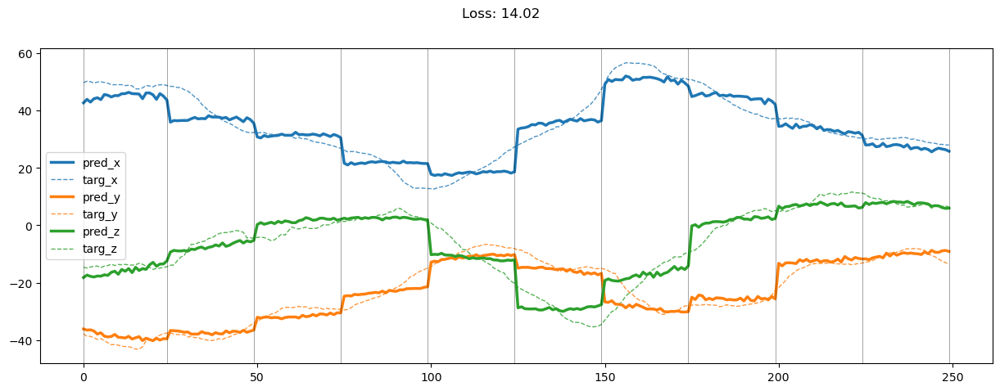

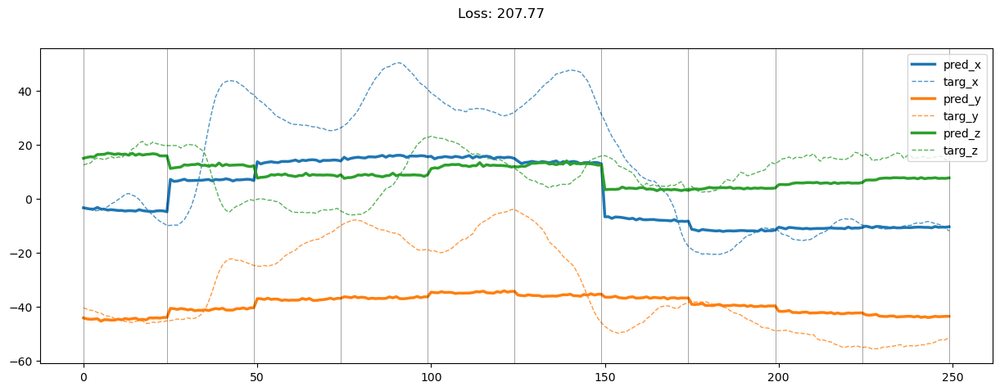

00149: train total loss:  46.943, pred loss:  23.472, valid total loss:  194.474, pred loss:  97.237


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00150: train total loss:  46.719, pred loss:  23.360, valid total loss:  206.299, pred loss:  103.150


100%|██████████| 6/6 [00:00<00:00, 15.37it/s]


00151: train total loss:  45.661, pred loss:  22.831, valid total loss:  195.897, pred loss:  97.948


100%|██████████| 6/6 [00:00<00:00, 13.57it/s]


00152: train total loss:  46.405, pred loss:  23.202, valid total loss:  189.874, pred loss:  94.937


100%|██████████| 6/6 [00:00<00:00, 13.99it/s]


00153: train total loss:  45.704, pred loss:  22.852, valid total loss:  191.783, pred loss:  95.891


100%|██████████| 6/6 [00:00<00:00, 15.84it/s]


00154: train total loss:  46.223, pred loss:  23.111, valid total loss:  201.057, pred loss:  100.529


100%|██████████| 6/6 [00:00<00:00, 14.03it/s]


00155: train total loss:  44.294, pred loss:  22.147, valid total loss:  181.187, pred loss:  90.593


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00156: train total loss:  44.781, pred loss:  22.391, valid total loss:  186.055, pred loss:  93.027


100%|██████████| 6/6 [00:00<00:00, 15.04it/s]


00157: train total loss:  43.575, pred loss:  21.787, valid total loss:  213.248, pred loss:  106.624


100%|██████████| 6/6 [00:00<00:00, 15.72it/s]


00158: train total loss:  44.710, pred loss:  22.355, valid total loss:  223.619, pred loss:  111.810


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00159: train total loss:  43.782, pred loss:  21.891, valid total loss:  216.410, pred loss:  108.205


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00160: train total loss:  44.080, pred loss:  22.040, valid total loss:  204.803, pred loss:  102.401


100%|██████████| 6/6 [00:00<00:00, 15.64it/s]


00161: train total loss:  42.462, pred loss:  21.231, valid total loss:  186.326, pred loss:  93.163


100%|██████████| 6/6 [00:00<00:00, 14.65it/s]


00162: train total loss:  41.800, pred loss:  20.900, valid total loss:  188.940, pred loss:  94.470


100%|██████████| 6/6 [00:00<00:00, 13.39it/s]


00163: train total loss:  42.011, pred loss:  21.005, valid total loss:  181.264, pred loss:  90.632


100%|██████████| 6/6 [00:00<00:00, 14.60it/s]


00164: train total loss:  41.129, pred loss:  20.564, valid total loss:  183.283, pred loss:  91.641


100%|██████████| 6/6 [00:00<00:00, 15.83it/s]


00165: train total loss:  40.770, pred loss:  20.385, valid total loss:  173.723, pred loss:  86.862


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00166: train total loss:  41.594, pred loss:  20.797, valid total loss:  177.371, pred loss:  88.686


100%|██████████| 6/6 [00:00<00:00, 13.58it/s]


00167: train total loss:  41.041, pred loss:  20.520, valid total loss:  180.190, pred loss:  90.095


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00168: train total loss:  41.289, pred loss:  20.645, valid total loss:  183.283, pred loss:  91.642


100%|██████████| 6/6 [00:00<00:00, 15.52it/s]


00169: train total loss:  43.169, pred loss:  21.584, valid total loss:  184.257, pred loss:  92.128


100%|██████████| 6/6 [00:00<00:00, 13.58it/s]


00170: train total loss:  41.995, pred loss:  20.998, valid total loss:  182.254, pred loss:  91.127


100%|██████████| 6/6 [00:00<00:00, 14.02it/s]


00171: train total loss:  40.056, pred loss:  20.028, valid total loss:  181.228, pred loss:  90.614


100%|██████████| 6/6 [00:00<00:00, 15.79it/s]


00172: train total loss:  39.950, pred loss:  19.975, valid total loss:  178.924, pred loss:  89.462


100%|██████████| 6/6 [00:00<00:00, 15.06it/s]


00173: train total loss:  39.999, pred loss:  20.000, valid total loss:  191.220, pred loss:  95.610


100%|██████████| 6/6 [00:00<00:00, 13.58it/s]


00174: train total loss:  39.393, pred loss:  19.696, valid total loss:  168.930, pred loss:  84.465


100%|██████████| 6/6 [00:00<00:00, 14.41it/s]


00175: train total loss:  38.471, pred loss:  19.236, valid total loss:  168.341, pred loss:  84.170


100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


00176: train total loss:  38.927, pred loss:  19.463, valid total loss:  184.273, pred loss:  92.136


100%|██████████| 6/6 [00:00<00:00, 13.56it/s]


00177: train total loss:  39.517, pred loss:  19.759, valid total loss:  185.071, pred loss:  92.535


100%|██████████| 6/6 [00:00<00:00, 13.52it/s]


00178: train total loss:  38.704, pred loss:  19.352, valid total loss:  177.067, pred loss:  88.533


100%|██████████| 6/6 [00:00<00:00, 15.60it/s]


00179: train total loss:  38.429, pred loss:  19.215, valid total loss:  176.178, pred loss:  88.089


100%|██████████| 6/6 [00:00<00:00, 15.50it/s]


00180: train total loss:  38.173, pred loss:  19.087, valid total loss:  164.767, pred loss:  82.384


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00181: train total loss:  37.622, pred loss:  18.811, valid total loss:  181.257, pred loss:  90.629


100%|██████████| 6/6 [00:00<00:00, 13.82it/s]


00182: train total loss:  37.285, pred loss:  18.643, valid total loss:  170.622, pred loss:  85.311


100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


00183: train total loss:  36.186, pred loss:  18.093, valid total loss:  175.357, pred loss:  87.678


100%|██████████| 6/6 [00:00<00:00, 14.34it/s]


00184: train total loss:  37.074, pred loss:  18.537, valid total loss:  171.908, pred loss:  85.954


100%|██████████| 6/6 [00:00<00:00, 13.77it/s]


00185: train total loss:  36.595, pred loss:  18.297, valid total loss:  171.367, pred loss:  85.684


100%|██████████| 6/6 [00:00<00:00, 14.62it/s]


00186: train total loss:  37.010, pred loss:  18.505, valid total loss:  170.728, pred loss:  85.364


100%|██████████| 6/6 [00:00<00:00, 15.89it/s]


00187: train total loss:  36.495, pred loss:  18.247, valid total loss:  168.058, pred loss:  84.029


100%|██████████| 6/6 [00:00<00:00, 13.56it/s]


00188: train total loss:  36.120, pred loss:  18.060, valid total loss:  174.181, pred loss:  87.090


100%|██████████| 6/6 [00:00<00:00, 13.64it/s]


00189: train total loss:  35.120, pred loss:  17.560, valid total loss:  182.256, pred loss:  91.128


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00190: train total loss:  36.089, pred loss:  18.044, valid total loss:  165.272, pred loss:  82.636


100%|██████████| 6/6 [00:00<00:00, 15.34it/s]


00191: train total loss:  35.255, pred loss:  17.628, valid total loss:  165.523, pred loss:  82.761


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00192: train total loss:  35.233, pred loss:  17.616, valid total loss:  169.815, pred loss:  84.907


100%|██████████| 6/6 [00:00<00:00, 14.04it/s]


00193: train total loss:  35.442, pred loss:  17.721, valid total loss:  172.884, pred loss:  86.442


100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


00194: train total loss:  35.624, pred loss:  17.812, valid total loss:  165.286, pred loss:  82.643


100%|██████████| 6/6 [00:00<00:00, 14.19it/s]


00195: train total loss:  34.575, pred loss:  17.287, valid total loss:  163.170, pred loss:  81.585


100%|██████████| 6/6 [00:00<00:00, 13.44it/s]


00196: train total loss:  35.073, pred loss:  17.537, valid total loss:  175.103, pred loss:  87.551


100%|██████████| 6/6 [00:00<00:00, 15.22it/s]


00197: train total loss:  34.744, pred loss:  17.372, valid total loss:  166.393, pred loss:  83.197


100%|██████████| 6/6 [00:00<00:00, 15.82it/s]


00198: train total loss:  35.278, pred loss:  17.639, valid total loss:  164.075, pred loss:  82.037


100%|██████████| 6/6 [00:00<00:00, 13.57it/s]


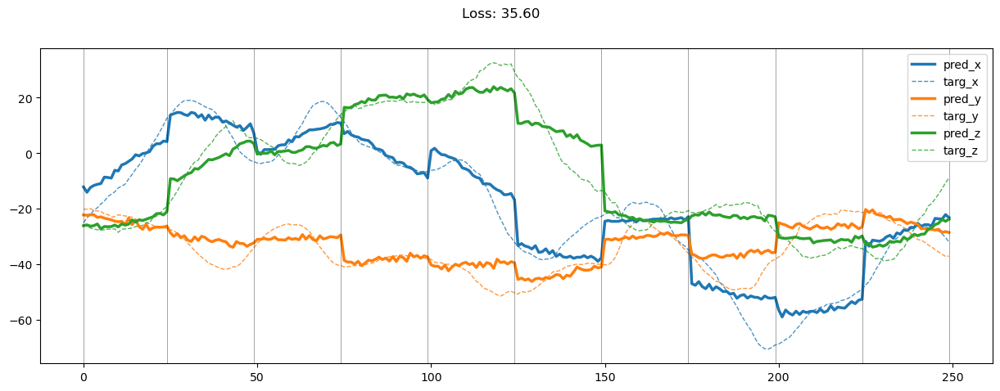

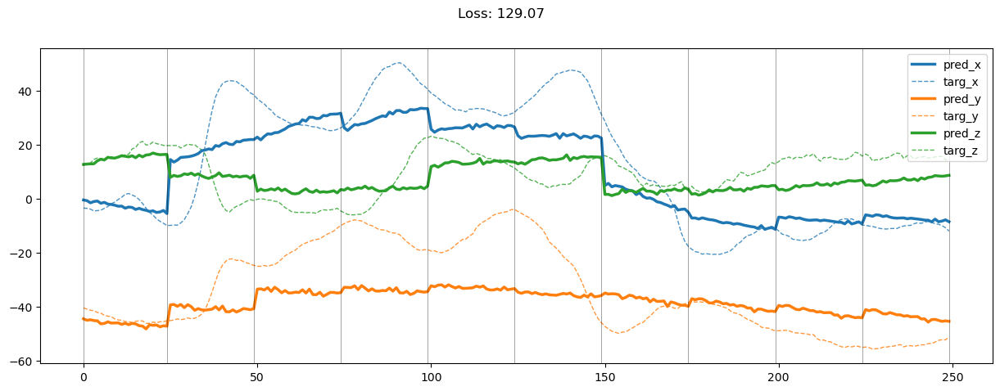

00199: train total loss:  34.960, pred loss:  17.480, valid total loss:  165.928, pred loss:  82.964


100%|██████████| 6/6 [00:00<00:00, 15.47it/s]


00200: train total loss:  36.081, pred loss:  18.040, valid total loss:  166.417, pred loss:  83.208


100%|██████████| 6/6 [00:00<00:00, 15.42it/s]


00201: train total loss:  35.455, pred loss:  17.728, valid total loss:  167.628, pred loss:  83.814


100%|██████████| 6/6 [00:00<00:00, 13.75it/s]


00202: train total loss:  33.698, pred loss:  16.849, valid total loss:  166.019, pred loss:  83.010


100%|██████████| 6/6 [00:00<00:00, 13.99it/s]


00203: train total loss:  34.183, pred loss:  17.091, valid total loss:  160.209, pred loss:  80.105


100%|██████████| 6/6 [00:00<00:00, 15.66it/s]


00204: train total loss:  33.463, pred loss:  16.731, valid total loss:  159.008, pred loss:  79.504


100%|██████████| 6/6 [00:00<00:00, 14.57it/s]


00205: train total loss:  32.961, pred loss:  16.481, valid total loss:  169.003, pred loss:  84.502


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00206: train total loss:  32.955, pred loss:  16.477, valid total loss:  170.452, pred loss:  85.226


100%|██████████| 6/6 [00:00<00:00, 14.62it/s]


00207: train total loss:  32.935, pred loss:  16.468, valid total loss:  165.411, pred loss:  82.705


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00208: train total loss:  32.676, pred loss:  16.338, valid total loss:  165.087, pred loss:  82.543


100%|██████████| 6/6 [00:00<00:00, 13.46it/s]


00209: train total loss:  33.636, pred loss:  16.818, valid total loss:  154.526, pred loss:  77.263


100%|██████████| 6/6 [00:00<00:00, 13.68it/s]


00210: train total loss:  32.667, pred loss:  16.334, valid total loss:  157.984, pred loss:  78.992


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00211: train total loss:  32.318, pred loss:  16.159, valid total loss:  160.027, pred loss:  80.013


100%|██████████| 6/6 [00:00<00:00, 15.34it/s]


00212: train total loss:  30.778, pred loss:  15.389, valid total loss:  165.067, pred loss:  82.533


100%|██████████| 6/6 [00:00<00:00, 13.68it/s]


00213: train total loss:  30.312, pred loss:  15.156, valid total loss:  171.565, pred loss:  85.782


100%|██████████| 6/6 [00:00<00:00, 13.89it/s]


00214: train total loss:  30.399, pred loss:  15.199, valid total loss:  155.585, pred loss:  77.792


100%|██████████| 6/6 [00:00<00:00, 15.79it/s]


00215: train total loss:  30.330, pred loss:  15.165, valid total loss:  169.038, pred loss:  84.519


100%|██████████| 6/6 [00:00<00:00, 14.29it/s]


00216: train total loss:  28.754, pred loss:  14.377, valid total loss:  162.554, pred loss:  81.277


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00217: train total loss:  27.990, pred loss:  13.995, valid total loss:  156.042, pred loss:  78.021


100%|██████████| 6/6 [00:00<00:00, 14.84it/s]


00218: train total loss:  28.722, pred loss:  14.361, valid total loss:  168.814, pred loss:  84.407


100%|██████████| 6/6 [00:00<00:00, 15.67it/s]


00219: train total loss:  28.790, pred loss:  14.395, valid total loss:  162.128, pred loss:  81.064


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00220: train total loss:  28.147, pred loss:  14.074, valid total loss:  159.342, pred loss:  79.671


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00221: train total loss:  28.183, pred loss:  14.092, valid total loss:  157.196, pred loss:  78.598


100%|██████████| 6/6 [00:00<00:00, 15.68it/s]


00222: train total loss:  27.871, pred loss:  13.936, valid total loss:  166.210, pred loss:  83.105


100%|██████████| 6/6 [00:00<00:00, 14.70it/s]


00223: train total loss:  27.667, pred loss:  13.833, valid total loss:  162.738, pred loss:  81.369


100%|██████████| 6/6 [00:00<00:00, 13.49it/s]


00224: train total loss:  26.544, pred loss:  13.272, valid total loss:  161.584, pred loss:  80.792


100%|██████████| 6/6 [00:00<00:00, 14.40it/s]


00225: train total loss:  26.877, pred loss:  13.439, valid total loss:  167.726, pred loss:  83.863


100%|██████████| 6/6 [00:00<00:00, 15.65it/s]


00226: train total loss:  26.587, pred loss:  13.293, valid total loss:  166.809, pred loss:  83.405


100%|██████████| 6/6 [00:00<00:00, 13.29it/s]


00227: train total loss:  26.717, pred loss:  13.359, valid total loss:  170.066, pred loss:  85.033


100%|██████████| 6/6 [00:00<00:00, 13.29it/s]


00228: train total loss:  27.200, pred loss:  13.600, valid total loss:  169.152, pred loss:  84.576


100%|██████████| 6/6 [00:00<00:00, 15.52it/s]


00229: train total loss:  26.481, pred loss:  13.240, valid total loss:  170.148, pred loss:  85.074


100%|██████████| 6/6 [00:00<00:00, 14.95it/s]


00230: train total loss:  26.107, pred loss:  13.053, valid total loss:  176.078, pred loss:  88.039


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00231: train total loss:  25.528, pred loss:  12.764, valid total loss:  164.418, pred loss:  82.209


100%|██████████| 6/6 [00:00<00:00, 14.16it/s]


00232: train total loss:  25.428, pred loss:  12.714, valid total loss:  170.083, pred loss:  85.042


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00233: train total loss:  25.143, pred loss:  12.571, valid total loss:  179.722, pred loss:  89.861


100%|██████████| 6/6 [00:00<00:00, 14.30it/s]


00234: train total loss:  25.182, pred loss:  12.591, valid total loss:  181.821, pred loss:  90.911


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00235: train total loss:  24.767, pred loss:  12.384, valid total loss:  168.777, pred loss:  84.389


100%|██████████| 6/6 [00:00<00:00, 14.58it/s]


00236: train total loss:  24.636, pred loss:  12.318, valid total loss:  165.711, pred loss:  82.855


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00237: train total loss:  24.072, pred loss:  12.036, valid total loss:  177.874, pred loss:  88.937


100%|██████████| 6/6 [00:00<00:00, 13.65it/s]


00238: train total loss:  23.697, pred loss:  11.848, valid total loss:  176.285, pred loss:  88.142


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00239: train total loss:  23.946, pred loss:  11.973, valid total loss:  175.851, pred loss:  87.926


100%|██████████| 6/6 [00:00<00:00, 15.54it/s]


00240: train total loss:  23.554, pred loss:  11.777, valid total loss:  175.409, pred loss:  87.705


100%|██████████| 6/6 [00:00<00:00, 15.17it/s]


00241: train total loss:  23.532, pred loss:  11.766, valid total loss:  167.536, pred loss:  83.768


100%|██████████| 6/6 [00:00<00:00, 13.45it/s]


00242: train total loss:  24.311, pred loss:  12.155, valid total loss:  164.861, pred loss:  82.430


100%|██████████| 6/6 [00:00<00:00, 13.85it/s]


00243: train total loss:  23.092, pred loss:  11.546, valid total loss:  171.401, pred loss:  85.700


100%|██████████| 6/6 [00:00<00:00, 16.25it/s]


00244: train total loss:  23.112, pred loss:  11.556, valid total loss:  178.293, pred loss:  89.146


100%|██████████| 6/6 [00:00<00:00, 14.50it/s]


00245: train total loss:  22.506, pred loss:  11.253, valid total loss:  172.422, pred loss:  86.211


100%|██████████| 6/6 [00:00<00:00, 13.33it/s]


00246: train total loss:  22.850, pred loss:  11.425, valid total loss:  174.868, pred loss:  87.434


100%|██████████| 6/6 [00:00<00:00, 14.47it/s]


00247: train total loss:  23.416, pred loss:  11.708, valid total loss:  169.092, pred loss:  84.546


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00248: train total loss:  22.947, pred loss:  11.474, valid total loss:  174.446, pred loss:  87.223


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


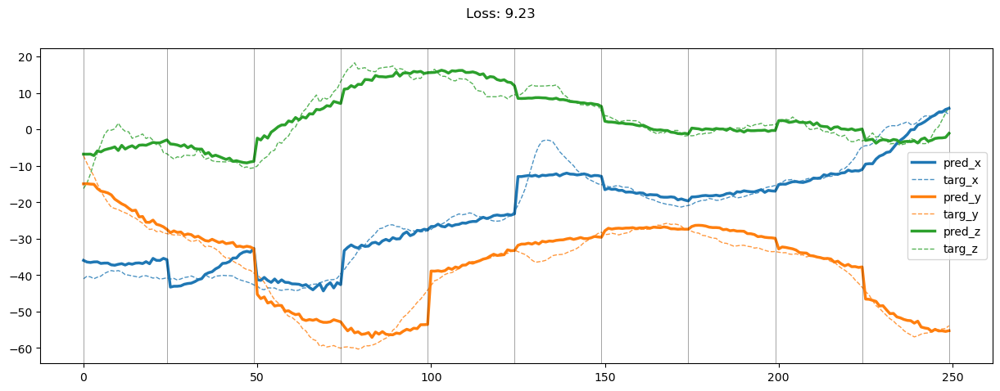

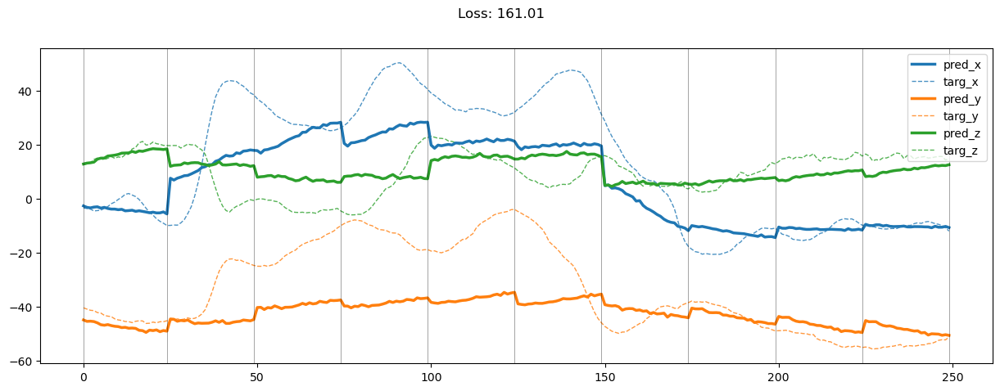

00249: train total loss:  22.471, pred loss:  11.236, valid total loss:  172.267, pred loss:  86.133


100%|██████████| 6/6 [00:00<00:00, 15.80it/s]


00250: train total loss:  23.063, pred loss:  11.531, valid total loss:  165.052, pred loss:  82.526


100%|██████████| 6/6 [00:00<00:00, 14.78it/s]


00251: train total loss:  22.394, pred loss:  11.197, valid total loss:  176.077, pred loss:  88.039


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


00252: train total loss:  21.873, pred loss:  10.937, valid total loss:  163.351, pred loss:  81.675


100%|██████████| 6/6 [00:00<00:00, 14.43it/s]


00253: train total loss:  22.351, pred loss:  11.175, valid total loss:  167.548, pred loss:  83.774


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00254: train total loss:  21.396, pred loss:  10.698, valid total loss:  173.239, pred loss:  86.619


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00255: train total loss:  21.519, pred loss:  10.759, valid total loss:  169.463, pred loss:  84.732


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00256: train total loss:  21.016, pred loss:  10.508, valid total loss:  175.440, pred loss:  87.720


100%|██████████| 6/6 [00:00<00:00, 15.58it/s]


00257: train total loss:  20.811, pred loss:  10.406, valid total loss:  167.872, pred loss:  83.936


100%|██████████| 6/6 [00:00<00:00, 15.23it/s]


00258: train total loss:  21.459, pred loss:  10.729, valid total loss:  167.904, pred loss:  83.952


100%|██████████| 6/6 [00:00<00:00, 13.18it/s]


00259: train total loss:  21.324, pred loss:  10.662, valid total loss:  171.565, pred loss:  85.783


100%|██████████| 6/6 [00:00<00:00, 13.94it/s]


00260: train total loss:  20.942, pred loss:  10.471, valid total loss:  161.245, pred loss:  80.623


100%|██████████| 6/6 [00:00<00:00, 15.66it/s]


00261: train total loss:  20.755, pred loss:  10.377, valid total loss:  169.223, pred loss:  84.612


100%|██████████| 6/6 [00:00<00:00, 13.87it/s]


00262: train total loss:  20.382, pred loss:  10.191, valid total loss:  172.511, pred loss:  86.255


100%|██████████| 6/6 [00:00<00:00, 13.24it/s]


00263: train total loss:  19.731, pred loss:  9.866, valid total loss:  182.483, pred loss:  91.242


100%|██████████| 6/6 [00:00<00:00, 18.22it/s]


00264: train total loss:  20.164, pred loss:  10.082, valid total loss:  175.747, pred loss:  87.874


100%|██████████| 6/6 [00:00<00:00, 15.22it/s]


00265: train total loss:  19.986, pred loss:  9.993, valid total loss:  168.572, pred loss:  84.286


100%|██████████| 6/6 [00:00<00:00, 16.38it/s]


00266: train total loss:  19.781, pred loss:  9.890, valid total loss:  170.543, pred loss:  85.271


100%|██████████| 6/6 [00:00<00:00, 13.82it/s]


00267: train total loss:  19.958, pred loss:  9.979, valid total loss:  166.041, pred loss:  83.020


100%|██████████| 6/6 [00:00<00:00, 13.45it/s]


00268: train total loss:  19.491, pred loss:  9.746, valid total loss:  166.730, pred loss:  83.365


100%|██████████| 6/6 [00:00<00:00, 15.42it/s]


00269: train total loss:  19.853, pred loss:  9.927, valid total loss:  170.761, pred loss:  85.381


100%|██████████| 6/6 [00:00<00:00, 15.44it/s]


00270: train total loss:  19.568, pred loss:  9.784, valid total loss:  165.882, pred loss:  82.941


100%|██████████| 6/6 [00:00<00:00, 13.20it/s]


00271: train total loss:  19.098, pred loss:  9.549, valid total loss:  175.596, pred loss:  87.798


100%|██████████| 6/6 [00:00<00:00, 13.59it/s]


00272: train total loss:  19.255, pred loss:  9.627, valid total loss:  174.737, pred loss:  87.369


100%|██████████| 6/6 [00:00<00:00, 15.73it/s]


00273: train total loss:  19.276, pred loss:  9.638, valid total loss:  170.184, pred loss:  85.092


100%|██████████| 6/6 [00:00<00:00, 14.34it/s]


00274: train total loss:  18.925, pred loss:  9.463, valid total loss:  176.168, pred loss:  88.084


100%|██████████| 6/6 [00:00<00:00, 13.40it/s]


00275: train total loss:  19.180, pred loss:  9.590, valid total loss:  175.190, pred loss:  87.595


100%|██████████| 6/6 [00:00<00:00, 14.82it/s]


00276: train total loss:  18.622, pred loss:  9.311, valid total loss:  167.665, pred loss:  83.833


100%|██████████| 6/6 [00:00<00:00, 15.55it/s]


00277: train total loss:  19.305, pred loss:  9.653, valid total loss:  165.505, pred loss:  82.753


100%|██████████| 6/6 [00:00<00:00, 13.57it/s]


00278: train total loss:  18.998, pred loss:  9.499, valid total loss:  165.979, pred loss:  82.990


100%|██████████| 6/6 [00:00<00:00, 13.35it/s]


00279: train total loss:  18.745, pred loss:  9.372, valid total loss:  171.168, pred loss:  85.584


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00280: train total loss:  18.666, pred loss:  9.333, valid total loss:  170.651, pred loss:  85.326


100%|██████████| 6/6 [00:00<00:00, 14.77it/s]


00281: train total loss:  18.379, pred loss:  9.190, valid total loss:  173.660, pred loss:  86.830


100%|██████████| 6/6 [00:00<00:00, 13.39it/s]


00282: train total loss:  17.897, pred loss:  8.949, valid total loss:  178.827, pred loss:  89.414


100%|██████████| 6/6 [00:00<00:00, 14.46it/s]


00283: train total loss:  18.316, pred loss:  9.158, valid total loss:  180.382, pred loss:  90.191


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00284: train total loss:  17.392, pred loss:  8.696, valid total loss:  167.741, pred loss:  83.871


100%|██████████| 6/6 [00:00<00:00, 13.49it/s]


00285: train total loss:  17.410, pred loss:  8.705, valid total loss:  174.984, pred loss:  87.492


100%|██████████| 6/6 [00:00<00:00, 13.39it/s]


00286: train total loss:  17.442, pred loss:  8.721, valid total loss:  169.991, pred loss:  84.996


100%|██████████| 6/6 [00:00<00:00, 15.49it/s]


00287: train total loss:  17.708, pred loss:  8.854, valid total loss:  179.014, pred loss:  89.507


100%|██████████| 6/6 [00:00<00:00, 15.32it/s]


00288: train total loss:  17.431, pred loss:  8.715, valid total loss:  170.018, pred loss:  85.009


100%|██████████| 6/6 [00:00<00:00, 13.39it/s]


00289: train total loss:  17.739, pred loss:  8.870, valid total loss:  172.207, pred loss:  86.103


100%|██████████| 6/6 [00:00<00:00, 13.78it/s]


00290: train total loss:  16.957, pred loss:  8.478, valid total loss:  173.590, pred loss:  86.795


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00291: train total loss:  17.098, pred loss:  8.549, valid total loss:  175.606, pred loss:  87.803


100%|██████████| 6/6 [00:00<00:00, 14.16it/s]


00292: train total loss:  17.045, pred loss:  8.523, valid total loss:  178.293, pred loss:  89.146


100%|██████████| 6/6 [00:00<00:00, 13.32it/s]


00293: train total loss:  17.061, pred loss:  8.531, valid total loss:  176.424, pred loss:  88.212


100%|██████████| 6/6 [00:00<00:00, 14.76it/s]


00294: train total loss:  17.287, pred loss:  8.643, valid total loss:  176.660, pred loss:  88.330


100%|██████████| 6/6 [00:00<00:00, 15.75it/s]


00295: train total loss:  16.679, pred loss:  8.340, valid total loss:  177.292, pred loss:  88.646


100%|██████████| 6/6 [00:00<00:00, 13.54it/s]


00296: train total loss:  16.858, pred loss:  8.429, valid total loss:  184.795, pred loss:  92.397


100%|██████████| 6/6 [00:00<00:00, 13.40it/s]


00297: train total loss:  18.095, pred loss:  9.047, valid total loss:  187.769, pred loss:  93.885


100%|██████████| 6/6 [00:00<00:00, 15.54it/s]


00298: train total loss:  18.109, pred loss:  9.054, valid total loss:  187.092, pred loss:  93.546


100%|██████████| 6/6 [00:00<00:00, 14.61it/s]


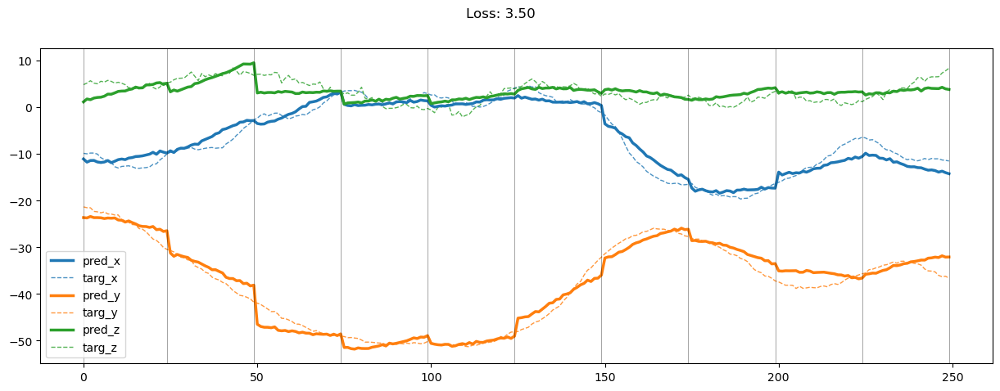

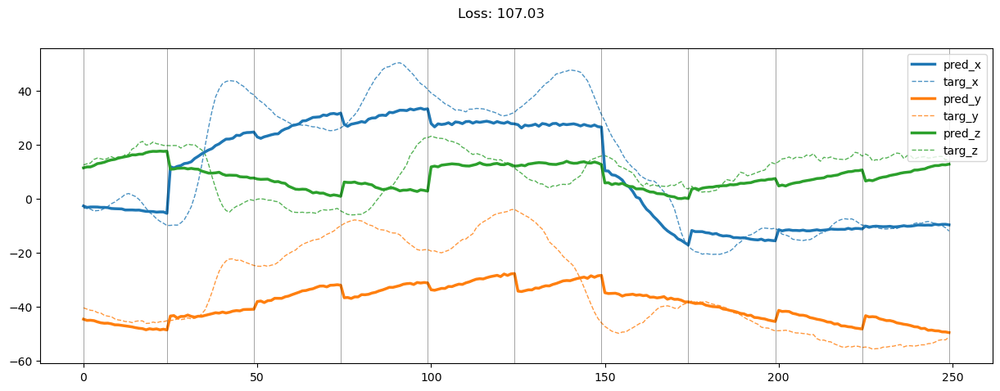

00299: train total loss:  17.534, pred loss:  8.767, valid total loss:  176.065, pred loss:  88.033


100%|██████████| 6/6 [00:00<00:00, 14.55it/s]


00300: train total loss:  17.935, pred loss:  8.968, valid total loss:  177.840, pred loss:  88.920


100%|██████████| 6/6 [00:00<00:00, 15.75it/s]


00301: train total loss:  17.358, pred loss:  8.679, valid total loss:  185.607, pred loss:  92.803


100%|██████████| 6/6 [00:00<00:00, 13.38it/s]


00302: train total loss:  17.365, pred loss:  8.682, valid total loss:  176.905, pred loss:  88.452


100%|██████████| 6/6 [00:00<00:00, 13.46it/s]


00303: train total loss:  17.214, pred loss:  8.607, valid total loss:  185.614, pred loss:  92.807


100%|██████████| 6/6 [00:00<00:00, 15.53it/s]


00304: train total loss:  16.708, pred loss:  8.354, valid total loss:  186.225, pred loss:  93.113


100%|██████████| 6/6 [00:00<00:00, 15.44it/s]


00305: train total loss:  16.071, pred loss:  8.035, valid total loss:  179.173, pred loss:  89.587


100%|██████████| 6/6 [00:00<00:00, 13.06it/s]


00306: train total loss:  16.477, pred loss:  8.238, valid total loss:  171.246, pred loss:  85.623


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00307: train total loss:  16.411, pred loss:  8.205, valid total loss:  171.153, pred loss:  85.576


100%|██████████| 6/6 [00:00<00:00, 15.79it/s]


00308: train total loss:  16.510, pred loss:  8.255, valid total loss:  178.399, pred loss:  89.200


100%|██████████| 6/6 [00:00<00:00, 13.89it/s]


00309: train total loss:  16.324, pred loss:  8.162, valid total loss:  176.308, pred loss:  88.154


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00310: train total loss:  16.117, pred loss:  8.059, valid total loss:  192.590, pred loss:  96.295


100%|██████████| 6/6 [00:00<00:00, 14.94it/s]


00311: train total loss:  15.743, pred loss:  7.872, valid total loss:  187.115, pred loss:  93.557


100%|██████████| 6/6 [00:00<00:00, 15.85it/s]


00312: train total loss:  15.774, pred loss:  7.887, valid total loss:  181.905, pred loss:  90.952


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00313: train total loss:  16.040, pred loss:  8.020, valid total loss:  201.298, pred loss:  100.649


100%|██████████| 6/6 [00:00<00:00, 12.95it/s]


00314: train total loss:  15.934, pred loss:  7.967, valid total loss:  178.745, pred loss:  89.373


100%|██████████| 6/6 [00:00<00:00, 15.64it/s]


00315: train total loss:  16.144, pred loss:  8.072, valid total loss:  186.082, pred loss:  93.041


100%|██████████| 6/6 [00:00<00:00, 14.61it/s]


00316: train total loss:  15.726, pred loss:  7.863, valid total loss:  172.738, pred loss:  86.369


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00317: train total loss:  15.858, pred loss:  7.929, valid total loss:  169.339, pred loss:  84.670


100%|██████████| 6/6 [00:00<00:00, 14.70it/s]


00318: train total loss:  15.398, pred loss:  7.699, valid total loss:  170.711, pred loss:  85.355


100%|██████████| 6/6 [00:00<00:00, 15.79it/s]


00319: train total loss:  15.903, pred loss:  7.952, valid total loss:  173.363, pred loss:  86.681


100%|██████████| 6/6 [00:00<00:00, 13.40it/s]


00320: train total loss:  15.260, pred loss:  7.630, valid total loss:  173.808, pred loss:  86.904


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00321: train total loss:  15.256, pred loss:  7.628, valid total loss:  180.081, pred loss:  90.040


100%|██████████| 6/6 [00:00<00:00, 15.70it/s]


00322: train total loss:  15.289, pred loss:  7.645, valid total loss:  173.100, pred loss:  86.550


100%|██████████| 6/6 [00:00<00:00, 15.29it/s]


00323: train total loss:  15.184, pred loss:  7.592, valid total loss:  172.643, pred loss:  86.321


100%|██████████| 6/6 [00:00<00:00, 13.44it/s]


00324: train total loss:  15.012, pred loss:  7.506, valid total loss:  182.748, pred loss:  91.374


100%|██████████| 6/6 [00:00<00:00, 13.99it/s]


00325: train total loss:  15.304, pred loss:  7.652, valid total loss:  187.424, pred loss:  93.712


100%|██████████| 6/6 [00:00<00:00, 15.65it/s]


00326: train total loss:  15.236, pred loss:  7.618, valid total loss:  189.066, pred loss:  94.533


100%|██████████| 6/6 [00:00<00:00, 13.84it/s]


00327: train total loss:  15.600, pred loss:  7.800, valid total loss:  176.104, pred loss:  88.052


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


00328: train total loss:  15.274, pred loss:  7.637, valid total loss:  177.989, pred loss:  88.994


100%|██████████| 6/6 [00:00<00:00, 15.30it/s]


00329: train total loss:  16.241, pred loss:  8.120, valid total loss:  178.957, pred loss:  89.479


100%|██████████| 6/6 [00:00<00:00, 15.80it/s]


00330: train total loss:  15.562, pred loss:  7.781, valid total loss:  183.307, pred loss:  91.654


100%|██████████| 6/6 [00:00<00:00, 13.54it/s]


00331: train total loss:  15.140, pred loss:  7.570, valid total loss:  181.578, pred loss:  90.789


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00332: train total loss:  14.796, pred loss:  7.398, valid total loss:  168.759, pred loss:  84.379


100%|██████████| 6/6 [00:00<00:00, 15.73it/s]


00333: train total loss:  14.814, pred loss:  7.407, valid total loss:  170.284, pred loss:  85.142


100%|██████████| 6/6 [00:00<00:00, 15.10it/s]


00334: train total loss:  14.754, pred loss:  7.377, valid total loss:  174.288, pred loss:  87.144


100%|██████████| 6/6 [00:00<00:00, 13.46it/s]


00335: train total loss:  14.590, pred loss:  7.295, valid total loss:  170.148, pred loss:  85.074


100%|██████████| 6/6 [00:00<00:00, 14.27it/s]


00336: train total loss:  14.692, pred loss:  7.346, valid total loss:  165.682, pred loss:  82.841


100%|██████████| 6/6 [00:00<00:00, 15.67it/s]


00337: train total loss:  14.529, pred loss:  7.264, valid total loss:  164.988, pred loss:  82.494


100%|██████████| 6/6 [00:00<00:00, 13.83it/s]


00338: train total loss:  14.598, pred loss:  7.299, valid total loss:  164.114, pred loss:  82.057


100%|██████████| 6/6 [00:00<00:00, 13.68it/s]


00339: train total loss:  14.346, pred loss:  7.173, valid total loss:  165.374, pred loss:  82.687


100%|██████████| 6/6 [00:00<00:00, 15.38it/s]


00340: train total loss:  13.852, pred loss:  6.926, valid total loss:  165.788, pred loss:  82.894


100%|██████████| 6/6 [00:00<00:00, 15.84it/s]


00341: train total loss:  14.235, pred loss:  7.117, valid total loss:  169.789, pred loss:  84.894


100%|██████████| 6/6 [00:00<00:00, 13.72it/s]


00342: train total loss:  14.102, pred loss:  7.051, valid total loss:  174.377, pred loss:  87.189


100%|██████████| 6/6 [00:00<00:00, 13.36it/s]


00343: train total loss:  14.379, pred loss:  7.190, valid total loss:  178.430, pred loss:  89.215


100%|██████████| 6/6 [00:00<00:00, 15.66it/s]


00344: train total loss:  14.622, pred loss:  7.311, valid total loss:  180.346, pred loss:  90.173


100%|██████████| 6/6 [00:00<00:00, 17.23it/s]


00345: train total loss:  14.125, pred loss:  7.063, valid total loss:  181.469, pred loss:  90.734


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00346: train total loss:  14.161, pred loss:  7.080, valid total loss:  187.036, pred loss:  93.518


100%|██████████| 6/6 [00:00<00:00, 13.49it/s]


00347: train total loss:  14.631, pred loss:  7.316, valid total loss:  187.121, pred loss:  93.561


100%|██████████| 6/6 [00:00<00:00, 15.34it/s]


00348: train total loss:  14.506, pred loss:  7.253, valid total loss:  179.574, pred loss:  89.787


100%|██████████| 6/6 [00:00<00:00, 15.73it/s]


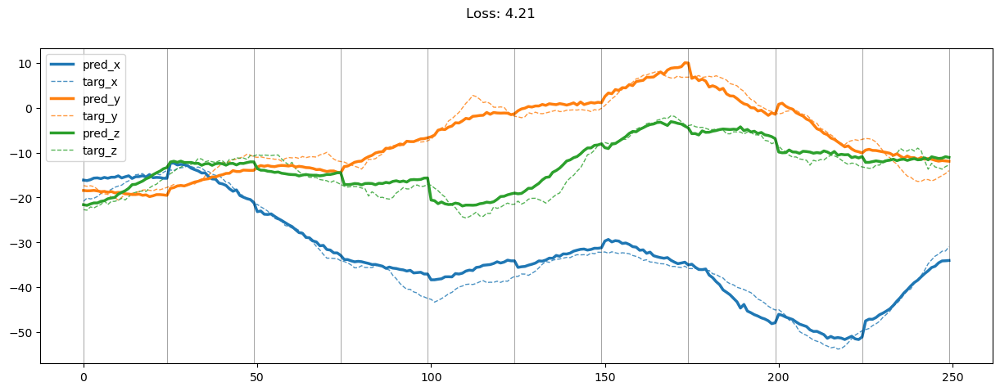

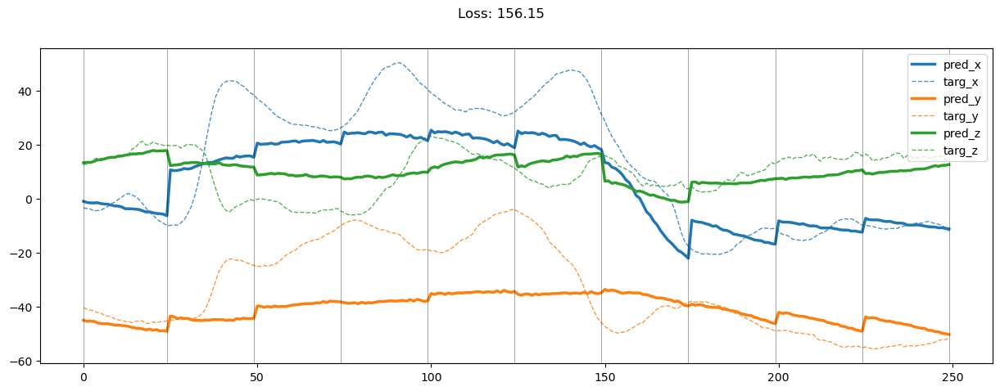

00349: train total loss:  14.307, pred loss:  7.153, valid total loss:  176.471, pred loss:  88.236


100%|██████████| 6/6 [00:00<00:00, 13.92it/s]


00350: train total loss:  14.088, pred loss:  7.044, valid total loss:  182.368, pred loss:  91.184


100%|██████████| 6/6 [00:00<00:00, 15.84it/s]


00351: train total loss:  14.037, pred loss:  7.019, valid total loss:  177.357, pred loss:  88.679


100%|██████████| 6/6 [00:00<00:00, 14.34it/s]


00352: train total loss:  13.606, pred loss:  6.803, valid total loss:  174.374, pred loss:  87.187


100%|██████████| 6/6 [00:00<00:00, 13.55it/s]


00353: train total loss:  13.507, pred loss:  6.754, valid total loss:  175.649, pred loss:  87.824


100%|██████████| 6/6 [00:00<00:00, 14.87it/s]


00354: train total loss:  13.372, pred loss:  6.686, valid total loss:  182.047, pred loss:  91.023


100%|██████████| 6/6 [00:00<00:00, 15.58it/s]


00355: train total loss:  13.310, pred loss:  6.655, valid total loss:  184.583, pred loss:  92.292


100%|██████████| 6/6 [00:00<00:00, 13.41it/s]


00356: train total loss:  12.952, pred loss:  6.476, valid total loss:  186.356, pred loss:  93.178


100%|██████████| 6/6 [00:00<00:00, 13.68it/s]


00357: train total loss:  13.294, pred loss:  6.647, valid total loss:  186.071, pred loss:  93.035


100%|██████████| 6/6 [00:00<00:00, 15.71it/s]


00358: train total loss:  12.985, pred loss:  6.492, valid total loss:  181.359, pred loss:  90.680


100%|██████████| 6/6 [00:00<00:00, 15.42it/s]


00359: train total loss:  12.981, pred loss:  6.490, valid total loss:  184.492, pred loss:  92.246


100%|██████████| 6/6 [00:00<00:00, 13.61it/s]


00360: train total loss:  12.840, pred loss:  6.420, valid total loss:  181.241, pred loss:  90.620


100%|██████████| 6/6 [00:00<00:00, 13.90it/s]


00361: train total loss:  13.363, pred loss:  6.682, valid total loss:  173.414, pred loss:  86.707


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00362: train total loss:  13.425, pred loss:  6.713, valid total loss:  188.777, pred loss:  94.389


100%|██████████| 6/6 [00:00<00:00, 14.50it/s]


00363: train total loss:  13.273, pred loss:  6.637, valid total loss:  192.193, pred loss:  96.096


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00364: train total loss:  13.072, pred loss:  6.536, valid total loss:  190.313, pred loss:  95.157


100%|██████████| 6/6 [00:00<00:00, 14.73it/s]


00365: train total loss:  13.625, pred loss:  6.812, valid total loss:  184.863, pred loss:  92.432


100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


00366: train total loss:  13.206, pred loss:  6.603, valid total loss:  188.613, pred loss:  94.307


100%|██████████| 6/6 [00:00<00:00, 13.52it/s]


00367: train total loss:  13.149, pred loss:  6.575, valid total loss:  188.143, pred loss:  94.071


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00368: train total loss:  12.820, pred loss:  6.410, valid total loss:  184.222, pred loss:  92.111


100%|██████████| 6/6 [00:00<00:00, 15.76it/s]


00369: train total loss:  12.520, pred loss:  6.260, valid total loss:  190.943, pred loss:  95.471


100%|██████████| 6/6 [00:00<00:00, 14.75it/s]


00370: train total loss:  12.234, pred loss:  6.117, valid total loss:  182.802, pred loss:  91.401


100%|██████████| 6/6 [00:00<00:00, 13.49it/s]


00371: train total loss:  12.757, pred loss:  6.378, valid total loss:  183.357, pred loss:  91.679


100%|██████████| 6/6 [00:00<00:00, 14.56it/s]


00372: train total loss:  13.069, pred loss:  6.534, valid total loss:  193.163, pred loss:  96.582


100%|██████████| 6/6 [00:00<00:00, 15.75it/s]


00373: train total loss:  12.921, pred loss:  6.460, valid total loss:  194.264, pred loss:  97.132


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00374: train total loss:  13.540, pred loss:  6.770, valid total loss:  182.138, pred loss:  91.069


100%|██████████| 6/6 [00:00<00:00, 13.61it/s]


00375: train total loss:  13.575, pred loss:  6.787, valid total loss:  178.681, pred loss:  89.341


100%|██████████| 6/6 [00:00<00:00, 15.66it/s]


00376: train total loss:  13.062, pred loss:  6.531, valid total loss:  179.165, pred loss:  89.583


100%|██████████| 6/6 [00:00<00:00, 15.28it/s]


00377: train total loss:  12.870, pred loss:  6.435, valid total loss:  183.224, pred loss:  91.612


100%|██████████| 6/6 [00:00<00:00, 13.39it/s]


00378: train total loss:  12.855, pred loss:  6.427, valid total loss:  186.408, pred loss:  93.204


100%|██████████| 6/6 [00:00<00:00, 14.21it/s]


00379: train total loss:  13.064, pred loss:  6.532, valid total loss:  194.265, pred loss:  97.132


100%|██████████| 6/6 [00:00<00:00, 15.73it/s]


00380: train total loss:  13.702, pred loss:  6.851, valid total loss:  187.712, pred loss:  93.856


100%|██████████| 6/6 [00:00<00:00, 14.13it/s]


00381: train total loss:  13.635, pred loss:  6.818, valid total loss:  180.480, pred loss:  90.240


100%|██████████| 6/6 [00:00<00:00, 13.50it/s]


00382: train total loss:  13.910, pred loss:  6.955, valid total loss:  175.439, pred loss:  87.719


100%|██████████| 6/6 [00:00<00:00, 15.07it/s]


00383: train total loss:  13.038, pred loss:  6.519, valid total loss:  196.549, pred loss:  98.275


100%|██████████| 6/6 [00:00<00:00, 15.88it/s]


00384: train total loss:  12.983, pred loss:  6.492, valid total loss:  185.309, pred loss:  92.655


100%|██████████| 6/6 [00:00<00:00, 13.59it/s]


00385: train total loss:  13.487, pred loss:  6.743, valid total loss:  176.627, pred loss:  88.313


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


00386: train total loss:  13.722, pred loss:  6.861, valid total loss:  197.792, pred loss:  98.896


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00387: train total loss:  13.453, pred loss:  6.727, valid total loss:  203.988, pred loss:  101.994


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00388: train total loss:  12.832, pred loss:  6.416, valid total loss:  196.512, pred loss:  98.256


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00389: train total loss:  12.682, pred loss:  6.341, valid total loss:  191.663, pred loss:  95.832


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00390: train total loss:  12.073, pred loss:  6.036, valid total loss:  186.871, pred loss:  93.436


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00391: train total loss:  12.653, pred loss:  6.327, valid total loss:  188.463, pred loss:  94.232


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00392: train total loss:  12.187, pred loss:  6.094, valid total loss:  184.560, pred loss:  92.280


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00393: train total loss:  12.625, pred loss:  6.313, valid total loss:  168.913, pred loss:  84.457


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00394: train total loss:  11.952, pred loss:  5.976, valid total loss:  187.048, pred loss:  93.524


100%|██████████| 6/6 [00:00<00:00, 19.12it/s]


00395: train total loss:  12.082, pred loss:  6.041, valid total loss:  197.180, pred loss:  98.590


100%|██████████| 6/6 [00:00<00:00, 18.58it/s]


00396: train total loss:  11.926, pred loss:  5.963, valid total loss:  196.520, pred loss:  98.260


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00397: train total loss:  11.676, pred loss:  5.838, valid total loss:  184.229, pred loss:  92.115


100%|██████████| 6/6 [00:00<00:00, 17.65it/s]


00398: train total loss:  11.901, pred loss:  5.951, valid total loss:  188.835, pred loss:  94.417


100%|██████████| 6/6 [00:00<00:00, 18.30it/s]


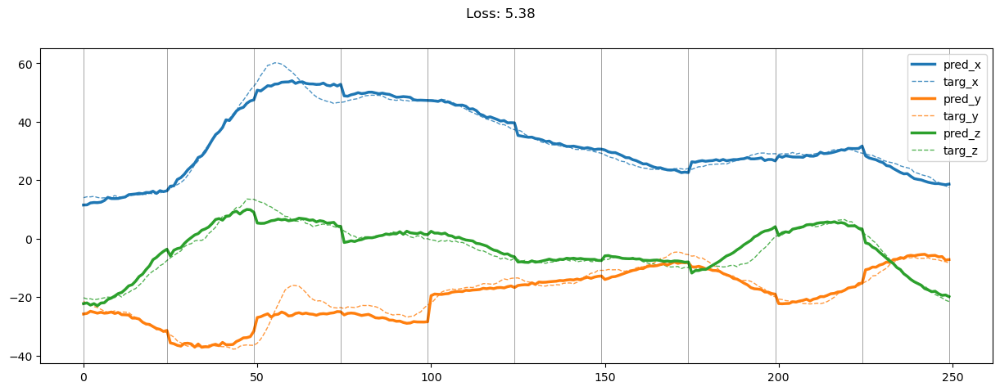

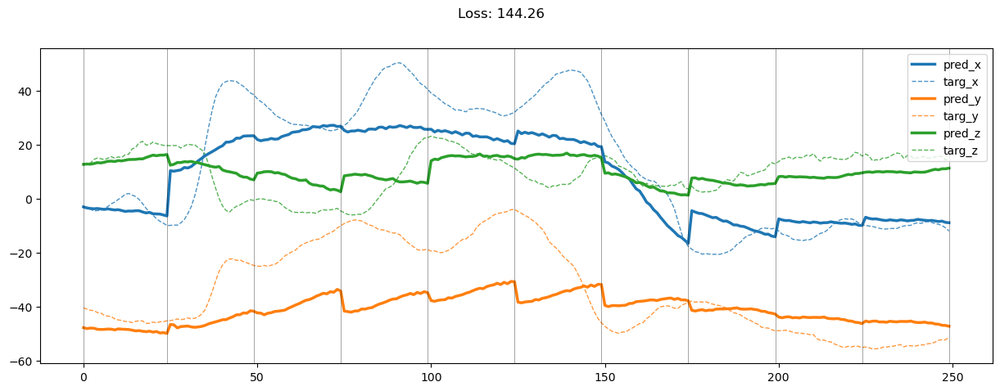

00399: train total loss:  11.910, pred loss:  5.955, valid total loss:  184.363, pred loss:  92.181


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


00400: train total loss:  11.749, pred loss:  5.875, valid total loss:  182.662, pred loss:  91.331


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00401: train total loss:  11.733, pred loss:  5.866, valid total loss:  181.752, pred loss:  90.876


100%|██████████| 6/6 [00:00<00:00, 17.64it/s]


00402: train total loss:  11.448, pred loss:  5.724, valid total loss:  173.856, pred loss:  86.928


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00403: train total loss:  11.438, pred loss:  5.719, valid total loss:  171.778, pred loss:  85.889


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


00404: train total loss:  11.525, pred loss:  5.762, valid total loss:  171.206, pred loss:  85.603


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00405: train total loss:  11.133, pred loss:  5.566, valid total loss:  181.154, pred loss:  90.577


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00406: train total loss:  11.820, pred loss:  5.910, valid total loss:  174.813, pred loss:  87.406


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00407: train total loss:  11.677, pred loss:  5.838, valid total loss:  187.445, pred loss:  93.722


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00408: train total loss:  11.600, pred loss:  5.800, valid total loss:  192.951, pred loss:  96.476


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00409: train total loss:  11.508, pred loss:  5.754, valid total loss:  183.996, pred loss:  91.998


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00410: train total loss:  11.527, pred loss:  5.763, valid total loss:  181.543, pred loss:  90.772


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00411: train total loss:  11.816, pred loss:  5.908, valid total loss:  188.443, pred loss:  94.221


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00412: train total loss:  11.591, pred loss:  5.795, valid total loss:  188.505, pred loss:  94.252


100%|██████████| 6/6 [00:00<00:00, 20.85it/s]


00413: train total loss:  11.075, pred loss:  5.537, valid total loss:  190.048, pred loss:  95.024


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00414: train total loss:  11.083, pred loss:  5.541, valid total loss:  183.898, pred loss:  91.949


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00415: train total loss:  11.079, pred loss:  5.539, valid total loss:  187.129, pred loss:  93.564


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


00416: train total loss:  11.424, pred loss:  5.712, valid total loss:  176.635, pred loss:  88.317


100%|██████████| 6/6 [00:00<00:00, 18.50it/s]


00417: train total loss:  11.307, pred loss:  5.654, valid total loss:  179.209, pred loss:  89.605


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00418: train total loss:  11.045, pred loss:  5.523, valid total loss:  188.073, pred loss:  94.036


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00419: train total loss:  11.396, pred loss:  5.698, valid total loss:  184.063, pred loss:  92.031


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00420: train total loss:  11.357, pred loss:  5.678, valid total loss:  178.125, pred loss:  89.063


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00421: train total loss:  10.770, pred loss:  5.385, valid total loss:  170.470, pred loss:  85.235


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00422: train total loss:  10.938, pred loss:  5.469, valid total loss:  169.128, pred loss:  84.564


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


00423: train total loss:  10.908, pred loss:  5.454, valid total loss:  180.989, pred loss:  90.495


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00424: train total loss:  10.704, pred loss:  5.352, valid total loss:  184.498, pred loss:  92.249


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00425: train total loss:  10.851, pred loss:  5.425, valid total loss:  192.959, pred loss:  96.479


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


00426: train total loss:  10.489, pred loss:  5.245, valid total loss:  195.940, pred loss:  97.970


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00427: train total loss:  10.771, pred loss:  5.385, valid total loss:  185.956, pred loss:  92.978


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


00428: train total loss:  10.776, pred loss:  5.388, valid total loss:  185.588, pred loss:  92.794


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00429: train total loss:  10.634, pred loss:  5.317, valid total loss:  184.248, pred loss:  92.124


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


00430: train total loss:  10.782, pred loss:  5.391, valid total loss:  182.045, pred loss:  91.022


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00431: train total loss:  10.414, pred loss:  5.207, valid total loss:  175.041, pred loss:  87.521


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00432: train total loss:  10.590, pred loss:  5.295, valid total loss:  181.711, pred loss:  90.855


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


00433: train total loss:  10.531, pred loss:  5.266, valid total loss:  170.776, pred loss:  85.388


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


00434: train total loss:  10.434, pred loss:  5.217, valid total loss:  177.279, pred loss:  88.640


100%|██████████| 6/6 [00:00<00:00, 18.32it/s]


00435: train total loss:  10.938, pred loss:  5.469, valid total loss:  186.809, pred loss:  93.404


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


00436: train total loss:  10.577, pred loss:  5.288, valid total loss:  191.377, pred loss:  95.689


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


00437: train total loss:  10.439, pred loss:  5.219, valid total loss:  190.746, pred loss:  95.373


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


00438: train total loss:  10.269, pred loss:  5.134, valid total loss:  176.145, pred loss:  88.072


100%|██████████| 6/6 [00:00<00:00, 17.57it/s]


00439: train total loss:  10.439, pred loss:  5.219, valid total loss:  171.915, pred loss:  85.958


100%|██████████| 6/6 [00:00<00:00, 19.23it/s]


00440: train total loss:  10.298, pred loss:  5.149, valid total loss:  192.637, pred loss:  96.318


100%|██████████| 6/6 [00:00<00:00, 19.58it/s]


00441: train total loss:  10.269, pred loss:  5.134, valid total loss:  191.623, pred loss:  95.811


100%|██████████| 6/6 [00:00<00:00, 18.61it/s]


00442: train total loss:  10.208, pred loss:  5.104, valid total loss:  182.449, pred loss:  91.224


100%|██████████| 6/6 [00:00<00:00, 18.92it/s]


00443: train total loss:  10.162, pred loss:  5.081, valid total loss:  176.353, pred loss:  88.176


100%|██████████| 6/6 [00:00<00:00, 17.27it/s]


00444: train total loss:  10.234, pred loss:  5.117, valid total loss:  168.377, pred loss:  84.188


100%|██████████| 6/6 [00:00<00:00, 17.76it/s]


00445: train total loss:  10.027, pred loss:  5.013, valid total loss:  169.482, pred loss:  84.741


100%|██████████| 6/6 [00:00<00:00, 17.51it/s]


00446: train total loss:  10.901, pred loss:  5.450, valid total loss:  171.810, pred loss:  85.905


100%|██████████| 6/6 [00:00<00:00, 17.93it/s]


00447: train total loss:  10.650, pred loss:  5.325, valid total loss:  181.559, pred loss:  90.779


100%|██████████| 6/6 [00:00<00:00, 17.39it/s]


00448: train total loss:  10.422, pred loss:  5.211, valid total loss:  192.142, pred loss:  96.071


100%|██████████| 6/6 [00:00<00:00, 18.81it/s]


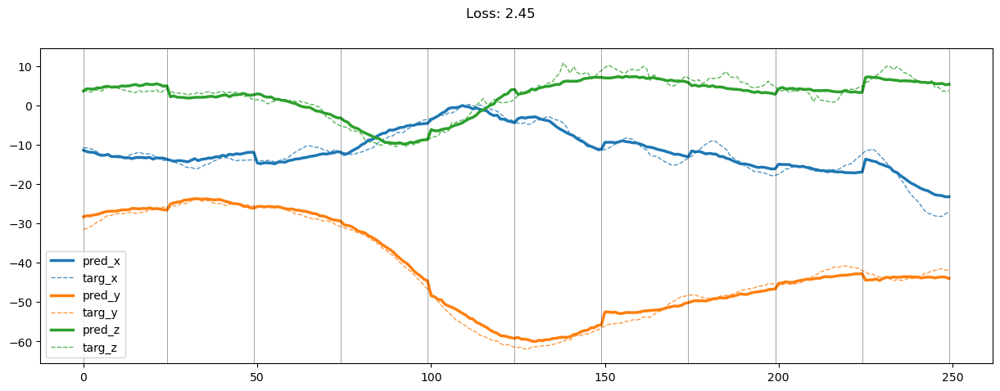

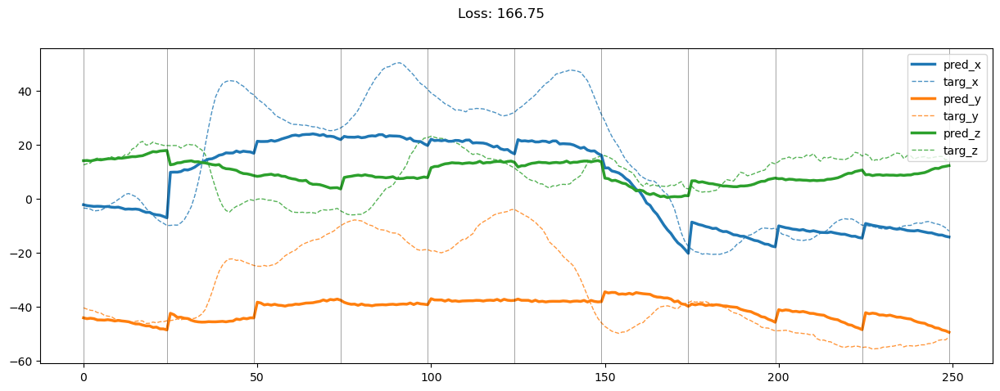

00449: train total loss:  10.000, pred loss:  5.000, valid total loss:  180.878, pred loss:  90.439


100%|██████████| 6/6 [00:00<00:00, 19.07it/s]


00450: train total loss:  10.336, pred loss:  5.168, valid total loss:  177.706, pred loss:  88.853


100%|██████████| 6/6 [00:00<00:00, 17.57it/s]


00451: train total loss:  10.304, pred loss:  5.152, valid total loss:  185.989, pred loss:  92.995


100%|██████████| 6/6 [00:00<00:00, 17.64it/s]


00452: train total loss:  10.263, pred loss:  5.131, valid total loss:  180.485, pred loss:  90.242


100%|██████████| 6/6 [00:00<00:00, 14.14it/s]


00453: train total loss:  10.452, pred loss:  5.226, valid total loss:  174.401, pred loss:  87.201


100%|██████████| 6/6 [00:00<00:00, 13.60it/s]


00454: train total loss:  10.267, pred loss:  5.134, valid total loss:  178.383, pred loss:  89.191


100%|██████████| 6/6 [00:00<00:00, 18.32it/s]


00455: train total loss:  9.812, pred loss:  4.906, valid total loss:  183.431, pred loss:  91.715


100%|██████████| 6/6 [00:00<00:00, 16.22it/s]


00456: train total loss:  9.841, pred loss:  4.920, valid total loss:  180.183, pred loss:  90.091


100%|██████████| 6/6 [00:00<00:00, 16.08it/s]


00457: train total loss:  9.786, pred loss:  4.893, valid total loss:  180.590, pred loss:  90.295


100%|██████████| 6/6 [00:00<00:00, 15.89it/s]


00458: train total loss:  9.964, pred loss:  4.982, valid total loss:  181.044, pred loss:  90.522


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00459: train total loss:  9.699, pred loss:  4.849, valid total loss:  182.769, pred loss:  91.385


100%|██████████| 6/6 [00:00<00:00, 14.70it/s]


00460: train total loss:  9.730, pred loss:  4.865, valid total loss:  182.861, pred loss:  91.431


100%|██████████| 6/6 [00:00<00:00, 15.77it/s]


00461: train total loss:  9.790, pred loss:  4.895, valid total loss:  181.392, pred loss:  90.696


100%|██████████| 6/6 [00:00<00:00, 13.54it/s]


00462: train total loss:  9.752, pred loss:  4.876, valid total loss:  181.249, pred loss:  90.625


100%|██████████| 6/6 [00:00<00:00, 13.59it/s]


00463: train total loss:  9.492, pred loss:  4.746, valid total loss:  174.372, pred loss:  87.186


100%|██████████| 6/6 [00:00<00:00, 15.71it/s]


00464: train total loss:  9.755, pred loss:  4.878, valid total loss:  184.033, pred loss:  92.017


100%|██████████| 6/6 [00:00<00:00, 15.49it/s]


00465: train total loss:  9.635, pred loss:  4.817, valid total loss:  186.363, pred loss:  93.181


100%|██████████| 6/6 [00:00<00:00, 13.59it/s]


00466: train total loss:  9.486, pred loss:  4.743, valid total loss:  179.845, pred loss:  89.922


100%|██████████| 6/6 [00:00<00:00, 13.71it/s]


00467: train total loss:  9.513, pred loss:  4.756, valid total loss:  181.450, pred loss:  90.725


100%|██████████| 6/6 [00:00<00:00, 15.87it/s]


00468: train total loss:  9.525, pred loss:  4.763, valid total loss:  181.466, pred loss:  90.733


100%|██████████| 6/6 [00:00<00:00, 15.22it/s]


00469: train total loss:  9.680, pred loss:  4.840, valid total loss:  185.260, pred loss:  92.630


100%|██████████| 6/6 [00:00<00:00, 13.45it/s]


00470: train total loss:  9.803, pred loss:  4.902, valid total loss:  186.598, pred loss:  93.299


100%|██████████| 6/6 [00:00<00:00, 14.22it/s]


00471: train total loss:  9.784, pred loss:  4.892, valid total loss:  181.003, pred loss:  90.502


100%|██████████| 6/6 [00:00<00:00, 15.68it/s]


00472: train total loss:  10.226, pred loss:  5.113, valid total loss:  175.969, pred loss:  87.985


100%|██████████| 6/6 [00:00<00:00, 14.20it/s]


00473: train total loss:  10.288, pred loss:  5.144, valid total loss:  177.498, pred loss:  88.749


100%|██████████| 6/6 [00:00<00:00, 13.52it/s]


00474: train total loss:  10.405, pred loss:  5.202, valid total loss:  183.184, pred loss:  91.592


100%|██████████| 6/6 [00:00<00:00, 15.01it/s]


00475: train total loss:  10.306, pred loss:  5.153, valid total loss:  175.725, pred loss:  87.862


100%|██████████| 6/6 [00:00<00:00, 15.86it/s]


00476: train total loss:  10.175, pred loss:  5.087, valid total loss:  185.579, pred loss:  92.789


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00477: train total loss:  10.468, pred loss:  5.234, valid total loss:  179.710, pred loss:  89.855


100%|██████████| 6/6 [00:00<00:00, 13.38it/s]


00478: train total loss:  10.051, pred loss:  5.026, valid total loss:  173.166, pred loss:  86.583


100%|██████████| 6/6 [00:00<00:00, 15.76it/s]


00479: train total loss:  10.141, pred loss:  5.070, valid total loss:  178.236, pred loss:  89.118


100%|██████████| 6/6 [00:00<00:00, 14.82it/s]


00480: train total loss:  10.039, pred loss:  5.019, valid total loss:  179.474, pred loss:  89.737


100%|██████████| 6/6 [00:00<00:00, 13.64it/s]


00481: train total loss:  9.904, pred loss:  4.952, valid total loss:  175.421, pred loss:  87.711


100%|██████████| 6/6 [00:00<00:00, 14.16it/s]


00482: train total loss:  10.065, pred loss:  5.032, valid total loss:  173.839, pred loss:  86.919


100%|██████████| 6/6 [00:00<00:00, 15.70it/s]


00483: train total loss:  9.870, pred loss:  4.935, valid total loss:  172.300, pred loss:  86.150


100%|██████████| 6/6 [00:00<00:00, 14.13it/s]


00484: train total loss:  9.469, pred loss:  4.735, valid total loss:  172.669, pred loss:  86.334


100%|██████████| 6/6 [00:00<00:00, 13.62it/s]


00485: train total loss:  9.586, pred loss:  4.793, valid total loss:  180.242, pred loss:  90.121


100%|██████████| 6/6 [00:00<00:00, 14.87it/s]


00486: train total loss:  9.624, pred loss:  4.812, valid total loss:  180.911, pred loss:  90.455


100%|██████████| 6/6 [00:00<00:00, 16.01it/s]


00487: train total loss:  9.542, pred loss:  4.771, valid total loss:  178.171, pred loss:  89.086


100%|██████████| 6/6 [00:00<00:00, 13.44it/s]


00488: train total loss:  9.677, pred loss:  4.838, valid total loss:  180.145, pred loss:  90.073


100%|██████████| 6/6 [00:00<00:00, 13.28it/s]


00489: train total loss:  9.413, pred loss:  4.706, valid total loss:  175.451, pred loss:  87.726


100%|██████████| 6/6 [00:00<00:00, 15.54it/s]


00490: train total loss:  9.523, pred loss:  4.761, valid total loss:  173.093, pred loss:  86.547


100%|██████████| 6/6 [00:00<00:00, 15.18it/s]


00491: train total loss:  9.635, pred loss:  4.817, valid total loss:  177.146, pred loss:  88.573


100%|██████████| 6/6 [00:00<00:00, 13.59it/s]


00492: train total loss:  9.553, pred loss:  4.777, valid total loss:  170.617, pred loss:  85.308


100%|██████████| 6/6 [00:00<00:00, 13.71it/s]


00493: train total loss:  9.445, pred loss:  4.722, valid total loss:  175.796, pred loss:  87.898


100%|██████████| 6/6 [00:00<00:00, 15.58it/s]


00494: train total loss:  8.899, pred loss:  4.449, valid total loss:  178.213, pred loss:  89.106


100%|██████████| 6/6 [00:00<00:00, 14.27it/s]


00495: train total loss:  8.898, pred loss:  4.449, valid total loss:  183.732, pred loss:  91.866


100%|██████████| 6/6 [00:00<00:00, 13.37it/s]


00496: train total loss:  9.097, pred loss:  4.548, valid total loss:  176.675, pred loss:  88.338


100%|██████████| 6/6 [00:00<00:00, 14.68it/s]


00497: train total loss:  9.072, pred loss:  4.536, valid total loss:  175.412, pred loss:  87.706


100%|██████████| 6/6 [00:00<00:00, 15.76it/s]


00498: train total loss:  9.946, pred loss:  4.973, valid total loss:  174.330, pred loss:  87.165


100%|██████████| 6/6 [00:00<00:00, 13.24it/s]


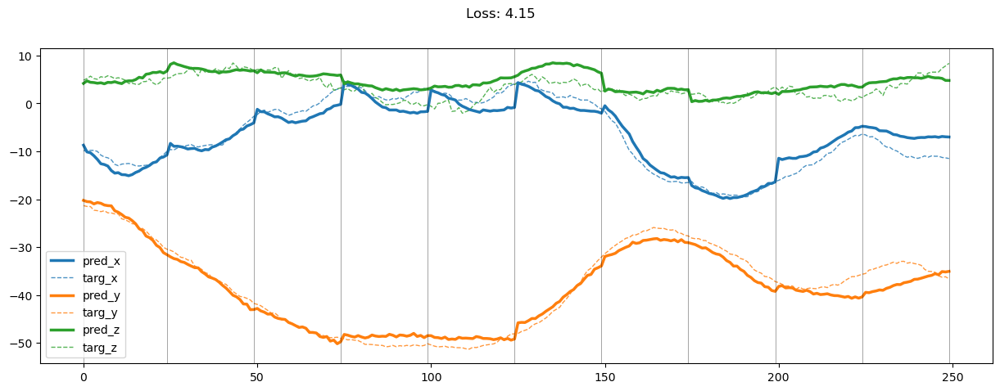

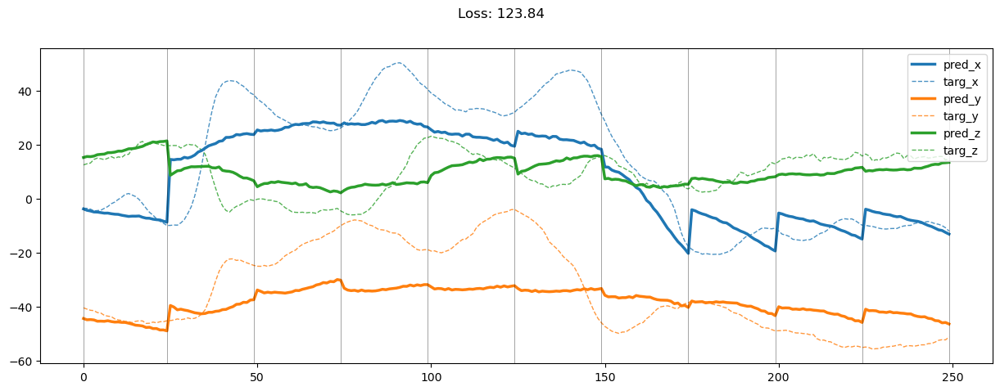

00499: train total loss:  10.369, pred loss:  5.184, valid total loss:  165.603, pred loss:  82.802


100%|██████████| 6/6 [00:00<00:00, 15.73it/s]


00500: train total loss:  10.351, pred loss:  5.176, valid total loss:  166.709, pred loss:  83.355


100%|██████████| 6/6 [00:00<00:00, 15.05it/s]


00501: train total loss:  10.162, pred loss:  5.081, valid total loss:  168.734, pred loss:  84.367


100%|██████████| 6/6 [00:00<00:00, 13.33it/s]


00502: train total loss:  10.329, pred loss:  5.165, valid total loss:  165.939, pred loss:  82.970


100%|██████████| 6/6 [00:00<00:00, 14.01it/s]


00503: train total loss:  9.881, pred loss:  4.940, valid total loss:  176.060, pred loss:  88.030


100%|██████████| 6/6 [00:00<00:00, 15.54it/s]


00504: train total loss:  9.866, pred loss:  4.933, valid total loss:  184.277, pred loss:  92.138


100%|██████████| 6/6 [00:00<00:00, 14.05it/s]


00505: train total loss:  9.770, pred loss:  4.885, valid total loss:  164.082, pred loss:  82.041


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00506: train total loss:  9.587, pred loss:  4.794, valid total loss:  167.124, pred loss:  83.562


100%|██████████| 6/6 [00:00<00:00, 14.94it/s]


00507: train total loss:  9.510, pred loss:  4.755, valid total loss:  177.226, pred loss:  88.613


100%|██████████| 6/6 [00:00<00:00, 15.63it/s]


00508: train total loss:  9.110, pred loss:  4.555, valid total loss:  178.229, pred loss:  89.114


100%|██████████| 6/6 [00:00<00:00, 13.63it/s]


00509: train total loss:  9.144, pred loss:  4.572, valid total loss:  166.951, pred loss:  83.475


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00510: train total loss:  9.108, pred loss:  4.554, valid total loss:  161.214, pred loss:  80.607


100%|██████████| 6/6 [00:00<00:00, 15.61it/s]


00511: train total loss:  8.893, pred loss:  4.447, valid total loss:  169.497, pred loss:  84.748


100%|██████████| 6/6 [00:00<00:00, 15.14it/s]


00512: train total loss:  8.508, pred loss:  4.254, valid total loss:  166.867, pred loss:  83.434


100%|██████████| 6/6 [00:00<00:00, 13.51it/s]


00513: train total loss:  8.520, pred loss:  4.260, valid total loss:  170.134, pred loss:  85.067


100%|██████████| 6/6 [00:00<00:00, 14.14it/s]


00514: train total loss:  8.560, pred loss:  4.280, valid total loss:  174.131, pred loss:  87.066


100%|██████████| 6/6 [00:00<00:00, 15.76it/s]


00515: train total loss:  8.490, pred loss:  4.245, valid total loss:  169.962, pred loss:  84.981


100%|██████████| 6/6 [00:00<00:00, 13.79it/s]


00516: train total loss:  8.693, pred loss:  4.347, valid total loss:  166.261, pred loss:  83.130


100%|██████████| 6/6 [00:00<00:00, 13.37it/s]


00517: train total loss:  8.295, pred loss:  4.147, valid total loss:  166.531, pred loss:  83.265


100%|██████████| 6/6 [00:00<00:00, 15.23it/s]


00518: train total loss:  8.390, pred loss:  4.195, valid total loss:  165.240, pred loss:  82.620


100%|██████████| 6/6 [00:00<00:00, 15.81it/s]


00519: train total loss:  8.240, pred loss:  4.120, valid total loss:  170.044, pred loss:  85.022


100%|██████████| 6/6 [00:00<00:00, 13.63it/s]


00520: train total loss:  8.072, pred loss:  4.036, valid total loss:  177.029, pred loss:  88.514


100%|██████████| 6/6 [00:00<00:00, 13.42it/s]


00521: train total loss:  8.328, pred loss:  4.164, valid total loss:  169.294, pred loss:  84.647


100%|██████████| 6/6 [00:00<00:00, 15.50it/s]


00522: train total loss:  7.947, pred loss:  3.973, valid total loss:  165.728, pred loss:  82.864


100%|██████████| 6/6 [00:00<00:00, 14.97it/s]


00523: train total loss:  7.950, pred loss:  3.975, valid total loss:  168.585, pred loss:  84.292


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00524: train total loss:  7.999, pred loss:  4.000, valid total loss:  171.306, pred loss:  85.653


100%|██████████| 6/6 [00:00<00:00, 13.89it/s]


00525: train total loss:  8.273, pred loss:  4.137, valid total loss:  159.188, pred loss:  79.594


100%|██████████| 6/6 [00:00<00:00, 15.15it/s]


00526: train total loss:  8.075, pred loss:  4.037, valid total loss:  161.179, pred loss:  80.589


100%|██████████| 6/6 [00:00<00:00, 12.86it/s]


00527: train total loss:  8.248, pred loss:  4.124, valid total loss:  165.922, pred loss:  82.961


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


00528: train total loss:  8.089, pred loss:  4.045, valid total loss:  168.070, pred loss:  84.035


100%|██████████| 6/6 [00:00<00:00, 15.69it/s]


00529: train total loss:  8.241, pred loss:  4.121, valid total loss:  173.537, pred loss:  86.769


100%|██████████| 6/6 [00:00<00:00, 15.27it/s]


00530: train total loss:  8.218, pred loss:  4.109, valid total loss:  165.589, pred loss:  82.794


100%|██████████| 6/6 [00:00<00:00, 13.70it/s]


00531: train total loss:  8.243, pred loss:  4.121, valid total loss:  162.895, pred loss:  81.447


100%|██████████| 6/6 [00:00<00:00, 12.71it/s]


00532: train total loss:  8.042, pred loss:  4.021, valid total loss:  174.570, pred loss:  87.285


100%|██████████| 6/6 [00:00<00:00, 15.30it/s]


00533: train total loss:  8.203, pred loss:  4.102, valid total loss:  181.123, pred loss:  90.562


100%|██████████| 6/6 [00:00<00:00, 14.98it/s]


00534: train total loss:  8.043, pred loss:  4.022, valid total loss:  173.904, pred loss:  86.952


100%|██████████| 6/6 [00:00<00:00, 13.97it/s]


00535: train total loss:  7.807, pred loss:  3.903, valid total loss:  175.645, pred loss:  87.823


100%|██████████| 6/6 [00:00<00:00, 13.56it/s]


00536: train total loss:  7.815, pred loss:  3.907, valid total loss:  168.879, pred loss:  84.439


100%|██████████| 6/6 [00:00<00:00, 14.60it/s]


00537: train total loss:  8.019, pred loss:  4.010, valid total loss:  171.847, pred loss:  85.923


100%|██████████| 6/6 [00:00<00:00, 13.53it/s]


00538: train total loss:  8.119, pred loss:  4.060, valid total loss:  171.210, pred loss:  85.605


100%|██████████| 6/6 [00:00<00:00, 13.60it/s]


00539: train total loss:  8.105, pred loss:  4.053, valid total loss:  175.105, pred loss:  87.553


100%|██████████| 6/6 [00:00<00:00, 13.91it/s]


00540: train total loss:  8.084, pred loss:  4.042, valid total loss:  170.869, pred loss:  85.435


100%|██████████| 6/6 [00:00<00:00, 13.97it/s]


00541: train total loss:  7.878, pred loss:  3.939, valid total loss:  168.869, pred loss:  84.435


100%|██████████| 6/6 [00:00<00:00, 13.51it/s]


00542: train total loss:  8.224, pred loss:  4.112, valid total loss:  164.643, pred loss:  82.322


100%|██████████| 6/6 [00:00<00:00, 13.02it/s]


00543: train total loss:  7.813, pred loss:  3.907, valid total loss:  164.307, pred loss:  82.154


100%|██████████| 6/6 [00:00<00:00, 14.64it/s]


00544: train total loss:  7.847, pred loss:  3.924, valid total loss:  158.853, pred loss:  79.426


100%|██████████| 6/6 [00:00<00:00, 15.67it/s]


00545: train total loss:  7.757, pred loss:  3.879, valid total loss:  160.056, pred loss:  80.028


100%|██████████| 6/6 [00:00<00:00, 13.43it/s]


00546: train total loss:  7.574, pred loss:  3.787, valid total loss:  168.329, pred loss:  84.164


100%|██████████| 6/6 [00:00<00:00, 13.22it/s]


00547: train total loss:  7.498, pred loss:  3.749, valid total loss:  167.213, pred loss:  83.606


100%|██████████| 6/6 [00:00<00:00, 15.12it/s]


00548: train total loss:  7.516, pred loss:  3.758, valid total loss:  165.755, pred loss:  82.877


100%|██████████| 6/6 [00:00<00:00, 15.10it/s]


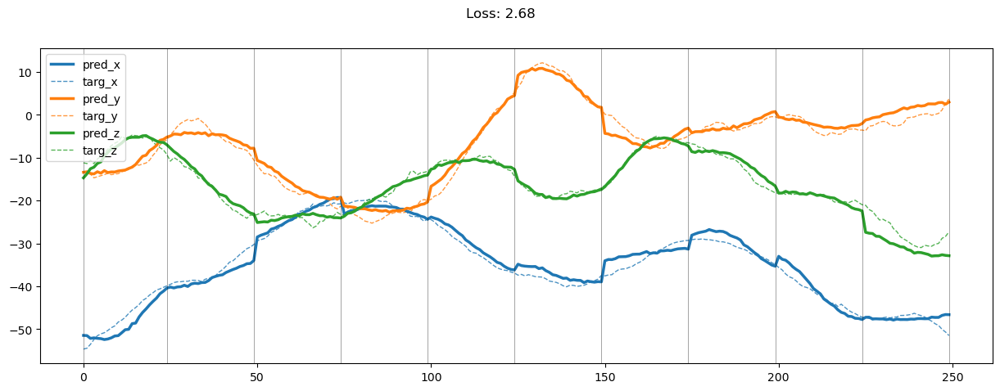

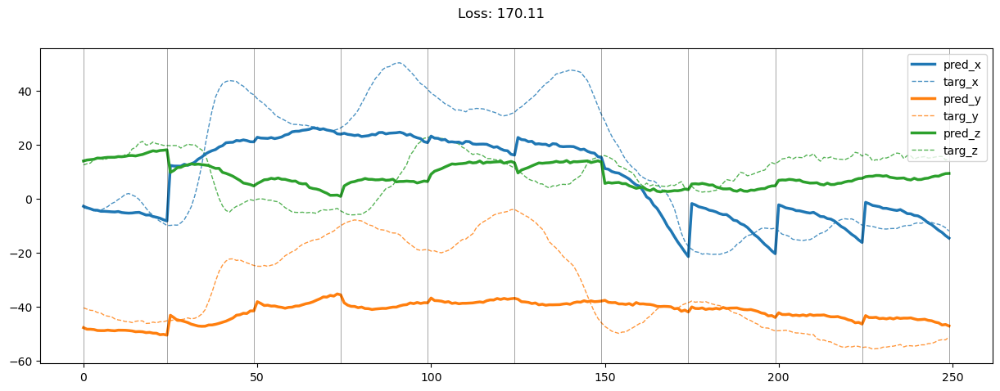

00549: train total loss:  7.834, pred loss:  3.917, valid total loss:  167.127, pred loss:  83.564


100%|██████████| 6/6 [00:00<00:00, 13.24it/s]


00550: train total loss:  7.896, pred loss:  3.948, valid total loss:  169.462, pred loss:  84.731


100%|██████████| 6/6 [00:00<00:00, 15.18it/s]


00551: train total loss:  7.606, pred loss:  3.803, valid total loss:  169.854, pred loss:  84.927


100%|██████████| 6/6 [00:00<00:00, 11.61it/s]


00552: train total loss:  7.595, pred loss:  3.798, valid total loss:  171.766, pred loss:  85.883


100%|██████████| 6/6 [00:00<00:00,  8.35it/s]


00553: train total loss:  7.750, pred loss:  3.875, valid total loss:  169.337, pred loss:  84.668


100%|██████████| 6/6 [00:00<00:00,  8.92it/s]


00554: train total loss:  7.415, pred loss:  3.708, valid total loss:  163.606, pred loss:  81.803


100%|██████████| 6/6 [00:00<00:00, 13.47it/s]


00555: train total loss:  7.469, pred loss:  3.735, valid total loss:  168.743, pred loss:  84.371


100%|██████████| 6/6 [00:00<00:00, 12.13it/s]


00556: train total loss:  7.574, pred loss:  3.787, valid total loss:  172.572, pred loss:  86.286


100%|██████████| 6/6 [00:00<00:00,  8.57it/s]


00557: train total loss:  7.557, pred loss:  3.778, valid total loss:  168.894, pred loss:  84.447


100%|██████████| 6/6 [00:00<00:00,  9.50it/s]


00558: train total loss:  7.665, pred loss:  3.832, valid total loss:  167.780, pred loss:  83.890


100%|██████████| 6/6 [00:00<00:00, 11.78it/s]


00559: train total loss:  7.542, pred loss:  3.771, valid total loss:  173.567, pred loss:  86.784


100%|██████████| 6/6 [00:00<00:00,  9.44it/s]


00560: train total loss:  7.929, pred loss:  3.964, valid total loss:  166.555, pred loss:  83.278


100%|██████████| 6/6 [00:00<00:00,  8.38it/s]


00561: train total loss:  7.907, pred loss:  3.953, valid total loss:  169.129, pred loss:  84.564


100%|██████████| 6/6 [00:00<00:00,  9.10it/s]


00562: train total loss:  7.824, pred loss:  3.912, valid total loss:  174.172, pred loss:  87.086


100%|██████████| 6/6 [00:00<00:00, 10.68it/s]


00563: train total loss:  7.612, pred loss:  3.806, valid total loss:  171.646, pred loss:  85.823


100%|██████████| 6/6 [00:00<00:00,  8.89it/s]


00564: train total loss:  7.592, pred loss:  3.796, valid total loss:  174.125, pred loss:  87.062


100%|██████████| 6/6 [00:00<00:00,  8.97it/s]


00565: train total loss:  7.524, pred loss:  3.762, valid total loss:  163.142, pred loss:  81.571


100%|██████████| 6/6 [00:00<00:00, 11.67it/s]


00566: train total loss:  7.641, pred loss:  3.820, valid total loss:  176.623, pred loss:  88.312


100%|██████████| 6/6 [00:00<00:00,  8.88it/s]


00567: train total loss:  7.514, pred loss:  3.757, valid total loss:  171.352, pred loss:  85.676


100%|██████████| 6/6 [00:00<00:00,  9.19it/s]


00568: train total loss:  7.508, pred loss:  3.754, valid total loss:  167.665, pred loss:  83.833


100%|██████████| 6/6 [00:00<00:00, 11.42it/s]


00569: train total loss:  7.309, pred loss:  3.655, valid total loss:  166.590, pred loss:  83.295


100%|██████████| 6/6 [00:00<00:00,  9.83it/s]


00570: train total loss:  7.285, pred loss:  3.642, valid total loss:  168.006, pred loss:  84.003


100%|██████████| 6/6 [00:00<00:00,  7.87it/s]


00571: train total loss:  7.194, pred loss:  3.597, valid total loss:  172.967, pred loss:  86.484


100%|██████████| 6/6 [00:00<00:00,  9.20it/s]


00572: train total loss:  7.092, pred loss:  3.546, valid total loss:  174.685, pred loss:  87.342


100%|██████████| 6/6 [00:00<00:00,  9.62it/s]


00573: train total loss:  7.230, pred loss:  3.615, valid total loss:  164.345, pred loss:  82.172


100%|██████████| 6/6 [00:00<00:00,  8.58it/s]


00574: train total loss:  7.374, pred loss:  3.687, valid total loss:  173.740, pred loss:  86.870


100%|██████████| 6/6 [00:00<00:00,  8.76it/s]


00575: train total loss:  7.306, pred loss:  3.653, valid total loss:  175.458, pred loss:  87.729


100%|██████████| 6/6 [00:00<00:00, 10.30it/s]


00576: train total loss:  6.964, pred loss:  3.482, valid total loss:  171.619, pred loss:  85.809


100%|██████████| 6/6 [00:00<00:00, 10.06it/s]


00577: train total loss:  7.041, pred loss:  3.520, valid total loss:  174.056, pred loss:  87.028


100%|██████████| 6/6 [00:00<00:00,  8.74it/s]


00578: train total loss:  7.397, pred loss:  3.699, valid total loss:  174.720, pred loss:  87.360


100%|██████████| 6/6 [00:00<00:00,  9.73it/s]


00579: train total loss:  7.372, pred loss:  3.686, valid total loss:  173.840, pred loss:  86.920


100%|██████████| 6/6 [00:00<00:00,  8.86it/s]


00580: train total loss:  7.137, pred loss:  3.568, valid total loss:  175.249, pred loss:  87.625


100%|██████████| 6/6 [00:00<00:00,  8.83it/s]


00581: train total loss:  6.810, pred loss:  3.405, valid total loss:  168.385, pred loss:  84.192


100%|██████████| 6/6 [00:00<00:00, 11.72it/s]


00582: train total loss:  6.937, pred loss:  3.468, valid total loss:  166.930, pred loss:  83.465


100%|██████████| 6/6 [00:00<00:00,  8.12it/s]


00583: train total loss:  7.176, pred loss:  3.588, valid total loss:  169.575, pred loss:  84.788


100%|██████████| 6/6 [00:00<00:00,  8.33it/s]


00584: train total loss:  7.201, pred loss:  3.600, valid total loss:  163.008, pred loss:  81.504


100%|██████████| 6/6 [00:00<00:00, 14.52it/s]


00585: train total loss:  7.186, pred loss:  3.593, valid total loss:  164.269, pred loss:  82.135


100%|██████████| 6/6 [00:00<00:00, 10.50it/s]


00586: train total loss:  7.289, pred loss:  3.644, valid total loss:  174.662, pred loss:  87.331


100%|██████████| 6/6 [00:00<00:00,  9.45it/s]


00587: train total loss:  7.310, pred loss:  3.655, valid total loss:  181.410, pred loss:  90.705


100%|██████████| 6/6 [00:00<00:00,  9.17it/s]


00588: train total loss:  7.134, pred loss:  3.567, valid total loss:  176.268, pred loss:  88.134


100%|██████████| 6/6 [00:00<00:00, 11.67it/s]


00589: train total loss:  6.940, pred loss:  3.470, valid total loss:  173.611, pred loss:  86.806


100%|██████████| 6/6 [00:00<00:00,  8.63it/s]


00590: train total loss:  6.768, pred loss:  3.384, valid total loss:  179.681, pred loss:  89.841


100%|██████████| 6/6 [00:00<00:00,  8.43it/s]


00591: train total loss:  6.781, pred loss:  3.390, valid total loss:  173.246, pred loss:  86.623


100%|██████████| 6/6 [00:00<00:00,  9.77it/s]


00592: train total loss:  7.006, pred loss:  3.503, valid total loss:  170.021, pred loss:  85.010


100%|██████████| 6/6 [00:00<00:00,  8.70it/s]


00593: train total loss:  6.831, pred loss:  3.416, valid total loss:  172.480, pred loss:  86.240


100%|██████████| 6/6 [00:00<00:00,  7.67it/s]


00594: train total loss:  6.922, pred loss:  3.461, valid total loss:  172.314, pred loss:  86.157


100%|██████████| 6/6 [00:00<00:00, 11.38it/s]


00595: train total loss:  7.116, pred loss:  3.558, valid total loss:  180.234, pred loss:  90.117


100%|██████████| 6/6 [00:00<00:00,  9.08it/s]


00596: train total loss:  7.443, pred loss:  3.721, valid total loss:  175.258, pred loss:  87.629


100%|██████████| 6/6 [00:00<00:00,  9.14it/s]


00597: train total loss:  7.208, pred loss:  3.604, valid total loss:  166.727, pred loss:  83.363


100%|██████████| 6/6 [00:00<00:00,  9.54it/s]


00598: train total loss:  7.099, pred loss:  3.550, valid total loss:  171.055, pred loss:  85.527


100%|██████████| 6/6 [00:00<00:00, 10.29it/s]


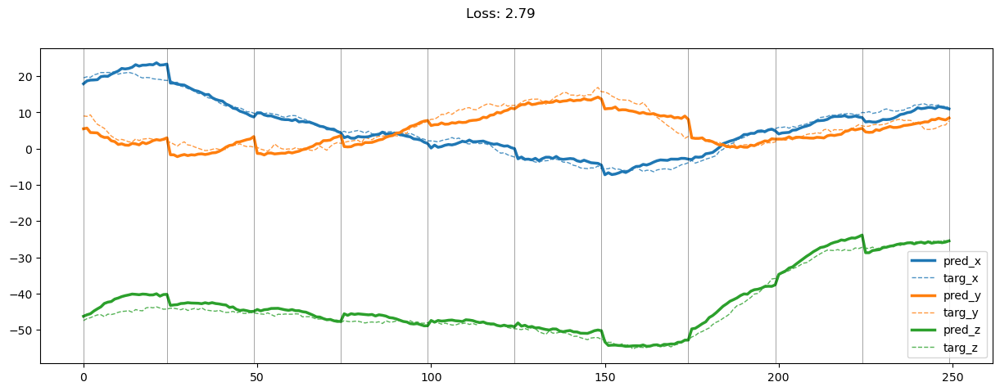

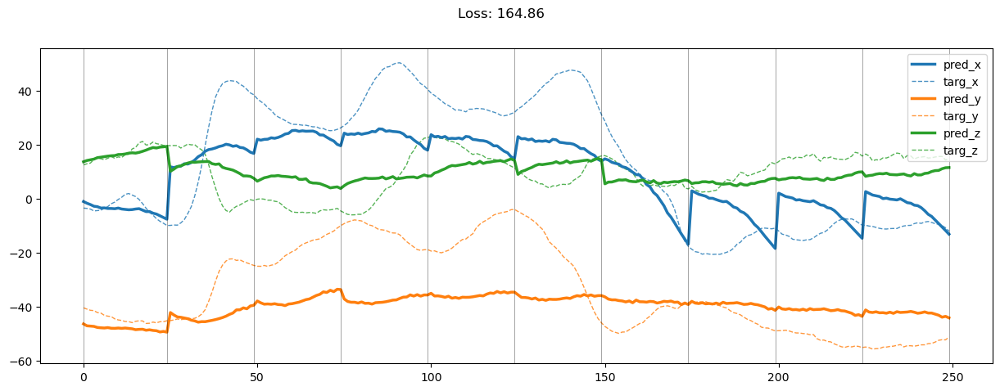

00599: train total loss:  6.579, pred loss:  3.289, valid total loss:  173.475, pred loss:  86.738


100%|██████████| 6/6 [00:00<00:00, 10.70it/s]


00600: train total loss:  6.844, pred loss:  3.422, valid total loss:  172.960, pred loss:  86.480


100%|██████████| 6/6 [00:00<00:00,  7.93it/s]


00601: train total loss:  6.830, pred loss:  3.415, valid total loss:  171.804, pred loss:  85.902


100%|██████████| 6/6 [00:00<00:00,  9.37it/s]


00602: train total loss:  6.850, pred loss:  3.425, valid total loss:  171.221, pred loss:  85.610


100%|██████████| 6/6 [00:00<00:00, 11.15it/s]


00603: train total loss:  6.697, pred loss:  3.348, valid total loss:  176.281, pred loss:  88.141


100%|██████████| 6/6 [00:00<00:00,  9.07it/s]


00604: train total loss:  6.903, pred loss:  3.451, valid total loss:  169.449, pred loss:  84.725


100%|██████████| 6/6 [00:00<00:00,  7.85it/s]


00605: train total loss:  6.570, pred loss:  3.285, valid total loss:  171.015, pred loss:  85.507


100%|██████████| 6/6 [00:00<00:00,  9.51it/s]


00606: train total loss:  6.566, pred loss:  3.283, valid total loss:  167.744, pred loss:  83.872


100%|██████████| 6/6 [00:00<00:00, 11.60it/s]


00607: train total loss:  6.805, pred loss:  3.402, valid total loss:  167.094, pred loss:  83.547


100%|██████████| 6/6 [00:00<00:00,  8.50it/s]


00608: train total loss:  6.591, pred loss:  3.295, valid total loss:  169.508, pred loss:  84.754


100%|██████████| 6/6 [00:00<00:00,  9.12it/s]


00609: train total loss:  6.749, pred loss:  3.375, valid total loss:  175.368, pred loss:  87.684


100%|██████████| 6/6 [00:00<00:00, 10.94it/s]


00610: train total loss:  6.740, pred loss:  3.370, valid total loss:  178.949, pred loss:  89.475


100%|██████████| 6/6 [00:00<00:00,  9.67it/s]


00611: train total loss:  7.201, pred loss:  3.601, valid total loss:  171.325, pred loss:  85.662


100%|██████████| 6/6 [00:00<00:00,  8.10it/s]


00612: train total loss:  6.824, pred loss:  3.412, valid total loss:  171.726, pred loss:  85.863


100%|██████████| 6/6 [00:00<00:00, 10.83it/s]


00613: train total loss:  6.678, pred loss:  3.339, valid total loss:  177.501, pred loss:  88.751


100%|██████████| 6/6 [00:00<00:00,  9.44it/s]


00614: train total loss:  6.458, pred loss:  3.229, valid total loss:  182.554, pred loss:  91.277


100%|██████████| 6/6 [00:00<00:00,  8.26it/s]


00615: train total loss:  6.554, pred loss:  3.277, valid total loss:  186.616, pred loss:  93.308


100%|██████████| 6/6 [00:00<00:00,  9.06it/s]


00616: train total loss:  6.853, pred loss:  3.427, valid total loss:  177.879, pred loss:  88.939


100%|██████████| 6/6 [00:00<00:00,  9.82it/s]


00617: train total loss:  6.860, pred loss:  3.430, valid total loss:  175.280, pred loss:  87.640


100%|██████████| 6/6 [00:00<00:00,  9.61it/s]


00618: train total loss:  6.911, pred loss:  3.455, valid total loss:  172.993, pred loss:  86.496


100%|██████████| 6/6 [00:00<00:00,  8.89it/s]


00619: train total loss:  7.059, pred loss:  3.530, valid total loss:  173.048, pred loss:  86.524


100%|██████████| 6/6 [00:00<00:00, 11.95it/s]


00620: train total loss:  6.749, pred loss:  3.375, valid total loss:  167.388, pred loss:  83.694


100%|██████████| 6/6 [00:00<00:00, 11.16it/s]


00621: train total loss:  6.882, pred loss:  3.441, valid total loss:  171.006, pred loss:  85.503


100%|██████████| 6/6 [00:00<00:00,  8.85it/s]


00622: train total loss:  6.698, pred loss:  3.349, valid total loss:  177.834, pred loss:  88.917


100%|██████████| 6/6 [00:00<00:00,  8.66it/s]


00623: train total loss:  6.603, pred loss:  3.301, valid total loss:  173.201, pred loss:  86.600


100%|██████████| 6/6 [00:00<00:00, 13.95it/s]


00624: train total loss:  6.735, pred loss:  3.367, valid total loss:  169.437, pred loss:  84.719


100%|██████████| 6/6 [00:00<00:00,  9.12it/s]


00625: train total loss:  6.277, pred loss:  3.139, valid total loss:  177.536, pred loss:  88.768


100%|██████████| 6/6 [00:00<00:00,  8.20it/s]


00626: train total loss:  6.657, pred loss:  3.328, valid total loss:  176.567, pred loss:  88.283


100%|██████████| 6/6 [00:00<00:00, 11.91it/s]


00627: train total loss:  6.547, pred loss:  3.273, valid total loss:  180.817, pred loss:  90.408


100%|██████████| 6/6 [00:00<00:00, 10.65it/s]


00628: train total loss:  6.469, pred loss:  3.235, valid total loss:  177.306, pred loss:  88.653


100%|██████████| 6/6 [00:00<00:00,  9.78it/s]


00629: train total loss:  6.440, pred loss:  3.220, valid total loss:  177.037, pred loss:  88.519


100%|██████████| 6/6 [00:00<00:00,  8.76it/s]


00630: train total loss:  6.556, pred loss:  3.278, valid total loss:  186.030, pred loss:  93.015


100%|██████████| 6/6 [00:00<00:00, 11.76it/s]


00631: train total loss:  6.568, pred loss:  3.284, valid total loss:  181.715, pred loss:  90.857


100%|██████████| 6/6 [00:00<00:00, 10.97it/s]


00632: train total loss:  6.447, pred loss:  3.224, valid total loss:  173.854, pred loss:  86.927


100%|██████████| 6/6 [00:00<00:00,  9.89it/s]


00633: train total loss:  6.489, pred loss:  3.244, valid total loss:  178.572, pred loss:  89.286


100%|██████████| 6/6 [00:00<00:00, 11.96it/s]


00634: train total loss:  6.451, pred loss:  3.226, valid total loss:  175.720, pred loss:  87.860


100%|██████████| 6/6 [00:00<00:00,  8.42it/s]


00635: train total loss:  6.602, pred loss:  3.301, valid total loss:  173.791, pred loss:  86.896


100%|██████████| 6/6 [00:00<00:00,  9.50it/s]


00636: train total loss:  6.297, pred loss:  3.149, valid total loss:  175.517, pred loss:  87.758


100%|██████████| 6/6 [00:00<00:00, 10.15it/s]


00637: train total loss:  6.369, pred loss:  3.185, valid total loss:  177.715, pred loss:  88.857


100%|██████████| 6/6 [00:00<00:00, 13.61it/s]


00638: train total loss:  6.501, pred loss:  3.251, valid total loss:  175.227, pred loss:  87.613


100%|██████████| 6/6 [00:00<00:00, 11.23it/s]


00639: train total loss:  6.590, pred loss:  3.295, valid total loss:  171.772, pred loss:  85.886


100%|██████████| 6/6 [00:00<00:00,  9.30it/s]


00640: train total loss:  6.545, pred loss:  3.273, valid total loss:  175.736, pred loss:  87.868


100%|██████████| 6/6 [00:00<00:00,  8.84it/s]


00641: train total loss:  6.493, pred loss:  3.247, valid total loss:  175.067, pred loss:  87.533


100%|██████████| 6/6 [00:00<00:00,  9.63it/s]


00642: train total loss:  6.646, pred loss:  3.323, valid total loss:  170.945, pred loss:  85.472


100%|██████████| 6/6 [00:00<00:00,  8.31it/s]


00643: train total loss:  6.313, pred loss:  3.157, valid total loss:  172.814, pred loss:  86.407


100%|██████████| 6/6 [00:00<00:00,  8.81it/s]


00644: train total loss:  6.205, pred loss:  3.103, valid total loss:  173.117, pred loss:  86.558


100%|██████████| 6/6 [00:00<00:00, 13.37it/s]


00645: train total loss:  6.498, pred loss:  3.249, valid total loss:  181.061, pred loss:  90.531


100%|██████████| 6/6 [00:00<00:00,  9.90it/s]


00646: train total loss:  6.424, pred loss:  3.212, valid total loss:  175.577, pred loss:  87.788


100%|██████████| 6/6 [00:00<00:00,  9.93it/s]


00647: train total loss:  6.220, pred loss:  3.110, valid total loss:  177.873, pred loss:  88.936


100%|██████████| 6/6 [00:00<00:00,  9.50it/s]


00648: train total loss:  6.615, pred loss:  3.308, valid total loss:  176.539, pred loss:  88.269


100%|██████████| 6/6 [00:00<00:00, 10.31it/s]


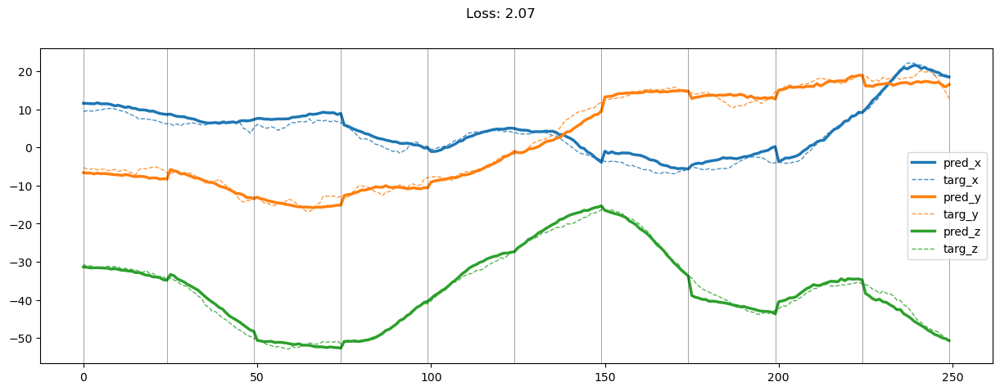

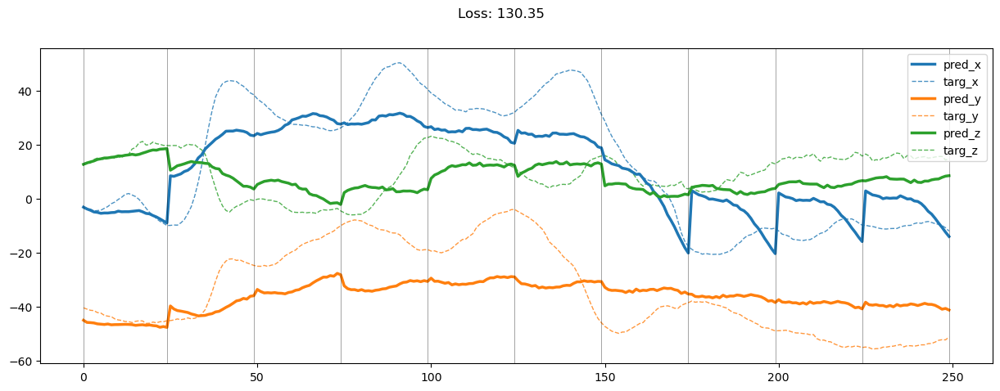

00649: train total loss:  6.436, pred loss:  3.218, valid total loss:  173.312, pred loss:  86.656


100%|██████████| 6/6 [00:00<00:00,  8.72it/s]


00650: train total loss:  6.502, pred loss:  3.251, valid total loss:  176.158, pred loss:  88.079


100%|██████████| 6/6 [00:00<00:00,  9.76it/s]


00651: train total loss:  6.423, pred loss:  3.211, valid total loss:  172.101, pred loss:  86.050


100%|██████████| 6/6 [00:00<00:00,  9.07it/s]


00652: train total loss:  6.547, pred loss:  3.274, valid total loss:  174.287, pred loss:  87.143


100%|██████████| 6/6 [00:00<00:00, 10.28it/s]


00653: train total loss:  6.546, pred loss:  3.273, valid total loss:  175.244, pred loss:  87.622


100%|██████████| 6/6 [00:00<00:00,  9.68it/s]


00654: train total loss:  6.627, pred loss:  3.314, valid total loss:  172.208, pred loss:  86.104


100%|██████████| 6/6 [00:00<00:00,  7.69it/s]


00655: train total loss:  6.480, pred loss:  3.240, valid total loss:  171.752, pred loss:  85.876


100%|██████████| 6/6 [00:00<00:00,  8.30it/s]


00656: train total loss:  6.269, pred loss:  3.134, valid total loss:  173.656, pred loss:  86.828


100%|██████████| 6/6 [00:00<00:00, 11.57it/s]


00657: train total loss:  6.356, pred loss:  3.178, valid total loss:  176.387, pred loss:  88.193


100%|██████████| 6/6 [00:00<00:00,  9.25it/s]


00658: train total loss:  6.191, pred loss:  3.096, valid total loss:  176.191, pred loss:  88.095


100%|██████████| 6/6 [00:00<00:00,  8.60it/s]


00659: train total loss:  6.175, pred loss:  3.088, valid total loss:  177.479, pred loss:  88.739


100%|██████████| 6/6 [00:00<00:00, 10.94it/s]


00660: train total loss:  6.004, pred loss:  3.002, valid total loss:  172.960, pred loss:  86.480


100%|██████████| 6/6 [00:00<00:00,  9.69it/s]


00661: train total loss:  6.082, pred loss:  3.041, valid total loss:  172.011, pred loss:  86.006


100%|██████████| 6/6 [00:00<00:00,  8.70it/s]


00662: train total loss:  6.032, pred loss:  3.016, valid total loss:  171.187, pred loss:  85.593


100%|██████████| 6/6 [00:00<00:00,  9.23it/s]


00663: train total loss:  6.069, pred loss:  3.034, valid total loss:  175.990, pred loss:  87.995


100%|██████████| 6/6 [00:00<00:00, 12.85it/s]


00664: train total loss:  5.933, pred loss:  2.966, valid total loss:  173.715, pred loss:  86.857


100%|██████████| 6/6 [00:00<00:00, 10.15it/s]


00665: train total loss:  5.913, pred loss:  2.956, valid total loss:  174.326, pred loss:  87.163


100%|██████████| 6/6 [00:00<00:00,  9.01it/s]


00666: train total loss:  6.033, pred loss:  3.017, valid total loss:  176.145, pred loss:  88.072


100%|██████████| 6/6 [00:00<00:00,  9.82it/s]


00667: train total loss:  6.156, pred loss:  3.078, valid total loss:  175.800, pred loss:  87.900


100%|██████████| 6/6 [00:00<00:00,  9.09it/s]


00668: train total loss:  6.024, pred loss:  3.012, valid total loss:  167.802, pred loss:  83.901


100%|██████████| 6/6 [00:00<00:00,  9.79it/s]


00669: train total loss:  6.005, pred loss:  3.002, valid total loss:  171.252, pred loss:  85.626


100%|██████████| 6/6 [00:00<00:00,  9.08it/s]


00670: train total loss:  5.932, pred loss:  2.966, valid total loss:  176.945, pred loss:  88.473


100%|██████████| 6/6 [00:00<00:00, 10.74it/s]


00671: train total loss:  6.272, pred loss:  3.136, valid total loss:  177.647, pred loss:  88.823


100%|██████████| 6/6 [00:00<00:00,  8.97it/s]


00672: train total loss:  6.212, pred loss:  3.106, valid total loss:  172.211, pred loss:  86.105


100%|██████████| 6/6 [00:00<00:00,  8.70it/s]


00673: train total loss:  6.007, pred loss:  3.004, valid total loss:  173.565, pred loss:  86.782


100%|██████████| 6/6 [00:00<00:00, 10.24it/s]


00674: train total loss:  6.108, pred loss:  3.054, valid total loss:  174.845, pred loss:  87.423


100%|██████████| 6/6 [00:00<00:00,  9.38it/s]


00675: train total loss:  6.102, pred loss:  3.051, valid total loss:  176.179, pred loss:  88.089


100%|██████████| 6/6 [00:00<00:00, 10.47it/s]


00676: train total loss:  6.139, pred loss:  3.069, valid total loss:  175.951, pred loss:  87.976


100%|██████████| 6/6 [00:00<00:00,  8.38it/s]


00677: train total loss:  6.041, pred loss:  3.020, valid total loss:  181.960, pred loss:  90.980


100%|██████████| 6/6 [00:00<00:00,  8.12it/s]


00678: train total loss:  5.906, pred loss:  2.953, valid total loss:  174.824, pred loss:  87.412


100%|██████████| 6/6 [00:00<00:00, 10.62it/s]


00679: train total loss:  5.791, pred loss:  2.895, valid total loss:  173.025, pred loss:  86.512


100%|██████████| 6/6 [00:00<00:00,  9.92it/s]


00680: train total loss:  6.006, pred loss:  3.003, valid total loss:  171.083, pred loss:  85.541


100%|██████████| 6/6 [00:00<00:00, 11.47it/s]


00681: train total loss:  5.731, pred loss:  2.865, valid total loss:  171.943, pred loss:  85.972


100%|██████████| 6/6 [00:00<00:00,  9.04it/s]


00682: train total loss:  5.965, pred loss:  2.983, valid total loss:  177.557, pred loss:  88.778


100%|██████████| 6/6 [00:00<00:00, 10.11it/s]


00683: train total loss:  5.648, pred loss:  2.824, valid total loss:  175.584, pred loss:  87.792


100%|██████████| 6/6 [00:00<00:00,  9.76it/s]


00684: train total loss:  5.866, pred loss:  2.933, valid total loss:  177.493, pred loss:  88.747


100%|██████████| 6/6 [00:00<00:00, 10.01it/s]


00685: train total loss:  5.708, pred loss:  2.854, valid total loss:  181.108, pred loss:  90.554


100%|██████████| 6/6 [00:00<00:00,  8.18it/s]


00686: train total loss:  5.933, pred loss:  2.966, valid total loss:  172.774, pred loss:  86.387


100%|██████████| 6/6 [00:00<00:00,  9.01it/s]


00687: train total loss:  5.981, pred loss:  2.991, valid total loss:  178.115, pred loss:  89.057


100%|██████████| 6/6 [00:00<00:00,  9.78it/s]


00688: train total loss:  5.662, pred loss:  2.831, valid total loss:  183.383, pred loss:  91.691


100%|██████████| 6/6 [00:00<00:00,  9.06it/s]


00689: train total loss:  5.758, pred loss:  2.879, valid total loss:  173.279, pred loss:  86.639


100%|██████████| 6/6 [00:00<00:00,  9.82it/s]


00690: train total loss:  5.602, pred loss:  2.801, valid total loss:  179.850, pred loss:  89.925


100%|██████████| 6/6 [00:00<00:00, 11.50it/s]


00691: train total loss:  5.572, pred loss:  2.786, valid total loss:  185.327, pred loss:  92.664


100%|██████████| 6/6 [00:00<00:00, 11.50it/s]


00692: train total loss:  5.572, pred loss:  2.786, valid total loss:  178.012, pred loss:  89.006


100%|██████████| 6/6 [00:00<00:00, 13.48it/s]


00693: train total loss:  5.694, pred loss:  2.847, valid total loss:  173.847, pred loss:  86.923


100%|██████████| 6/6 [00:00<00:00, 14.62it/s]


00694: train total loss:  5.661, pred loss:  2.830, valid total loss:  178.637, pred loss:  89.318


100%|██████████| 6/6 [00:00<00:00, 17.44it/s]


00695: train total loss:  5.532, pred loss:  2.766, valid total loss:  173.589, pred loss:  86.794


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00696: train total loss:  5.600, pred loss:  2.800, valid total loss:  175.190, pred loss:  87.595


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00697: train total loss:  5.634, pred loss:  2.817, valid total loss:  168.038, pred loss:  84.019


100%|██████████| 6/6 [00:00<00:00, 18.92it/s]


00698: train total loss:  5.732, pred loss:  2.866, valid total loss:  171.481, pred loss:  85.741


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


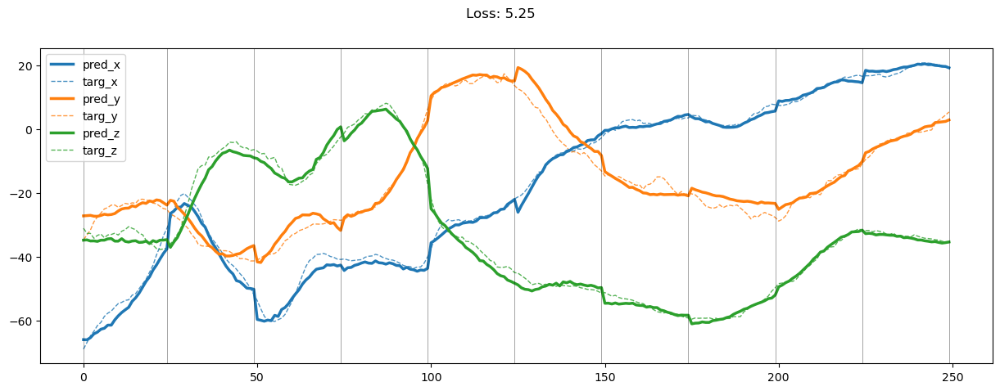

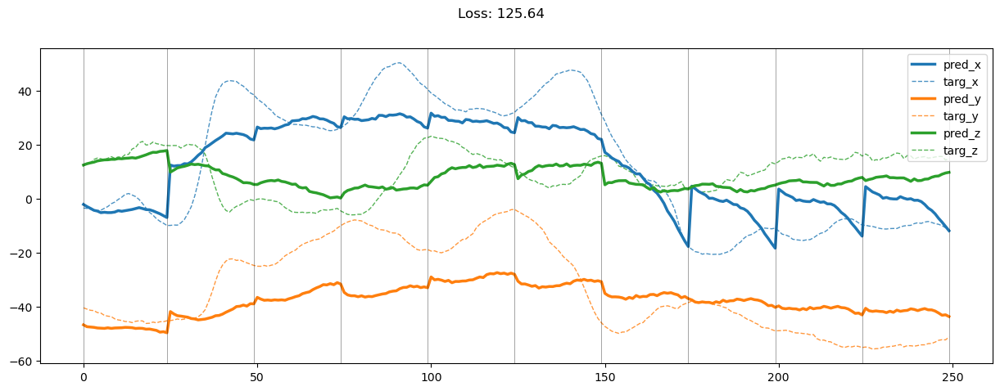

00699: train total loss:  6.094, pred loss:  3.047, valid total loss:  176.700, pred loss:  88.350


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


00700: train total loss:  5.818, pred loss:  2.909, valid total loss:  172.958, pred loss:  86.479


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00701: train total loss:  6.055, pred loss:  3.028, valid total loss:  174.288, pred loss:  87.144


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00702: train total loss:  5.851, pred loss:  2.926, valid total loss:  180.026, pred loss:  90.013


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00703: train total loss:  6.034, pred loss:  3.017, valid total loss:  178.255, pred loss:  89.128


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00704: train total loss:  5.786, pred loss:  2.893, valid total loss:  184.370, pred loss:  92.185


100%|██████████| 6/6 [00:00<00:00, 19.64it/s]


00705: train total loss:  5.601, pred loss:  2.800, valid total loss:  181.862, pred loss:  90.931


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


00706: train total loss:  5.746, pred loss:  2.873, valid total loss:  176.310, pred loss:  88.155


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


00707: train total loss:  5.945, pred loss:  2.973, valid total loss:  182.985, pred loss:  91.492


100%|██████████| 6/6 [00:00<00:00, 17.61it/s]


00708: train total loss:  5.675, pred loss:  2.838, valid total loss:  182.542, pred loss:  91.271


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00709: train total loss:  5.474, pred loss:  2.737, valid total loss:  182.068, pred loss:  91.034


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00710: train total loss:  5.461, pred loss:  2.730, valid total loss:  187.760, pred loss:  93.880


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00711: train total loss:  5.511, pred loss:  2.755, valid total loss:  186.464, pred loss:  93.232


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00712: train total loss:  5.615, pred loss:  2.807, valid total loss:  178.023, pred loss:  89.012


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


00713: train total loss:  5.678, pred loss:  2.839, valid total loss:  181.430, pred loss:  90.715


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00714: train total loss:  5.600, pred loss:  2.800, valid total loss:  179.836, pred loss:  89.918


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00715: train total loss:  5.504, pred loss:  2.752, valid total loss:  174.992, pred loss:  87.496


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


00716: train total loss:  5.660, pred loss:  2.830, valid total loss:  180.672, pred loss:  90.336


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00717: train total loss:  5.943, pred loss:  2.971, valid total loss:  176.209, pred loss:  88.104


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00718: train total loss:  5.696, pred loss:  2.848, valid total loss:  178.809, pred loss:  89.405


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00719: train total loss:  5.686, pred loss:  2.843, valid total loss:  177.954, pred loss:  88.977


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00720: train total loss:  5.538, pred loss:  2.769, valid total loss:  172.860, pred loss:  86.430


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00721: train total loss:  5.514, pred loss:  2.757, valid total loss:  172.097, pred loss:  86.049


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00722: train total loss:  5.639, pred loss:  2.820, valid total loss:  183.853, pred loss:  91.926


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00723: train total loss:  5.410, pred loss:  2.705, valid total loss:  179.095, pred loss:  89.547


100%|██████████| 6/6 [00:00<00:00, 18.92it/s]


00724: train total loss:  5.754, pred loss:  2.877, valid total loss:  178.007, pred loss:  89.004


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00725: train total loss:  5.405, pred loss:  2.702, valid total loss:  176.481, pred loss:  88.240


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00726: train total loss:  5.270, pred loss:  2.635, valid total loss:  172.540, pred loss:  86.270


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


00727: train total loss:  5.147, pred loss:  2.574, valid total loss:  178.196, pred loss:  89.098


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00728: train total loss:  5.107, pred loss:  2.554, valid total loss:  184.785, pred loss:  92.393


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00729: train total loss:  5.403, pred loss:  2.702, valid total loss:  179.261, pred loss:  89.631


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00730: train total loss:  5.167, pred loss:  2.583, valid total loss:  182.767, pred loss:  91.383


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00731: train total loss:  5.272, pred loss:  2.636, valid total loss:  180.747, pred loss:  90.374


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00732: train total loss:  5.384, pred loss:  2.692, valid total loss:  184.095, pred loss:  92.047


100%|██████████| 6/6 [00:00<00:00, 18.64it/s]


00733: train total loss:  5.304, pred loss:  2.652, valid total loss:  179.320, pred loss:  89.660


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00734: train total loss:  5.533, pred loss:  2.766, valid total loss:  175.538, pred loss:  87.769


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00735: train total loss:  5.372, pred loss:  2.686, valid total loss:  176.195, pred loss:  88.098


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


00736: train total loss:  5.345, pred loss:  2.673, valid total loss:  182.506, pred loss:  91.253


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00737: train total loss:  5.688, pred loss:  2.844, valid total loss:  181.788, pred loss:  90.894


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00738: train total loss:  5.491, pred loss:  2.745, valid total loss:  182.661, pred loss:  91.331


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


00739: train total loss:  5.543, pred loss:  2.771, valid total loss:  174.824, pred loss:  87.412


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


00740: train total loss:  5.420, pred loss:  2.710, valid total loss:  174.556, pred loss:  87.278


100%|██████████| 6/6 [00:00<00:00, 19.10it/s]


00741: train total loss:  5.615, pred loss:  2.808, valid total loss:  187.169, pred loss:  93.585


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00742: train total loss:  5.621, pred loss:  2.810, valid total loss:  185.912, pred loss:  92.956


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00743: train total loss:  5.793, pred loss:  2.897, valid total loss:  181.797, pred loss:  90.898


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00744: train total loss:  5.653, pred loss:  2.826, valid total loss:  185.383, pred loss:  92.692


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00745: train total loss:  5.644, pred loss:  2.822, valid total loss:  179.031, pred loss:  89.516


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00746: train total loss:  5.584, pred loss:  2.792, valid total loss:  178.818, pred loss:  89.409


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00747: train total loss:  5.574, pred loss:  2.787, valid total loss:  180.323, pred loss:  90.162


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00748: train total loss:  5.535, pred loss:  2.768, valid total loss:  170.276, pred loss:  85.138


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


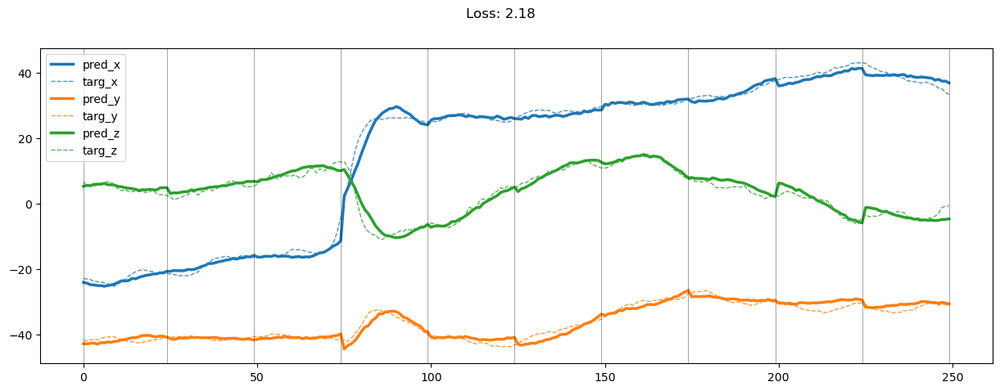

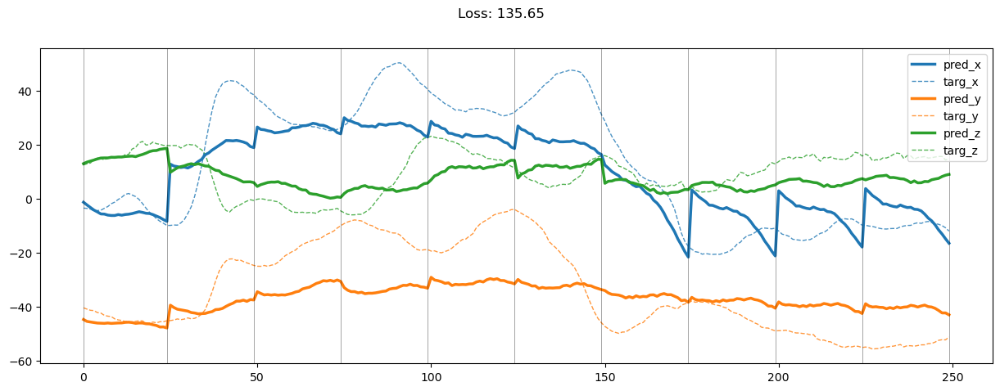

00749: train total loss:  5.300, pred loss:  2.650, valid total loss:  173.622, pred loss:  86.811


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00750: train total loss:  5.311, pred loss:  2.656, valid total loss:  179.342, pred loss:  89.671


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00751: train total loss:  5.441, pred loss:  2.720, valid total loss:  180.916, pred loss:  90.458


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00752: train total loss:  5.424, pred loss:  2.712, valid total loss:  175.486, pred loss:  87.743


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00753: train total loss:  5.341, pred loss:  2.670, valid total loss:  179.442, pred loss:  89.721


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


00754: train total loss:  5.267, pred loss:  2.634, valid total loss:  178.021, pred loss:  89.011


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


00755: train total loss:  5.367, pred loss:  2.684, valid total loss:  175.640, pred loss:  87.820


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00756: train total loss:  5.224, pred loss:  2.612, valid total loss:  173.407, pred loss:  86.704


100%|██████████| 6/6 [00:00<00:00, 17.80it/s]


00757: train total loss:  5.275, pred loss:  2.638, valid total loss:  177.202, pred loss:  88.601


100%|██████████| 6/6 [00:00<00:00, 19.20it/s]


00758: train total loss:  5.219, pred loss:  2.609, valid total loss:  178.607, pred loss:  89.303


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


00759: train total loss:  5.347, pred loss:  2.674, valid total loss:  174.379, pred loss:  87.190


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00760: train total loss:  5.263, pred loss:  2.631, valid total loss:  175.794, pred loss:  87.897


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00761: train total loss:  5.159, pred loss:  2.580, valid total loss:  173.342, pred loss:  86.671


100%|██████████| 6/6 [00:00<00:00, 17.82it/s]


00762: train total loss:  5.083, pred loss:  2.542, valid total loss:  174.722, pred loss:  87.361


100%|██████████| 6/6 [00:00<00:00, 18.10it/s]


00763: train total loss:  5.098, pred loss:  2.549, valid total loss:  175.168, pred loss:  87.584


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


00764: train total loss:  5.029, pred loss:  2.515, valid total loss:  173.157, pred loss:  86.578


100%|██████████| 6/6 [00:00<00:00, 19.72it/s]


00765: train total loss:  5.102, pred loss:  2.551, valid total loss:  181.650, pred loss:  90.825


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00766: train total loss:  5.207, pred loss:  2.604, valid total loss:  169.499, pred loss:  84.750


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00767: train total loss:  5.058, pred loss:  2.529, valid total loss:  172.420, pred loss:  86.210


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00768: train total loss:  4.857, pred loss:  2.429, valid total loss:  176.060, pred loss:  88.030


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00769: train total loss:  5.031, pred loss:  2.515, valid total loss:  176.174, pred loss:  88.087


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00770: train total loss:  5.035, pred loss:  2.517, valid total loss:  174.533, pred loss:  87.267


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00771: train total loss:  5.157, pred loss:  2.578, valid total loss:  175.041, pred loss:  87.521


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00772: train total loss:  5.210, pred loss:  2.605, valid total loss:  178.574, pred loss:  89.287


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00773: train total loss:  5.275, pred loss:  2.637, valid total loss:  174.458, pred loss:  87.229


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00774: train total loss:  5.203, pred loss:  2.601, valid total loss:  177.956, pred loss:  88.978


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00775: train total loss:  5.167, pred loss:  2.584, valid total loss:  180.297, pred loss:  90.149


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00776: train total loss:  5.014, pred loss:  2.507, valid total loss:  183.136, pred loss:  91.568


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00777: train total loss:  4.916, pred loss:  2.458, valid total loss:  188.691, pred loss:  94.345


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00778: train total loss:  5.072, pred loss:  2.536, valid total loss:  182.272, pred loss:  91.136


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00779: train total loss:  4.880, pred loss:  2.440, valid total loss:  178.130, pred loss:  89.065


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00780: train total loss:  4.801, pred loss:  2.401, valid total loss:  180.141, pred loss:  90.071


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00781: train total loss:  4.858, pred loss:  2.429, valid total loss:  181.161, pred loss:  90.581


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00782: train total loss:  4.739, pred loss:  2.370, valid total loss:  176.861, pred loss:  88.430


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00783: train total loss:  4.731, pred loss:  2.365, valid total loss:  175.423, pred loss:  87.712


100%|██████████| 6/6 [00:00<00:00, 17.73it/s]


00784: train total loss:  4.886, pred loss:  2.443, valid total loss:  178.317, pred loss:  89.159


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00785: train total loss:  4.798, pred loss:  2.399, valid total loss:  177.702, pred loss:  88.851


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00786: train total loss:  4.849, pred loss:  2.425, valid total loss:  176.400, pred loss:  88.200


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00787: train total loss:  4.614, pred loss:  2.307, valid total loss:  181.213, pred loss:  90.607


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00788: train total loss:  4.625, pred loss:  2.313, valid total loss:  177.229, pred loss:  88.614


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00789: train total loss:  4.761, pred loss:  2.380, valid total loss:  173.760, pred loss:  86.880


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00790: train total loss:  4.709, pred loss:  2.355, valid total loss:  178.891, pred loss:  89.445


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00791: train total loss:  4.833, pred loss:  2.416, valid total loss:  178.639, pred loss:  89.319


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00792: train total loss:  4.876, pred loss:  2.438, valid total loss:  178.367, pred loss:  89.184


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00793: train total loss:  5.036, pred loss:  2.518, valid total loss:  180.442, pred loss:  90.221


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00794: train total loss:  5.047, pred loss:  2.523, valid total loss:  178.730, pred loss:  89.365


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00795: train total loss:  4.910, pred loss:  2.455, valid total loss:  181.980, pred loss:  90.990


100%|██████████| 6/6 [00:00<00:00, 18.69it/s]


00796: train total loss:  5.056, pred loss:  2.528, valid total loss:  177.033, pred loss:  88.516


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


00797: train total loss:  5.015, pred loss:  2.508, valid total loss:  179.100, pred loss:  89.550


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


00798: train total loss:  4.817, pred loss:  2.408, valid total loss:  175.467, pred loss:  87.733


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


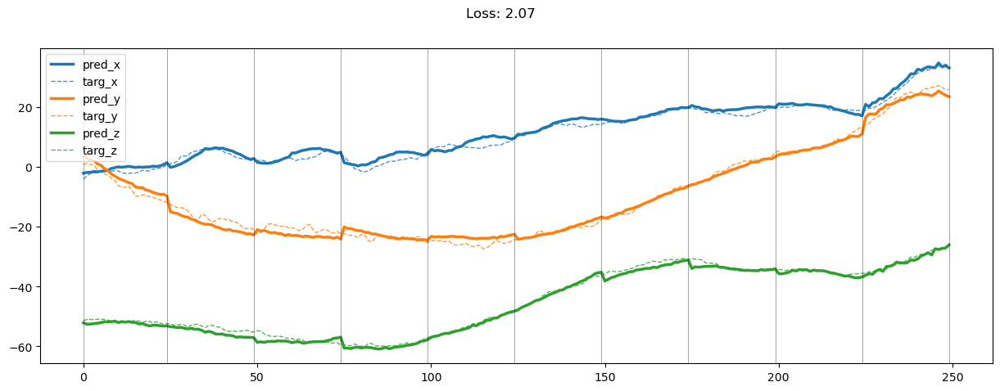

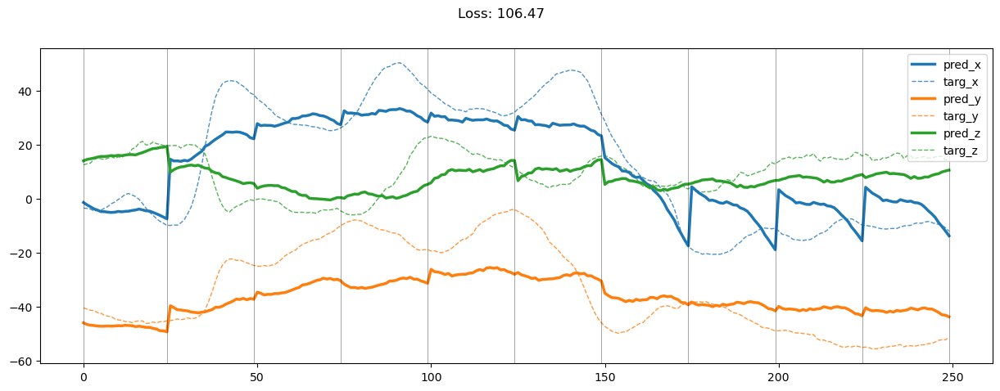

00799: train total loss:  4.928, pred loss:  2.464, valid total loss:  173.156, pred loss:  86.578


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00800: train total loss:  5.008, pred loss:  2.504, valid total loss:  168.341, pred loss:  84.170


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00801: train total loss:  4.978, pred loss:  2.489, valid total loss:  177.011, pred loss:  88.506


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00802: train total loss:  4.899, pred loss:  2.450, valid total loss:  185.974, pred loss:  92.987


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00803: train total loss:  5.074, pred loss:  2.537, valid total loss:  195.443, pred loss:  97.722


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00804: train total loss:  5.040, pred loss:  2.520, valid total loss:  186.487, pred loss:  93.243


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00805: train total loss:  5.005, pred loss:  2.502, valid total loss:  182.306, pred loss:  91.153


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


00806: train total loss:  4.824, pred loss:  2.412, valid total loss:  181.040, pred loss:  90.520


100%|██████████| 6/6 [00:00<00:00, 18.53it/s]


00807: train total loss:  5.002, pred loss:  2.501, valid total loss:  176.739, pred loss:  88.369


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


00808: train total loss:  5.044, pred loss:  2.522, valid total loss:  183.299, pred loss:  91.650


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


00809: train total loss:  4.821, pred loss:  2.410, valid total loss:  184.014, pred loss:  92.007


100%|██████████| 6/6 [00:00<00:00, 19.68it/s]


00810: train total loss:  4.775, pred loss:  2.388, valid total loss:  185.710, pred loss:  92.855


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00811: train total loss:  4.652, pred loss:  2.326, valid total loss:  177.624, pred loss:  88.812


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00812: train total loss:  4.783, pred loss:  2.392, valid total loss:  189.295, pred loss:  94.647


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00813: train total loss:  4.814, pred loss:  2.407, valid total loss:  186.464, pred loss:  93.232


100%|██████████| 6/6 [00:00<00:00, 20.18it/s]


00814: train total loss:  4.808, pred loss:  2.404, valid total loss:  181.111, pred loss:  90.556


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


00815: train total loss:  4.701, pred loss:  2.350, valid total loss:  178.275, pred loss:  89.138


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00816: train total loss:  4.956, pred loss:  2.478, valid total loss:  178.661, pred loss:  89.331


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00817: train total loss:  4.933, pred loss:  2.466, valid total loss:  178.330, pred loss:  89.165


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00818: train total loss:  4.975, pred loss:  2.488, valid total loss:  181.353, pred loss:  90.676


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00819: train total loss:  4.999, pred loss:  2.500, valid total loss:  182.903, pred loss:  91.452


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00820: train total loss:  4.829, pred loss:  2.414, valid total loss:  179.448, pred loss:  89.724


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00821: train total loss:  4.716, pred loss:  2.358, valid total loss:  176.615, pred loss:  88.307


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00822: train total loss:  4.636, pred loss:  2.318, valid total loss:  181.923, pred loss:  90.961


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00823: train total loss:  4.597, pred loss:  2.299, valid total loss:  179.640, pred loss:  89.820


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00824: train total loss:  4.631, pred loss:  2.316, valid total loss:  181.292, pred loss:  90.646


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00825: train total loss:  4.598, pred loss:  2.299, valid total loss:  178.738, pred loss:  89.369


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00826: train total loss:  4.618, pred loss:  2.309, valid total loss:  177.181, pred loss:  88.591


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


00827: train total loss:  4.665, pred loss:  2.332, valid total loss:  175.878, pred loss:  87.939


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00828: train total loss:  4.879, pred loss:  2.440, valid total loss:  178.041, pred loss:  89.021


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00829: train total loss:  4.811, pred loss:  2.406, valid total loss:  178.520, pred loss:  89.260


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00830: train total loss:  4.938, pred loss:  2.469, valid total loss:  177.847, pred loss:  88.923


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00831: train total loss:  4.763, pred loss:  2.381, valid total loss:  181.120, pred loss:  90.560


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00832: train total loss:  4.766, pred loss:  2.383, valid total loss:  175.589, pred loss:  87.794


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00833: train total loss:  4.652, pred loss:  2.326, valid total loss:  179.291, pred loss:  89.645


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


00834: train total loss:  4.888, pred loss:  2.444, valid total loss:  181.492, pred loss:  90.746


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00835: train total loss:  5.008, pred loss:  2.504, valid total loss:  176.731, pred loss:  88.366


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


00836: train total loss:  4.988, pred loss:  2.494, valid total loss:  177.121, pred loss:  88.560


100%|██████████| 6/6 [00:00<00:00, 18.21it/s]


00837: train total loss:  5.054, pred loss:  2.527, valid total loss:  180.209, pred loss:  90.105


100%|██████████| 6/6 [00:00<00:00, 18.03it/s]


00838: train total loss:  4.935, pred loss:  2.467, valid total loss:  177.820, pred loss:  88.910


100%|██████████| 6/6 [00:00<00:00, 17.60it/s]


00839: train total loss:  4.832, pred loss:  2.416, valid total loss:  177.410, pred loss:  88.705


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


00840: train total loss:  4.553, pred loss:  2.277, valid total loss:  175.712, pred loss:  87.856


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00841: train total loss:  4.392, pred loss:  2.196, valid total loss:  175.065, pred loss:  87.533


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00842: train total loss:  4.387, pred loss:  2.193, valid total loss:  182.185, pred loss:  91.092


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00843: train total loss:  4.518, pred loss:  2.259, valid total loss:  178.215, pred loss:  89.107


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00844: train total loss:  4.432, pred loss:  2.216, valid total loss:  174.115, pred loss:  87.057


100%|██████████| 6/6 [00:00<00:00, 17.91it/s]


00845: train total loss:  4.422, pred loss:  2.211, valid total loss:  172.289, pred loss:  86.144


100%|██████████| 6/6 [00:00<00:00, 17.71it/s]


00846: train total loss:  4.395, pred loss:  2.198, valid total loss:  171.095, pred loss:  85.547


100%|██████████| 6/6 [00:00<00:00, 17.67it/s]


00847: train total loss:  4.480, pred loss:  2.240, valid total loss:  172.644, pred loss:  86.322


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00848: train total loss:  4.266, pred loss:  2.133, valid total loss:  176.228, pred loss:  88.114


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


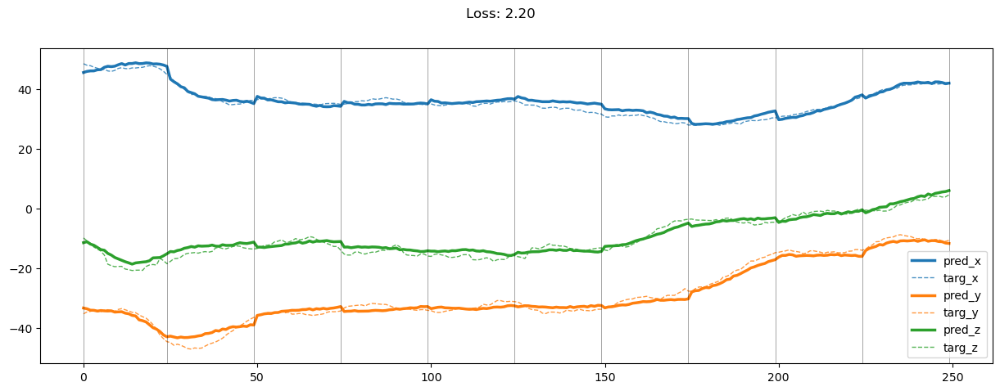

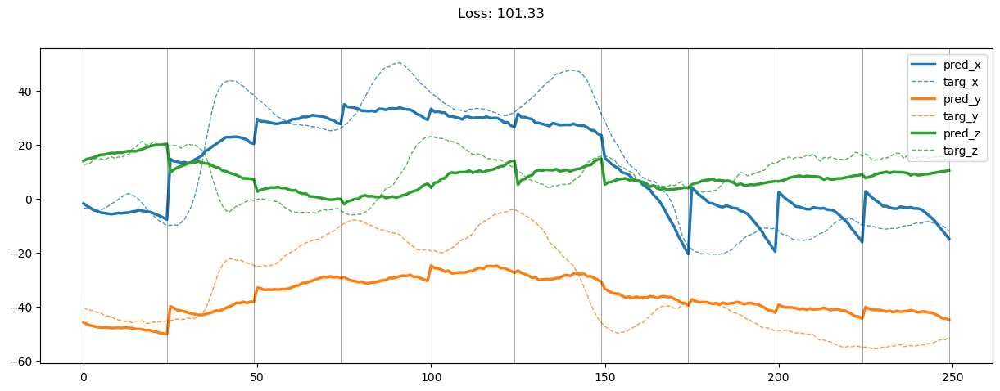

00849: train total loss:  4.332, pred loss:  2.166, valid total loss:  175.153, pred loss:  87.577


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00850: train total loss:  4.184, pred loss:  2.092, valid total loss:  169.880, pred loss:  84.940


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00851: train total loss:  4.192, pred loss:  2.096, valid total loss:  172.735, pred loss:  86.367


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00852: train total loss:  4.221, pred loss:  2.111, valid total loss:  174.457, pred loss:  87.228


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00853: train total loss:  4.216, pred loss:  2.108, valid total loss:  181.105, pred loss:  90.553


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00854: train total loss:  4.156, pred loss:  2.078, valid total loss:  181.682, pred loss:  90.841


100%|██████████| 6/6 [00:00<00:00, 19.95it/s]


00855: train total loss:  4.391, pred loss:  2.196, valid total loss:  182.848, pred loss:  91.424


100%|██████████| 6/6 [00:00<00:00, 19.83it/s]


00856: train total loss:  4.420, pred loss:  2.210, valid total loss:  178.347, pred loss:  89.174


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


00857: train total loss:  4.571, pred loss:  2.285, valid total loss:  172.086, pred loss:  86.043


100%|██████████| 6/6 [00:00<00:00, 18.95it/s]


00858: train total loss:  4.407, pred loss:  2.203, valid total loss:  175.677, pred loss:  87.839


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00859: train total loss:  4.589, pred loss:  2.295, valid total loss:  182.564, pred loss:  91.282


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00860: train total loss:  4.617, pred loss:  2.309, valid total loss:  175.505, pred loss:  87.753


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


00861: train total loss:  4.596, pred loss:  2.298, valid total loss:  174.697, pred loss:  87.349


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00862: train total loss:  4.677, pred loss:  2.338, valid total loss:  183.923, pred loss:  91.961


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00863: train total loss:  4.766, pred loss:  2.383, valid total loss:  180.640, pred loss:  90.320


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00864: train total loss:  5.003, pred loss:  2.502, valid total loss:  170.841, pred loss:  85.420


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


00865: train total loss:  4.868, pred loss:  2.434, valid total loss:  184.235, pred loss:  92.118


100%|██████████| 6/6 [00:00<00:00, 19.90it/s]


00866: train total loss:  4.894, pred loss:  2.447, valid total loss:  188.035, pred loss:  94.017


100%|██████████| 6/6 [00:00<00:00, 19.12it/s]


00867: train total loss:  4.778, pred loss:  2.389, valid total loss:  181.394, pred loss:  90.697


100%|██████████| 6/6 [00:00<00:00, 19.84it/s]


00868: train total loss:  4.744, pred loss:  2.372, valid total loss:  178.423, pred loss:  89.212


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00869: train total loss:  4.537, pred loss:  2.269, valid total loss:  188.357, pred loss:  94.178


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00870: train total loss:  4.496, pred loss:  2.248, valid total loss:  181.563, pred loss:  90.782


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00871: train total loss:  4.493, pred loss:  2.247, valid total loss:  180.234, pred loss:  90.117


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


00872: train total loss:  4.372, pred loss:  2.186, valid total loss:  182.243, pred loss:  91.121


100%|██████████| 6/6 [00:00<00:00, 18.96it/s]


00873: train total loss:  4.354, pred loss:  2.177, valid total loss:  182.186, pred loss:  91.093


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00874: train total loss:  4.218, pred loss:  2.109, valid total loss:  180.238, pred loss:  90.119


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00875: train total loss:  4.321, pred loss:  2.161, valid total loss:  179.203, pred loss:  89.601


100%|██████████| 6/6 [00:00<00:00, 19.43it/s]


00876: train total loss:  4.300, pred loss:  2.150, valid total loss:  178.130, pred loss:  89.065


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00877: train total loss:  4.309, pred loss:  2.154, valid total loss:  184.964, pred loss:  92.482


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00878: train total loss:  4.449, pred loss:  2.225, valid total loss:  178.936, pred loss:  89.468


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00879: train total loss:  4.310, pred loss:  2.155, valid total loss:  176.533, pred loss:  88.267


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00880: train total loss:  4.257, pred loss:  2.128, valid total loss:  181.300, pred loss:  90.650


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00881: train total loss:  4.131, pred loss:  2.066, valid total loss:  177.937, pred loss:  88.968


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00882: train total loss:  4.498, pred loss:  2.249, valid total loss:  173.135, pred loss:  86.567


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00883: train total loss:  4.314, pred loss:  2.157, valid total loss:  174.223, pred loss:  87.112


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00884: train total loss:  4.368, pred loss:  2.184, valid total loss:  181.539, pred loss:  90.769


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00885: train total loss:  4.393, pred loss:  2.196, valid total loss:  185.462, pred loss:  92.731


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00886: train total loss:  4.396, pred loss:  2.198, valid total loss:  175.640, pred loss:  87.820


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


00887: train total loss:  4.626, pred loss:  2.313, valid total loss:  178.406, pred loss:  89.203


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00888: train total loss:  4.559, pred loss:  2.279, valid total loss:  191.361, pred loss:  95.681


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00889: train total loss:  4.640, pred loss:  2.320, valid total loss:  188.586, pred loss:  94.293


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00890: train total loss:  4.521, pred loss:  2.260, valid total loss:  177.383, pred loss:  88.692


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00891: train total loss:  4.409, pred loss:  2.205, valid total loss:  178.254, pred loss:  89.127


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00892: train total loss:  4.393, pred loss:  2.197, valid total loss:  175.406, pred loss:  87.703


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00893: train total loss:  4.381, pred loss:  2.191, valid total loss:  179.901, pred loss:  89.950


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


00894: train total loss:  4.096, pred loss:  2.048, valid total loss:  183.382, pred loss:  91.691


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


00895: train total loss:  4.169, pred loss:  2.084, valid total loss:  180.498, pred loss:  90.249


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00896: train total loss:  4.034, pred loss:  2.017, valid total loss:  182.866, pred loss:  91.433


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00897: train total loss:  4.134, pred loss:  2.067, valid total loss:  184.014, pred loss:  92.007


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


00898: train total loss:  4.248, pred loss:  2.124, valid total loss:  173.732, pred loss:  86.866


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


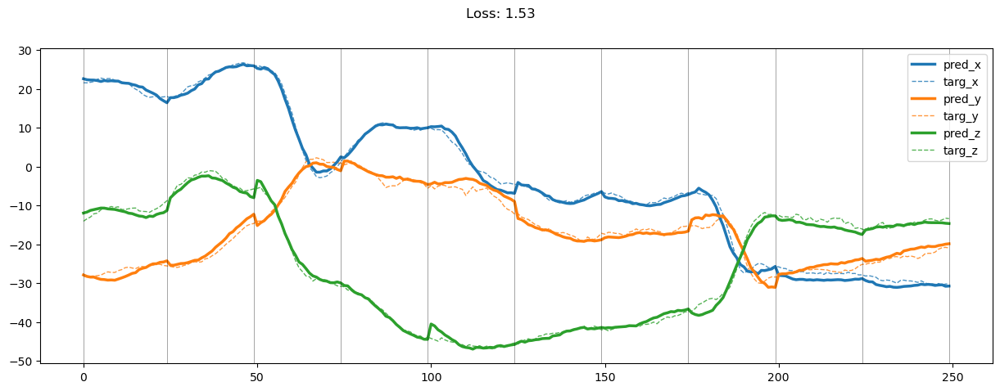

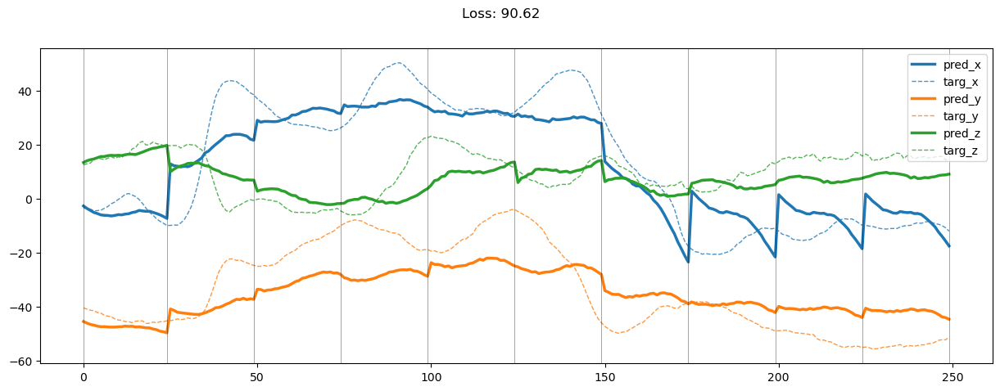

00899: train total loss:  4.306, pred loss:  2.153, valid total loss:  176.458, pred loss:  88.229


100%|██████████| 6/6 [00:00<00:00, 18.85it/s]


00900: train total loss:  4.166, pred loss:  2.083, valid total loss:  177.501, pred loss:  88.750


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00901: train total loss:  4.146, pred loss:  2.073, valid total loss:  175.855, pred loss:  87.928


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00902: train total loss:  4.036, pred loss:  2.018, valid total loss:  176.038, pred loss:  88.019


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00903: train total loss:  4.155, pred loss:  2.078, valid total loss:  180.738, pred loss:  90.369


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00904: train total loss:  4.048, pred loss:  2.024, valid total loss:  176.785, pred loss:  88.392


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00905: train total loss:  4.159, pred loss:  2.080, valid total loss:  179.754, pred loss:  89.877


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00906: train total loss:  4.140, pred loss:  2.070, valid total loss:  177.055, pred loss:  88.528


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00907: train total loss:  4.159, pred loss:  2.079, valid total loss:  175.556, pred loss:  87.778


100%|██████████| 6/6 [00:00<00:00, 20.40it/s]


00908: train total loss:  4.317, pred loss:  2.159, valid total loss:  185.568, pred loss:  92.784


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00909: train total loss:  4.490, pred loss:  2.245, valid total loss:  175.346, pred loss:  87.673


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


00910: train total loss:  4.346, pred loss:  2.173, valid total loss:  176.218, pred loss:  88.109


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


00911: train total loss:  4.372, pred loss:  2.186, valid total loss:  174.219, pred loss:  87.109


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


00912: train total loss:  4.338, pred loss:  2.169, valid total loss:  182.678, pred loss:  91.339


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00913: train total loss:  4.241, pred loss:  2.120, valid total loss:  179.166, pred loss:  89.583


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


00914: train total loss:  4.238, pred loss:  2.119, valid total loss:  177.932, pred loss:  88.966


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00915: train total loss:  4.026, pred loss:  2.013, valid total loss:  180.551, pred loss:  90.276


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00916: train total loss:  4.120, pred loss:  2.060, valid total loss:  182.736, pred loss:  91.368


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00917: train total loss:  4.094, pred loss:  2.047, valid total loss:  179.281, pred loss:  89.640


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


00918: train total loss:  3.964, pred loss:  1.982, valid total loss:  181.116, pred loss:  90.558


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


00919: train total loss:  4.091, pred loss:  2.046, valid total loss:  176.015, pred loss:  88.008


100%|██████████| 6/6 [00:00<00:00, 19.14it/s]


00920: train total loss:  4.003, pred loss:  2.002, valid total loss:  171.379, pred loss:  85.690


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


00921: train total loss:  4.024, pred loss:  2.012, valid total loss:  174.422, pred loss:  87.211


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00922: train total loss:  3.930, pred loss:  1.965, valid total loss:  178.871, pred loss:  89.436


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00923: train total loss:  4.138, pred loss:  2.069, valid total loss:  182.769, pred loss:  91.384


100%|██████████| 6/6 [00:00<00:00, 18.09it/s]


00924: train total loss:  4.022, pred loss:  2.011, valid total loss:  184.408, pred loss:  92.204


100%|██████████| 6/6 [00:00<00:00, 18.07it/s]


00925: train total loss:  4.091, pred loss:  2.045, valid total loss:  182.613, pred loss:  91.307


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


00926: train total loss:  4.166, pred loss:  2.083, valid total loss:  179.802, pred loss:  89.901


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00927: train total loss:  3.961, pred loss:  1.980, valid total loss:  176.935, pred loss:  88.468


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


00928: train total loss:  4.006, pred loss:  2.003, valid total loss:  178.768, pred loss:  89.384


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00929: train total loss:  4.251, pred loss:  2.126, valid total loss:  180.360, pred loss:  90.180


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00930: train total loss:  4.032, pred loss:  2.016, valid total loss:  175.690, pred loss:  87.845


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00931: train total loss:  4.061, pred loss:  2.031, valid total loss:  181.040, pred loss:  90.520


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00932: train total loss:  3.992, pred loss:  1.996, valid total loss:  181.201, pred loss:  90.600


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00933: train total loss:  3.918, pred loss:  1.959, valid total loss:  178.602, pred loss:  89.301


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00934: train total loss:  3.841, pred loss:  1.920, valid total loss:  176.750, pred loss:  88.375


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00935: train total loss:  3.922, pred loss:  1.961, valid total loss:  176.586, pred loss:  88.293


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00936: train total loss:  3.931, pred loss:  1.965, valid total loss:  179.230, pred loss:  89.615


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00937: train total loss:  3.759, pred loss:  1.880, valid total loss:  171.085, pred loss:  85.543


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00938: train total loss:  4.051, pred loss:  2.025, valid total loss:  177.781, pred loss:  88.890


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


00939: train total loss:  3.945, pred loss:  1.973, valid total loss:  173.830, pred loss:  86.915


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00940: train total loss:  3.963, pred loss:  1.982, valid total loss:  179.584, pred loss:  89.792


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


00941: train total loss:  3.882, pred loss:  1.941, valid total loss:  181.720, pred loss:  90.860


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00942: train total loss:  4.159, pred loss:  2.079, valid total loss:  181.933, pred loss:  90.967


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00943: train total loss:  4.011, pred loss:  2.006, valid total loss:  181.278, pred loss:  90.639


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


00944: train total loss:  4.025, pred loss:  2.012, valid total loss:  174.544, pred loss:  87.272


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


00945: train total loss:  4.132, pred loss:  2.066, valid total loss:  175.135, pred loss:  87.568


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00946: train total loss:  4.096, pred loss:  2.048, valid total loss:  174.370, pred loss:  87.185


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


00947: train total loss:  3.977, pred loss:  1.988, valid total loss:  173.641, pred loss:  86.820


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00948: train total loss:  4.019, pred loss:  2.010, valid total loss:  174.536, pred loss:  87.268


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


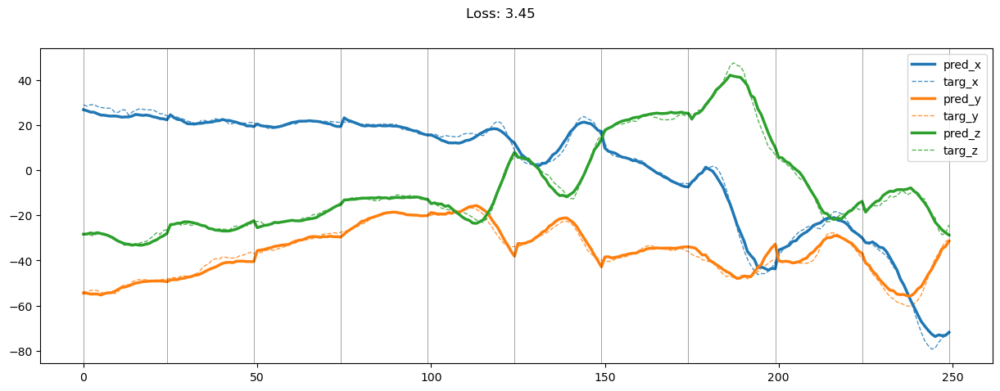

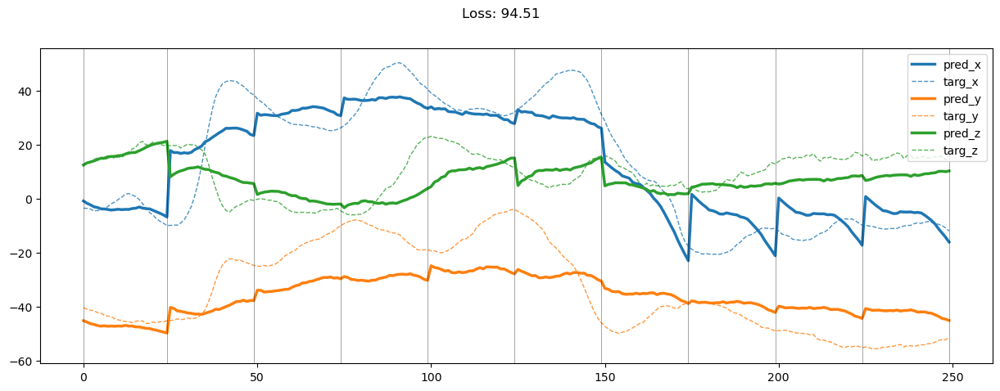

00949: train total loss:  4.023, pred loss:  2.011, valid total loss:  179.796, pred loss:  89.898


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


00950: train total loss:  3.904, pred loss:  1.952, valid total loss:  169.097, pred loss:  84.549


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


00951: train total loss:  4.026, pred loss:  2.013, valid total loss:  180.392, pred loss:  90.196


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


00952: train total loss:  4.125, pred loss:  2.063, valid total loss:  175.238, pred loss:  87.619


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00953: train total loss:  4.178, pred loss:  2.089, valid total loss:  181.411, pred loss:  90.706


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


00954: train total loss:  3.962, pred loss:  1.981, valid total loss:  178.522, pred loss:  89.261


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


00955: train total loss:  3.969, pred loss:  1.985, valid total loss:  181.375, pred loss:  90.687


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


00956: train total loss:  3.925, pred loss:  1.962, valid total loss:  177.525, pred loss:  88.762


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


00957: train total loss:  3.879, pred loss:  1.940, valid total loss:  172.039, pred loss:  86.020


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


00958: train total loss:  3.904, pred loss:  1.952, valid total loss:  173.879, pred loss:  86.940


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


00959: train total loss:  4.034, pred loss:  2.017, valid total loss:  176.619, pred loss:  88.309


100%|██████████| 6/6 [00:00<00:00, 19.15it/s]


00960: train total loss:  3.871, pred loss:  1.936, valid total loss:  167.217, pred loss:  83.608


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00961: train total loss:  3.894, pred loss:  1.947, valid total loss:  173.530, pred loss:  86.765


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00962: train total loss:  3.765, pred loss:  1.882, valid total loss:  173.189, pred loss:  86.594


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00963: train total loss:  3.884, pred loss:  1.942, valid total loss:  175.494, pred loss:  87.747


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00964: train total loss:  3.882, pred loss:  1.941, valid total loss:  175.237, pred loss:  87.619


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


00965: train total loss:  3.770, pred loss:  1.885, valid total loss:  176.065, pred loss:  88.032


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


00966: train total loss:  3.766, pred loss:  1.883, valid total loss:  175.601, pred loss:  87.800


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00967: train total loss:  3.760, pred loss:  1.880, valid total loss:  174.149, pred loss:  87.075


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00968: train total loss:  3.652, pred loss:  1.826, valid total loss:  173.256, pred loss:  86.628


100%|██████████| 6/6 [00:00<00:00, 20.15it/s]


00969: train total loss:  3.621, pred loss:  1.811, valid total loss:  177.564, pred loss:  88.782


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00970: train total loss:  3.641, pred loss:  1.820, valid total loss:  171.288, pred loss:  85.644


100%|██████████| 6/6 [00:00<00:00, 17.68it/s]


00971: train total loss:  3.689, pred loss:  1.845, valid total loss:  177.824, pred loss:  88.912


100%|██████████| 6/6 [00:00<00:00, 17.54it/s]


00972: train total loss:  3.744, pred loss:  1.872, valid total loss:  173.255, pred loss:  86.628


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00973: train total loss:  3.650, pred loss:  1.825, valid total loss:  169.093, pred loss:  84.547


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


00974: train total loss:  3.631, pred loss:  1.816, valid total loss:  169.266, pred loss:  84.633


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


00975: train total loss:  3.744, pred loss:  1.872, valid total loss:  169.967, pred loss:  84.983


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


00976: train total loss:  3.781, pred loss:  1.890, valid total loss:  168.813, pred loss:  84.406


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


00977: train total loss:  3.668, pred loss:  1.834, valid total loss:  169.739, pred loss:  84.870


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


00978: train total loss:  3.644, pred loss:  1.822, valid total loss:  174.735, pred loss:  87.367


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00979: train total loss:  3.645, pred loss:  1.823, valid total loss:  173.868, pred loss:  86.934


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00980: train total loss:  3.562, pred loss:  1.781, valid total loss:  178.415, pred loss:  89.207


100%|██████████| 6/6 [00:00<00:00, 18.04it/s]


00981: train total loss:  3.531, pred loss:  1.766, valid total loss:  174.205, pred loss:  87.102


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


00982: train total loss:  3.759, pred loss:  1.879, valid total loss:  170.639, pred loss:  85.319


100%|██████████| 6/6 [00:00<00:00, 20.36it/s]


00983: train total loss:  3.514, pred loss:  1.757, valid total loss:  173.118, pred loss:  86.559


100%|██████████| 6/6 [00:00<00:00, 18.74it/s]


00984: train total loss:  3.602, pred loss:  1.801, valid total loss:  173.350, pred loss:  86.675


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00985: train total loss:  3.763, pred loss:  1.882, valid total loss:  186.592, pred loss:  93.296


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


00986: train total loss:  6.249, pred loss:  3.124, valid total loss:  187.307, pred loss:  93.653


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


00987: train total loss:  6.444, pred loss:  3.222, valid total loss:  172.284, pred loss:  86.142


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


00988: train total loss:  6.953, pred loss:  3.476, valid total loss:  174.156, pred loss:  87.078


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


00989: train total loss:  7.297, pred loss:  3.649, valid total loss:  194.841, pred loss:  97.421


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


00990: train total loss:  6.988, pred loss:  3.494, valid total loss:  196.946, pred loss:  98.473


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


00991: train total loss:  6.727, pred loss:  3.364, valid total loss:  201.085, pred loss:  100.542


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


00992: train total loss:  6.536, pred loss:  3.268, valid total loss:  181.812, pred loss:  90.906


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


00993: train total loss:  6.167, pred loss:  3.084, valid total loss:  179.831, pred loss:  89.915


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00994: train total loss:  6.316, pred loss:  3.158, valid total loss:  173.376, pred loss:  86.688


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


00995: train total loss:  6.847, pred loss:  3.423, valid total loss:  179.335, pred loss:  89.667


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


00996: train total loss:  7.236, pred loss:  3.618, valid total loss:  198.466, pred loss:  99.233


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


00997: train total loss:  11.498, pred loss:  5.749, valid total loss:  187.238, pred loss:  93.619


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


00998: train total loss:  13.899, pred loss:  6.950, valid total loss:  195.804, pred loss:  97.902


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


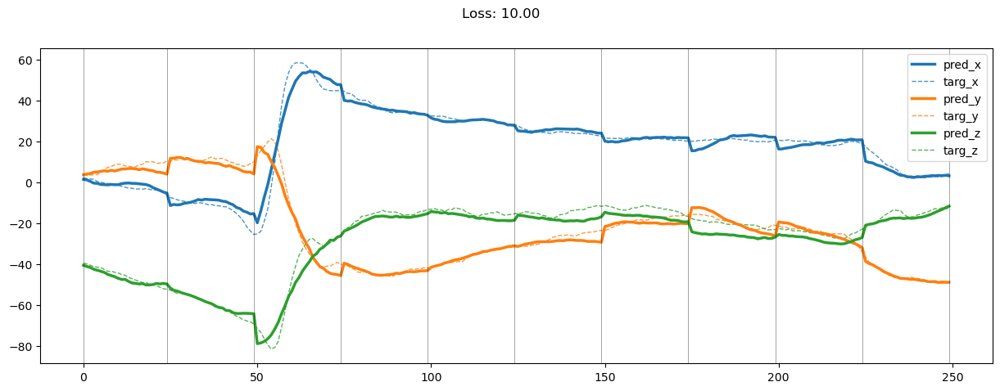

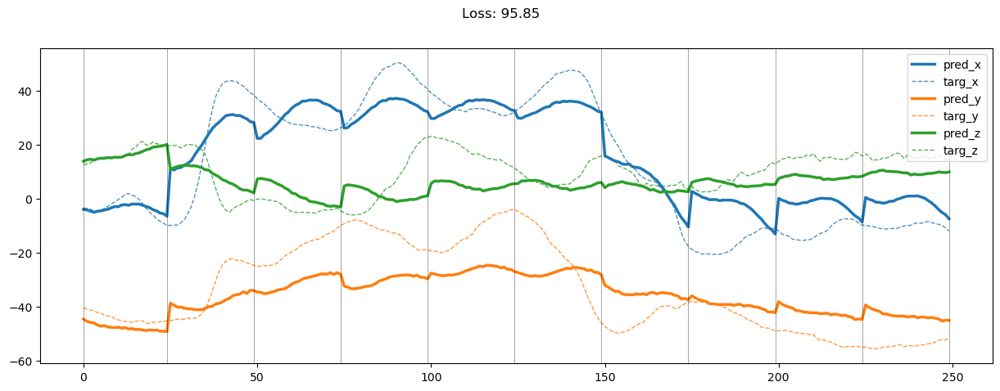

00999: train total loss:  17.137, pred loss:  8.568, valid total loss:  189.235, pred loss:  94.617


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


01000: train total loss:  16.555, pred loss:  8.278, valid total loss:  210.814, pred loss:  105.407


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01001: train total loss:  15.092, pred loss:  7.546, valid total loss:  178.979, pred loss:  89.489


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01002: train total loss:  13.161, pred loss:  6.580, valid total loss:  177.614, pred loss:  88.807


100%|██████████| 6/6 [00:00<00:00, 18.39it/s]


01003: train total loss:  13.437, pred loss:  6.718, valid total loss:  193.498, pred loss:  96.749


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


01004: train total loss:  14.139, pred loss:  7.070, valid total loss:  163.821, pred loss:  81.910


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01005: train total loss:  13.215, pred loss:  6.608, valid total loss:  175.946, pred loss:  87.973


100%|██████████| 6/6 [00:00<00:00, 19.30it/s]


01006: train total loss:  11.814, pred loss:  5.907, valid total loss:  165.266, pred loss:  82.633


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01007: train total loss:  11.472, pred loss:  5.736, valid total loss:  148.790, pred loss:  74.395


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01008: train total loss:  11.469, pred loss:  5.734, valid total loss:  150.911, pred loss:  75.456


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


01009: train total loss:  10.364, pred loss:  5.182, valid total loss:  163.309, pred loss:  81.654


100%|██████████| 6/6 [00:00<00:00, 19.03it/s]


01010: train total loss:  10.276, pred loss:  5.138, valid total loss:  158.811, pred loss:  79.405


100%|██████████| 6/6 [00:00<00:00, 17.62it/s]


01011: train total loss:  8.573, pred loss:  4.287, valid total loss:  155.260, pred loss:  77.630


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01012: train total loss:  8.027, pred loss:  4.013, valid total loss:  170.947, pred loss:  85.474


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01013: train total loss:  7.407, pred loss:  3.704, valid total loss:  178.574, pred loss:  89.287


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01014: train total loss:  6.500, pred loss:  3.250, valid total loss:  171.115, pred loss:  85.557


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01015: train total loss:  6.378, pred loss:  3.189, valid total loss:  176.535, pred loss:  88.267


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01016: train total loss:  5.824, pred loss:  2.912, valid total loss:  168.307, pred loss:  84.154


100%|██████████| 6/6 [00:00<00:00, 19.48it/s]


01017: train total loss:  5.562, pred loss:  2.781, valid total loss:  168.413, pred loss:  84.206


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01018: train total loss:  5.491, pred loss:  2.746, valid total loss:  168.901, pred loss:  84.450


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01019: train total loss:  5.019, pred loss:  2.510, valid total loss:  168.721, pred loss:  84.360


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01020: train total loss:  7.436, pred loss:  3.718, valid total loss:  169.401, pred loss:  84.700


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01021: train total loss:  7.594, pred loss:  3.797, valid total loss:  165.517, pred loss:  82.759


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01022: train total loss:  7.093, pred loss:  3.546, valid total loss:  168.212, pred loss:  84.106


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01023: train total loss:  6.462, pred loss:  3.231, valid total loss:  182.513, pred loss:  91.256


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01024: train total loss:  5.959, pred loss:  2.980, valid total loss:  188.650, pred loss:  94.325


100%|██████████| 6/6 [00:00<00:00, 20.10it/s]


01025: train total loss:  5.851, pred loss:  2.925, valid total loss:  151.874, pred loss:  75.937


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01026: train total loss:  5.222, pred loss:  2.611, valid total loss:  163.800, pred loss:  81.900


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01027: train total loss:  5.260, pred loss:  2.630, valid total loss:  183.389, pred loss:  91.695


100%|██████████| 6/6 [00:00<00:00, 18.65it/s]


01028: train total loss:  5.020, pred loss:  2.510, valid total loss:  190.684, pred loss:  95.342


100%|██████████| 6/6 [00:00<00:00, 19.22it/s]


01029: train total loss:  4.692, pred loss:  2.346, valid total loss:  171.577, pred loss:  85.788


100%|██████████| 6/6 [00:00<00:00, 19.82it/s]


01030: train total loss:  4.785, pred loss:  2.392, valid total loss:  162.478, pred loss:  81.239


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01031: train total loss:  4.495, pred loss:  2.248, valid total loss:  164.809, pred loss:  82.405


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


01032: train total loss:  4.298, pred loss:  2.149, valid total loss:  157.153, pred loss:  78.577


100%|██████████| 6/6 [00:00<00:00, 17.88it/s]


01033: train total loss:  4.338, pred loss:  2.169, valid total loss:  157.755, pred loss:  78.877


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


01034: train total loss:  4.287, pred loss:  2.144, valid total loss:  164.532, pred loss:  82.266


100%|██████████| 6/6 [00:00<00:00, 19.66it/s]


01035: train total loss:  4.092, pred loss:  2.046, valid total loss:  165.128, pred loss:  82.564


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


01036: train total loss:  4.114, pred loss:  2.057, valid total loss:  159.862, pred loss:  79.931


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01037: train total loss:  4.142, pred loss:  2.071, valid total loss:  155.986, pred loss:  77.993


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01038: train total loss:  4.288, pred loss:  2.144, valid total loss:  156.710, pred loss:  78.355


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01039: train total loss:  4.104, pred loss:  2.052, valid total loss:  160.416, pred loss:  80.208


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01040: train total loss:  4.059, pred loss:  2.030, valid total loss:  163.439, pred loss:  81.720


100%|██████████| 6/6 [00:00<00:00, 20.03it/s]


01041: train total loss:  4.122, pred loss:  2.061, valid total loss:  164.816, pred loss:  82.408


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01042: train total loss:  3.955, pred loss:  1.978, valid total loss:  161.458, pred loss:  80.729


100%|██████████| 6/6 [00:00<00:00, 19.88it/s]


01043: train total loss:  3.998, pred loss:  1.999, valid total loss:  158.738, pred loss:  79.369


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01044: train total loss:  3.871, pred loss:  1.935, valid total loss:  159.238, pred loss:  79.619


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01045: train total loss:  3.947, pred loss:  1.973, valid total loss:  155.890, pred loss:  77.945


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01046: train total loss:  3.983, pred loss:  1.992, valid total loss:  162.311, pred loss:  81.156


100%|██████████| 6/6 [00:00<00:00, 19.89it/s]


01047: train total loss:  3.864, pred loss:  1.932, valid total loss:  164.925, pred loss:  82.463


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


01048: train total loss:  3.879, pred loss:  1.939, valid total loss:  163.821, pred loss:  81.910


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


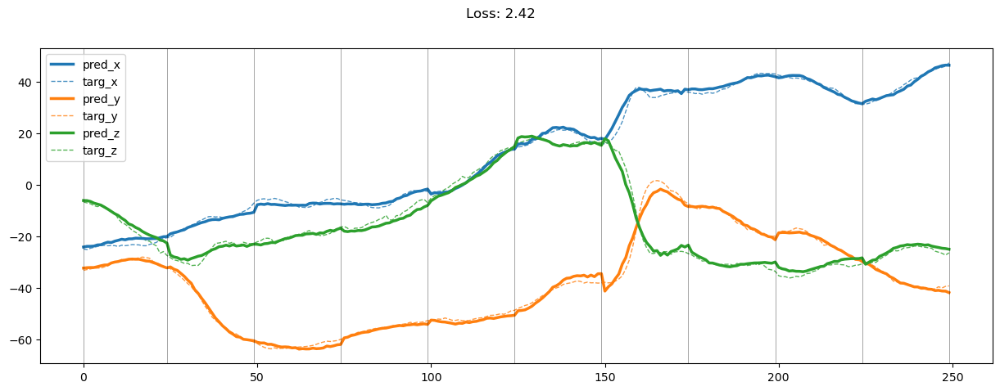

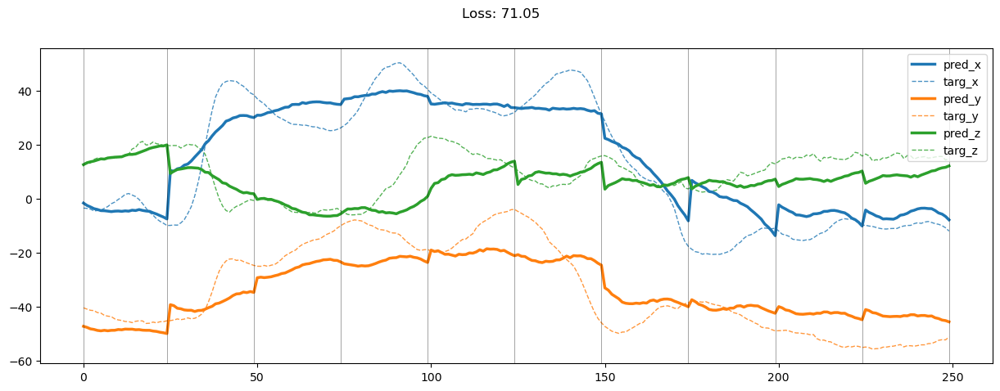

01049: train total loss:  3.983, pred loss:  1.992, valid total loss:  158.141, pred loss:  79.070


100%|██████████| 6/6 [00:00<00:00, 19.05it/s]


01050: train total loss:  3.902, pred loss:  1.951, valid total loss:  159.403, pred loss:  79.701


100%|██████████| 6/6 [00:00<00:00, 19.72it/s]


01051: train total loss:  3.899, pred loss:  1.949, valid total loss:  161.695, pred loss:  80.848


100%|██████████| 6/6 [00:00<00:00, 17.76it/s]


01052: train total loss:  3.954, pred loss:  1.977, valid total loss:  163.789, pred loss:  81.894


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01053: train total loss:  4.027, pred loss:  2.014, valid total loss:  164.347, pred loss:  82.174


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01054: train total loss:  3.896, pred loss:  1.948, valid total loss:  163.165, pred loss:  81.582


100%|██████████| 6/6 [00:00<00:00, 19.44it/s]


01055: train total loss:  4.187, pred loss:  2.094, valid total loss:  157.730, pred loss:  78.865


100%|██████████| 6/6 [00:00<00:00, 19.81it/s]


01056: train total loss:  4.047, pred loss:  2.024, valid total loss:  158.587, pred loss:  79.294


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01057: train total loss:  3.913, pred loss:  1.956, valid total loss:  160.862, pred loss:  80.431


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


01058: train total loss:  3.794, pred loss:  1.897, valid total loss:  162.749, pred loss:  81.374


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01059: train total loss:  3.724, pred loss:  1.862, valid total loss:  166.037, pred loss:  83.018


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01060: train total loss:  3.636, pred loss:  1.818, valid total loss:  165.482, pred loss:  82.741


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01061: train total loss:  3.588, pred loss:  1.794, valid total loss:  164.546, pred loss:  82.273


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01062: train total loss:  3.605, pred loss:  1.803, valid total loss:  161.853, pred loss:  80.926


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01063: train total loss:  3.594, pred loss:  1.797, valid total loss:  160.047, pred loss:  80.023


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01064: train total loss:  3.481, pred loss:  1.741, valid total loss:  163.127, pred loss:  81.564


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01065: train total loss:  3.507, pred loss:  1.754, valid total loss:  162.352, pred loss:  81.176


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01066: train total loss:  3.433, pred loss:  1.717, valid total loss:  159.812, pred loss:  79.906


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01067: train total loss:  3.600, pred loss:  1.800, valid total loss:  163.879, pred loss:  81.940


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01068: train total loss:  3.578, pred loss:  1.789, valid total loss:  164.024, pred loss:  82.012


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01069: train total loss:  3.496, pred loss:  1.748, valid total loss:  162.829, pred loss:  81.415


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01070: train total loss:  3.521, pred loss:  1.760, valid total loss:  163.790, pred loss:  81.895


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01071: train total loss:  3.449, pred loss:  1.725, valid total loss:  166.775, pred loss:  83.388


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01072: train total loss:  3.404, pred loss:  1.702, valid total loss:  159.776, pred loss:  79.888


100%|██████████| 6/6 [00:00<00:00, 19.21it/s]


01073: train total loss:  3.360, pred loss:  1.680, valid total loss:  156.852, pred loss:  78.426


100%|██████████| 6/6 [00:00<00:00, 17.66it/s]


01074: train total loss:  3.419, pred loss:  1.709, valid total loss:  166.359, pred loss:  83.180


100%|██████████| 6/6 [00:00<00:00, 17.81it/s]


01075: train total loss:  3.280, pred loss:  1.640, valid total loss:  168.662, pred loss:  84.331


100%|██████████| 6/6 [00:00<00:00, 17.94it/s]


01076: train total loss:  3.439, pred loss:  1.719, valid total loss:  163.627, pred loss:  81.814


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01077: train total loss:  3.415, pred loss:  1.708, valid total loss:  162.608, pred loss:  81.304


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01078: train total loss:  3.485, pred loss:  1.742, valid total loss:  163.012, pred loss:  81.506


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01079: train total loss:  3.494, pred loss:  1.747, valid total loss:  163.755, pred loss:  81.877


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01080: train total loss:  3.450, pred loss:  1.725, valid total loss:  159.519, pred loss:  79.759


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01081: train total loss:  3.415, pred loss:  1.707, valid total loss:  156.404, pred loss:  78.202


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01082: train total loss:  3.524, pred loss:  1.762, valid total loss:  159.877, pred loss:  79.938


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01083: train total loss:  3.489, pred loss:  1.744, valid total loss:  162.636, pred loss:  81.318


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01084: train total loss:  3.526, pred loss:  1.763, valid total loss:  164.413, pred loss:  82.207


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01085: train total loss:  3.475, pred loss:  1.737, valid total loss:  162.559, pred loss:  81.279


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01086: train total loss:  3.391, pred loss:  1.696, valid total loss:  159.919, pred loss:  79.960


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01087: train total loss:  3.363, pred loss:  1.681, valid total loss:  158.617, pred loss:  79.308


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01088: train total loss:  3.444, pred loss:  1.722, valid total loss:  156.744, pred loss:  78.372


100%|██████████| 6/6 [00:00<00:00, 20.48it/s]


01089: train total loss:  3.308, pred loss:  1.654, valid total loss:  162.021, pred loss:  81.011


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01090: train total loss:  3.399, pred loss:  1.700, valid total loss:  163.651, pred loss:  81.825


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01091: train total loss:  3.384, pred loss:  1.692, valid total loss:  164.934, pred loss:  82.467


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01092: train total loss:  3.371, pred loss:  1.685, valid total loss:  160.913, pred loss:  80.456


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01093: train total loss:  3.361, pred loss:  1.680, valid total loss:  159.536, pred loss:  79.768


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01094: train total loss:  3.409, pred loss:  1.704, valid total loss:  165.943, pred loss:  82.971


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01095: train total loss:  3.402, pred loss:  1.701, valid total loss:  164.039, pred loss:  82.020


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01096: train total loss:  3.358, pred loss:  1.679, valid total loss:  160.871, pred loss:  80.435


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01097: train total loss:  3.434, pred loss:  1.717, valid total loss:  157.623, pred loss:  78.811


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01098: train total loss:  3.345, pred loss:  1.672, valid total loss:  160.730, pred loss:  80.365


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


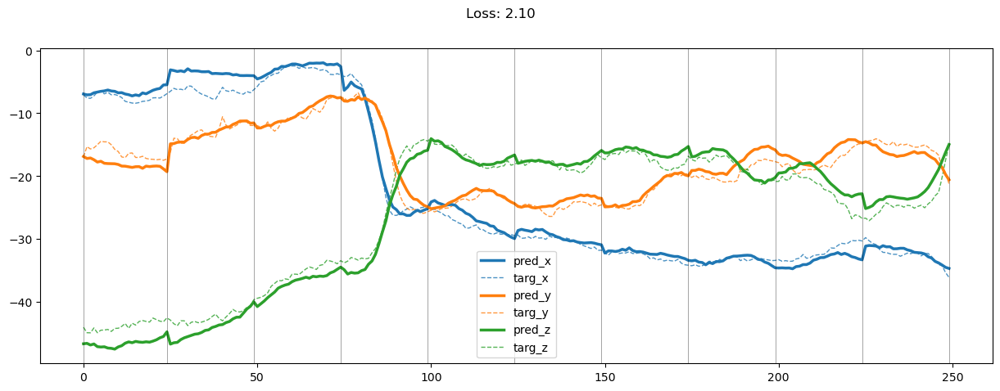

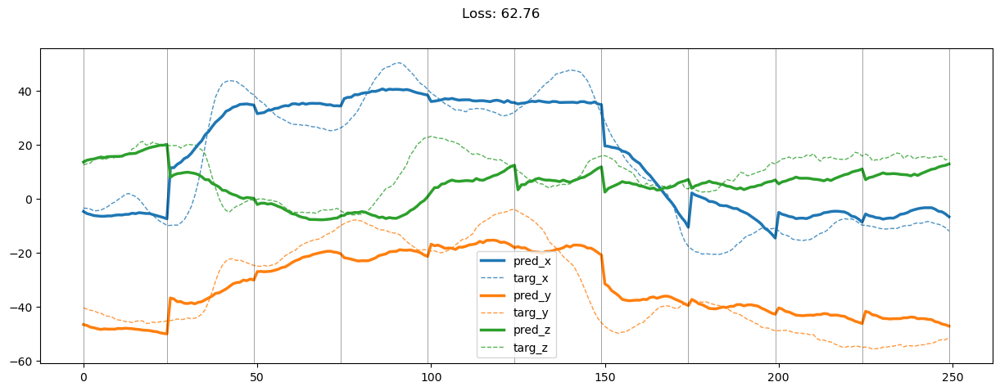

01099: train total loss:  3.364, pred loss:  1.682, valid total loss:  163.089, pred loss:  81.544


100%|██████████| 6/6 [00:00<00:00, 18.62it/s]


01100: train total loss:  3.352, pred loss:  1.676, valid total loss:  163.426, pred loss:  81.713


100%|██████████| 6/6 [00:00<00:00, 20.42it/s]


01101: train total loss:  3.234, pred loss:  1.617, valid total loss:  163.340, pred loss:  81.670


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01102: train total loss:  3.242, pred loss:  1.621, valid total loss:  160.394, pred loss:  80.197


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01103: train total loss:  3.296, pred loss:  1.648, valid total loss:  152.963, pred loss:  76.481


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01104: train total loss:  3.151, pred loss:  1.575, valid total loss:  155.469, pred loss:  77.734


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01105: train total loss:  3.202, pred loss:  1.601, valid total loss:  164.340, pred loss:  82.170


100%|██████████| 6/6 [00:00<00:00, 19.16it/s]


01106: train total loss:  3.156, pred loss:  1.578, valid total loss:  162.992, pred loss:  81.496


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01107: train total loss:  3.170, pred loss:  1.585, valid total loss:  160.133, pred loss:  80.067


100%|██████████| 6/6 [00:00<00:00, 19.27it/s]


01108: train total loss:  3.201, pred loss:  1.600, valid total loss:  162.742, pred loss:  81.371


100%|██████████| 6/6 [00:00<00:00, 17.99it/s]


01109: train total loss:  3.248, pred loss:  1.624, valid total loss:  163.250, pred loss:  81.625


100%|██████████| 6/6 [00:00<00:00, 18.89it/s]


01110: train total loss:  3.311, pred loss:  1.655, valid total loss:  161.483, pred loss:  80.742


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01111: train total loss:  3.308, pred loss:  1.654, valid total loss:  161.455, pred loss:  80.727


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01112: train total loss:  3.297, pred loss:  1.648, valid total loss:  166.709, pred loss:  83.354


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01113: train total loss:  3.217, pred loss:  1.608, valid total loss:  168.299, pred loss:  84.150


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01114: train total loss:  3.208, pred loss:  1.604, valid total loss:  165.401, pred loss:  82.700


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01115: train total loss:  3.307, pred loss:  1.654, valid total loss:  164.445, pred loss:  82.222


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01116: train total loss:  3.274, pred loss:  1.637, valid total loss:  161.728, pred loss:  80.864


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01117: train total loss:  3.227, pred loss:  1.613, valid total loss:  162.336, pred loss:  81.168


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01118: train total loss:  3.250, pred loss:  1.625, valid total loss:  162.278, pred loss:  81.139


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01119: train total loss:  3.333, pred loss:  1.666, valid total loss:  162.910, pred loss:  81.455


100%|██████████| 6/6 [00:00<00:00, 20.44it/s]


01120: train total loss:  3.229, pred loss:  1.614, valid total loss:  165.660, pred loss:  82.830


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01121: train total loss:  3.255, pred loss:  1.627, valid total loss:  164.915, pred loss:  82.458


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01122: train total loss:  3.210, pred loss:  1.605, valid total loss:  162.458, pred loss:  81.229


100%|██████████| 6/6 [00:00<00:00, 20.17it/s]


01123: train total loss:  3.333, pred loss:  1.667, valid total loss:  161.914, pred loss:  80.957


100%|██████████| 6/6 [00:00<00:00, 17.67it/s]


01124: train total loss:  3.321, pred loss:  1.661, valid total loss:  163.102, pred loss:  81.551


100%|██████████| 6/6 [00:00<00:00, 17.57it/s]


01125: train total loss:  3.303, pred loss:  1.652, valid total loss:  167.272, pred loss:  83.636


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01126: train total loss:  3.206, pred loss:  1.603, valid total loss:  164.358, pred loss:  82.179


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01127: train total loss:  3.039, pred loss:  1.519, valid total loss:  162.938, pred loss:  81.469


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01128: train total loss:  3.160, pred loss:  1.580, valid total loss:  161.794, pred loss:  80.897


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01129: train total loss:  3.086, pred loss:  1.543, valid total loss:  162.219, pred loss:  81.109


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01130: train total loss:  3.122, pred loss:  1.561, valid total loss:  160.497, pred loss:  80.248


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01131: train total loss:  3.151, pred loss:  1.575, valid total loss:  162.637, pred loss:  81.319


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01132: train total loss:  3.277, pred loss:  1.639, valid total loss:  161.088, pred loss:  80.544


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01133: train total loss:  3.255, pred loss:  1.627, valid total loss:  161.339, pred loss:  80.670


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


01134: train total loss:  3.318, pred loss:  1.659, valid total loss:  164.693, pred loss:  82.347


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01135: train total loss:  3.118, pred loss:  1.559, valid total loss:  163.389, pred loss:  81.695


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01136: train total loss:  3.060, pred loss:  1.530, valid total loss:  162.481, pred loss:  81.240


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


01137: train total loss:  3.112, pred loss:  1.556, valid total loss:  159.831, pred loss:  79.916


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01138: train total loss:  3.046, pred loss:  1.523, valid total loss:  160.550, pred loss:  80.275


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01139: train total loss:  3.092, pred loss:  1.546, valid total loss:  164.578, pred loss:  82.289


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01140: train total loss:  2.969, pred loss:  1.485, valid total loss:  162.535, pred loss:  81.267


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01141: train total loss:  3.011, pred loss:  1.506, valid total loss:  161.019, pred loss:  80.510


100%|██████████| 6/6 [00:00<00:00, 19.85it/s]


01142: train total loss:  2.992, pred loss:  1.496, valid total loss:  162.273, pred loss:  81.137


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01143: train total loss:  3.041, pred loss:  1.521, valid total loss:  165.044, pred loss:  82.522


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01144: train total loss:  3.062, pred loss:  1.531, valid total loss:  166.177, pred loss:  83.089


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01145: train total loss:  3.078, pred loss:  1.539, valid total loss:  165.960, pred loss:  82.980


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01146: train total loss:  3.034, pred loss:  1.517, valid total loss:  167.904, pred loss:  83.952


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01147: train total loss:  3.091, pred loss:  1.546, valid total loss:  160.629, pred loss:  80.315


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01148: train total loss:  3.091, pred loss:  1.546, valid total loss:  162.177, pred loss:  81.088


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


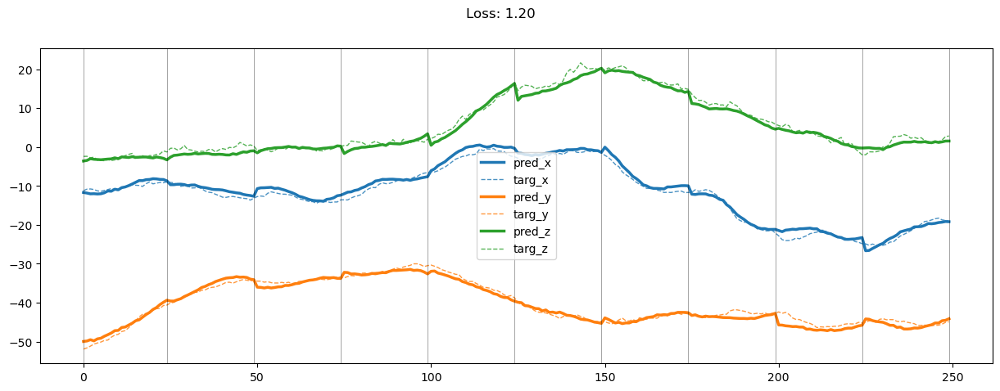

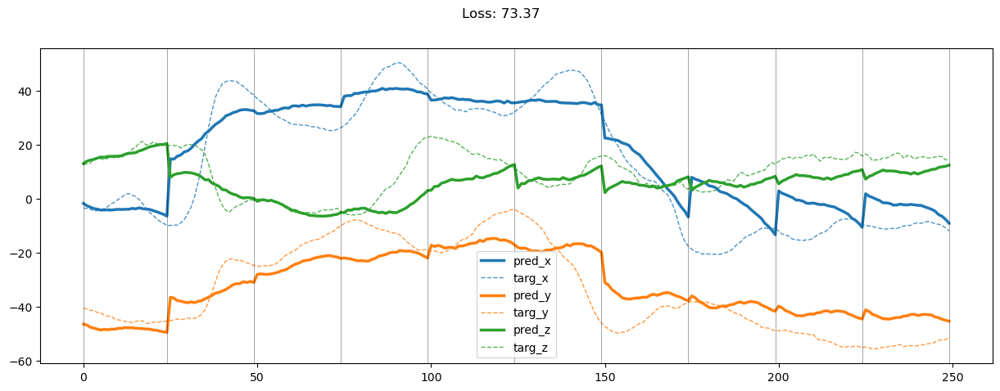

01149: train total loss:  3.135, pred loss:  1.568, valid total loss:  162.217, pred loss:  81.109


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01150: train total loss:  3.004, pred loss:  1.502, valid total loss:  167.586, pred loss:  83.793


100%|██████████| 6/6 [00:00<00:00, 19.90it/s]


01151: train total loss:  3.132, pred loss:  1.566, valid total loss:  164.704, pred loss:  82.352


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01152: train total loss:  3.108, pred loss:  1.554, valid total loss:  165.918, pred loss:  82.959


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01153: train total loss:  3.140, pred loss:  1.570, valid total loss:  158.772, pred loss:  79.386


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01154: train total loss:  2.976, pred loss:  1.488, valid total loss:  165.679, pred loss:  82.840


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01155: train total loss:  2.986, pred loss:  1.493, valid total loss:  162.526, pred loss:  81.263


100%|██████████| 6/6 [00:00<00:00, 20.13it/s]


01156: train total loss:  3.179, pred loss:  1.590, valid total loss:  161.490, pred loss:  80.745


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


01157: train total loss:  3.100, pred loss:  1.550, valid total loss:  161.962, pred loss:  80.981


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01158: train total loss:  3.094, pred loss:  1.547, valid total loss:  162.626, pred loss:  81.313


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01159: train total loss:  3.104, pred loss:  1.552, valid total loss:  161.550, pred loss:  80.775


100%|██████████| 6/6 [00:00<00:00, 20.00it/s]


01160: train total loss:  3.026, pred loss:  1.513, valid total loss:  163.131, pred loss:  81.565


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01161: train total loss:  3.073, pred loss:  1.536, valid total loss:  164.938, pred loss:  82.469


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01162: train total loss:  3.189, pred loss:  1.594, valid total loss:  166.215, pred loss:  83.107


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01163: train total loss:  3.145, pred loss:  1.572, valid total loss:  157.444, pred loss:  78.722


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01164: train total loss:  3.164, pred loss:  1.582, valid total loss:  159.310, pred loss:  79.655


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01165: train total loss:  3.218, pred loss:  1.609, valid total loss:  158.108, pred loss:  79.054


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01166: train total loss:  3.206, pred loss:  1.603, valid total loss:  158.159, pred loss:  79.079


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01167: train total loss:  2.975, pred loss:  1.488, valid total loss:  162.081, pred loss:  81.040


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01168: train total loss:  3.049, pred loss:  1.524, valid total loss:  159.136, pred loss:  79.568


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01169: train total loss:  3.003, pred loss:  1.501, valid total loss:  157.853, pred loss:  78.927


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01170: train total loss:  3.063, pred loss:  1.531, valid total loss:  163.676, pred loss:  81.838


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01171: train total loss:  2.979, pred loss:  1.490, valid total loss:  165.112, pred loss:  82.556


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01172: train total loss:  2.948, pred loss:  1.474, valid total loss:  162.936, pred loss:  81.468


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01173: train total loss:  3.016, pred loss:  1.508, valid total loss:  165.223, pred loss:  82.611


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01174: train total loss:  3.074, pred loss:  1.537, valid total loss:  165.306, pred loss:  82.653


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01175: train total loss:  3.012, pred loss:  1.506, valid total loss:  167.595, pred loss:  83.797


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01176: train total loss:  3.076, pred loss:  1.538, valid total loss:  167.397, pred loss:  83.698


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01177: train total loss:  3.203, pred loss:  1.602, valid total loss:  167.497, pred loss:  83.748


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01178: train total loss:  2.900, pred loss:  1.450, valid total loss:  163.332, pred loss:  81.666


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01179: train total loss:  2.949, pred loss:  1.475, valid total loss:  162.780, pred loss:  81.390


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01180: train total loss:  2.971, pred loss:  1.485, valid total loss:  162.530, pred loss:  81.265


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01181: train total loss:  3.021, pred loss:  1.510, valid total loss:  167.120, pred loss:  83.560


100%|██████████| 6/6 [00:00<00:00, 18.05it/s]


01182: train total loss:  2.965, pred loss:  1.482, valid total loss:  164.869, pred loss:  82.434


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01183: train total loss:  3.059, pred loss:  1.529, valid total loss:  164.225, pred loss:  82.112


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01184: train total loss:  3.055, pred loss:  1.528, valid total loss:  163.869, pred loss:  81.935


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01185: train total loss:  3.107, pred loss:  1.553, valid total loss:  161.516, pred loss:  80.758


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01186: train total loss:  3.117, pred loss:  1.559, valid total loss:  163.452, pred loss:  81.726


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01187: train total loss:  2.953, pred loss:  1.477, valid total loss:  166.120, pred loss:  83.060


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01188: train total loss:  3.048, pred loss:  1.524, valid total loss:  164.842, pred loss:  82.421


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01189: train total loss:  2.974, pred loss:  1.487, valid total loss:  163.609, pred loss:  81.805


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01190: train total loss:  3.074, pred loss:  1.537, valid total loss:  164.849, pred loss:  82.425


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01191: train total loss:  3.095, pred loss:  1.547, valid total loss:  166.278, pred loss:  83.139


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01192: train total loss:  3.027, pred loss:  1.513, valid total loss:  164.163, pred loss:  82.082


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01193: train total loss:  3.077, pred loss:  1.538, valid total loss:  165.365, pred loss:  82.683


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01194: train total loss:  2.994, pred loss:  1.497, valid total loss:  160.568, pred loss:  80.284


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01195: train total loss:  2.972, pred loss:  1.486, valid total loss:  158.692, pred loss:  79.346


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01196: train total loss:  2.965, pred loss:  1.482, valid total loss:  164.275, pred loss:  82.137


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


01197: train total loss:  2.901, pred loss:  1.450, valid total loss:  168.594, pred loss:  84.297


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01198: train total loss:  2.837, pred loss:  1.418, valid total loss:  166.306, pred loss:  83.153


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


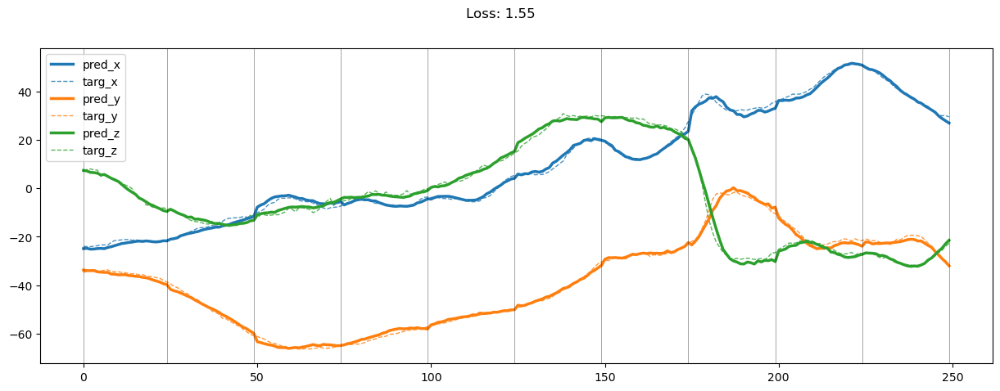

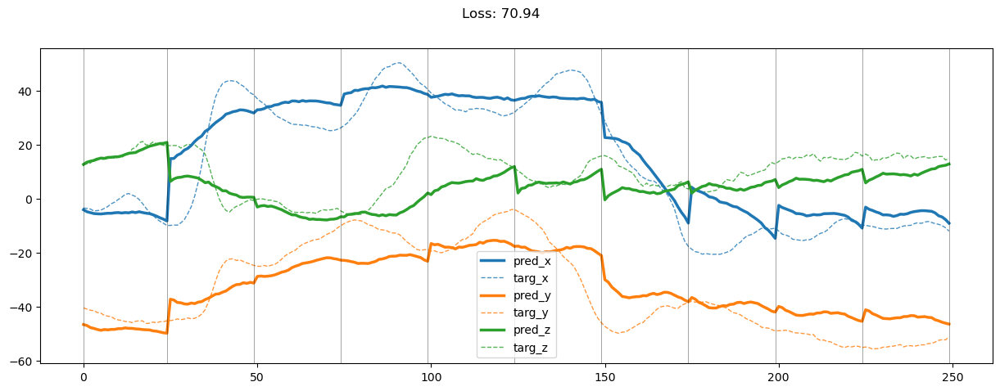

01199: train total loss:  2.853, pred loss:  1.426, valid total loss:  163.570, pred loss:  81.785


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01200: train total loss:  2.852, pred loss:  1.426, valid total loss:  168.583, pred loss:  84.291


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01201: train total loss:  2.841, pred loss:  1.421, valid total loss:  169.281, pred loss:  84.641


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01202: train total loss:  2.734, pred loss:  1.367, valid total loss:  164.284, pred loss:  82.142


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01203: train total loss:  2.796, pred loss:  1.398, valid total loss:  165.364, pred loss:  82.682


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01204: train total loss:  2.803, pred loss:  1.401, valid total loss:  160.718, pred loss:  80.359


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01205: train total loss:  2.810, pred loss:  1.405, valid total loss:  162.709, pred loss:  81.355


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01206: train total loss:  2.868, pred loss:  1.434, valid total loss:  167.918, pred loss:  83.959


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01207: train total loss:  2.834, pred loss:  1.417, valid total loss:  166.417, pred loss:  83.209


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01208: train total loss:  2.739, pred loss:  1.370, valid total loss:  160.476, pred loss:  80.238


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01209: train total loss:  2.805, pred loss:  1.403, valid total loss:  165.851, pred loss:  82.925


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01210: train total loss:  2.840, pred loss:  1.420, valid total loss:  164.551, pred loss:  82.276


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01211: train total loss:  2.799, pred loss:  1.400, valid total loss:  171.440, pred loss:  85.720


100%|██████████| 6/6 [00:00<00:00, 20.14it/s]


01212: train total loss:  2.966, pred loss:  1.483, valid total loss:  168.631, pred loss:  84.316


100%|██████████| 6/6 [00:00<00:00, 18.80it/s]


01213: train total loss:  2.868, pred loss:  1.434, valid total loss:  171.491, pred loss:  85.746


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01214: train total loss:  2.866, pred loss:  1.433, valid total loss:  167.217, pred loss:  83.609


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01215: train total loss:  2.789, pred loss:  1.395, valid total loss:  164.469, pred loss:  82.235


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01216: train total loss:  2.894, pred loss:  1.447, valid total loss:  162.736, pred loss:  81.368


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01217: train total loss:  2.950, pred loss:  1.475, valid total loss:  165.421, pred loss:  82.710


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01218: train total loss:  2.933, pred loss:  1.467, valid total loss:  162.567, pred loss:  81.283


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01219: train total loss:  2.767, pred loss:  1.384, valid total loss:  165.430, pred loss:  82.715


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01220: train total loss:  2.883, pred loss:  1.441, valid total loss:  166.986, pred loss:  83.493


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01221: train total loss:  2.841, pred loss:  1.420, valid total loss:  163.415, pred loss:  81.708


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01222: train total loss:  2.851, pred loss:  1.426, valid total loss:  164.682, pred loss:  82.341


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01223: train total loss:  2.839, pred loss:  1.419, valid total loss:  165.349, pred loss:  82.675


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01224: train total loss:  2.812, pred loss:  1.406, valid total loss:  166.431, pred loss:  83.216


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01225: train total loss:  2.718, pred loss:  1.359, valid total loss:  163.562, pred loss:  81.781


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01226: train total loss:  2.777, pred loss:  1.389, valid total loss:  158.074, pred loss:  79.037


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01227: train total loss:  2.849, pred loss:  1.425, valid total loss:  161.876, pred loss:  80.938


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01228: train total loss:  2.812, pred loss:  1.406, valid total loss:  167.714, pred loss:  83.857


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01229: train total loss:  2.808, pred loss:  1.404, valid total loss:  165.519, pred loss:  82.760


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01230: train total loss:  2.801, pred loss:  1.400, valid total loss:  167.052, pred loss:  83.526


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01231: train total loss:  2.890, pred loss:  1.445, valid total loss:  163.999, pred loss:  82.000


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01232: train total loss:  2.885, pred loss:  1.442, valid total loss:  163.526, pred loss:  81.763


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01233: train total loss:  2.774, pred loss:  1.387, valid total loss:  166.199, pred loss:  83.100


100%|██████████| 6/6 [00:00<00:00, 20.12it/s]


01234: train total loss:  2.773, pred loss:  1.387, valid total loss:  165.782, pred loss:  82.891


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01235: train total loss:  2.811, pred loss:  1.405, valid total loss:  162.595, pred loss:  81.298


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01236: train total loss:  2.807, pred loss:  1.404, valid total loss:  163.050, pred loss:  81.525


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01237: train total loss:  2.891, pred loss:  1.446, valid total loss:  165.510, pred loss:  82.755


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01238: train total loss:  2.891, pred loss:  1.446, valid total loss:  164.827, pred loss:  82.414


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01239: train total loss:  2.998, pred loss:  1.499, valid total loss:  167.396, pred loss:  83.698


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01240: train total loss:  2.954, pred loss:  1.477, valid total loss:  166.795, pred loss:  83.397


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01241: train total loss:  2.898, pred loss:  1.449, valid total loss:  169.250, pred loss:  84.625


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01242: train total loss:  2.945, pred loss:  1.472, valid total loss:  170.895, pred loss:  85.448


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01243: train total loss:  3.001, pred loss:  1.501, valid total loss:  163.871, pred loss:  81.936


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01244: train total loss:  2.883, pred loss:  1.442, valid total loss:  161.956, pred loss:  80.978


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


01245: train total loss:  2.862, pred loss:  1.431, valid total loss:  159.782, pred loss:  79.891


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


01246: train total loss:  2.747, pred loss:  1.373, valid total loss:  164.414, pred loss:  82.207


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


01247: train total loss:  2.816, pred loss:  1.408, valid total loss:  167.079, pred loss:  83.539


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01248: train total loss:  2.756, pred loss:  1.378, valid total loss:  166.472, pred loss:  83.236


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


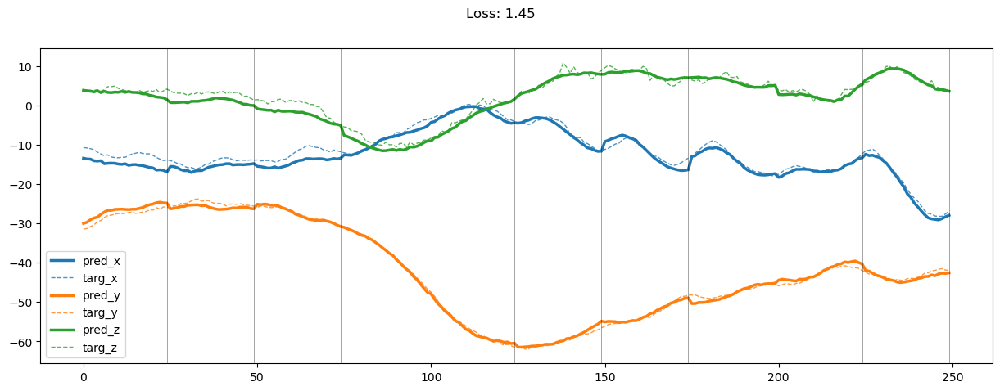

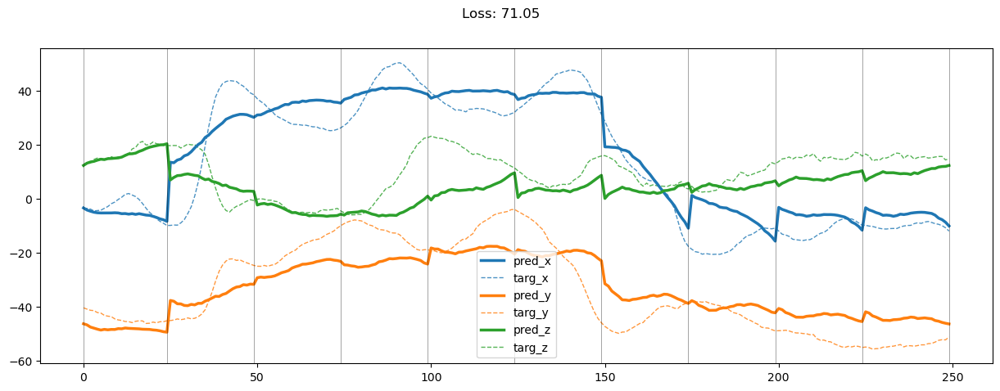

01249: train total loss:  2.939, pred loss:  1.470, valid total loss:  163.792, pred loss:  81.896


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01250: train total loss:  2.880, pred loss:  1.440, valid total loss:  165.965, pred loss:  82.982


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01251: train total loss:  2.863, pred loss:  1.431, valid total loss:  163.323, pred loss:  81.661


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01252: train total loss:  2.872, pred loss:  1.436, valid total loss:  164.468, pred loss:  82.234


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01253: train total loss:  2.824, pred loss:  1.412, valid total loss:  168.053, pred loss:  84.027


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01254: train total loss:  2.750, pred loss:  1.375, valid total loss:  164.973, pred loss:  82.486


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01255: train total loss:  2.761, pred loss:  1.380, valid total loss:  166.878, pred loss:  83.439


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01256: train total loss:  2.766, pred loss:  1.383, valid total loss:  163.730, pred loss:  81.865


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01257: train total loss:  2.699, pred loss:  1.349, valid total loss:  164.634, pred loss:  82.317


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01258: train total loss:  2.693, pred loss:  1.346, valid total loss:  165.073, pred loss:  82.536


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01259: train total loss:  2.738, pred loss:  1.369, valid total loss:  166.229, pred loss:  83.115


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01260: train total loss:  2.752, pred loss:  1.376, valid total loss:  164.355, pred loss:  82.178


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01261: train total loss:  2.778, pred loss:  1.389, valid total loss:  163.213, pred loss:  81.606


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01262: train total loss:  2.802, pred loss:  1.401, valid total loss:  164.128, pred loss:  82.064


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01263: train total loss:  2.851, pred loss:  1.425, valid total loss:  161.912, pred loss:  80.956


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01264: train total loss:  2.855, pred loss:  1.428, valid total loss:  163.306, pred loss:  81.653


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01265: train total loss:  2.886, pred loss:  1.443, valid total loss:  168.586, pred loss:  84.293


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01266: train total loss:  2.869, pred loss:  1.434, valid total loss:  164.686, pred loss:  82.343


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01267: train total loss:  2.734, pred loss:  1.367, valid total loss:  159.719, pred loss:  79.859


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01268: train total loss:  2.792, pred loss:  1.396, valid total loss:  164.579, pred loss:  82.289


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01269: train total loss:  2.766, pred loss:  1.383, valid total loss:  162.890, pred loss:  81.445


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01270: train total loss:  2.734, pred loss:  1.367, valid total loss:  166.847, pred loss:  83.424


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01271: train total loss:  2.737, pred loss:  1.369, valid total loss:  160.644, pred loss:  80.322


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01272: train total loss:  2.645, pred loss:  1.322, valid total loss:  162.118, pred loss:  81.059


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01273: train total loss:  2.615, pred loss:  1.308, valid total loss:  168.082, pred loss:  84.041


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


01274: train total loss:  2.869, pred loss:  1.435, valid total loss:  169.581, pred loss:  84.791


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01275: train total loss:  2.748, pred loss:  1.374, valid total loss:  168.942, pred loss:  84.471


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01276: train total loss:  2.739, pred loss:  1.370, valid total loss:  168.420, pred loss:  84.210


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01277: train total loss:  2.772, pred loss:  1.386, valid total loss:  171.979, pred loss:  85.989


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01278: train total loss:  2.732, pred loss:  1.366, valid total loss:  175.891, pred loss:  87.945


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01279: train total loss:  2.757, pred loss:  1.378, valid total loss:  165.770, pred loss:  82.885


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01280: train total loss:  2.720, pred loss:  1.360, valid total loss:  167.174, pred loss:  83.587


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01281: train total loss:  2.623, pred loss:  1.311, valid total loss:  169.570, pred loss:  84.785


100%|██████████| 6/6 [00:00<00:00, 19.92it/s]


01282: train total loss:  2.659, pred loss:  1.330, valid total loss:  172.840, pred loss:  86.420


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01283: train total loss:  2.699, pred loss:  1.350, valid total loss:  165.858, pred loss:  82.929


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01284: train total loss:  2.618, pred loss:  1.309, valid total loss:  166.918, pred loss:  83.459


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01285: train total loss:  2.634, pred loss:  1.317, valid total loss:  168.343, pred loss:  84.171


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01286: train total loss:  2.639, pred loss:  1.320, valid total loss:  169.814, pred loss:  84.907


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01287: train total loss:  2.613, pred loss:  1.306, valid total loss:  168.473, pred loss:  84.237


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01288: train total loss:  2.562, pred loss:  1.281, valid total loss:  171.867, pred loss:  85.933


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01289: train total loss:  2.704, pred loss:  1.352, valid total loss:  163.424, pred loss:  81.712


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01290: train total loss:  2.588, pred loss:  1.294, valid total loss:  164.747, pred loss:  82.373


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01291: train total loss:  2.656, pred loss:  1.328, valid total loss:  167.561, pred loss:  83.780


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01292: train total loss:  2.593, pred loss:  1.297, valid total loss:  165.574, pred loss:  82.787


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01293: train total loss:  2.614, pred loss:  1.307, valid total loss:  170.713, pred loss:  85.356


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01294: train total loss:  2.650, pred loss:  1.325, valid total loss:  171.541, pred loss:  85.770


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01295: train total loss:  2.733, pred loss:  1.367, valid total loss:  162.360, pred loss:  81.180


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01296: train total loss:  2.770, pred loss:  1.385, valid total loss:  160.908, pred loss:  80.454


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01297: train total loss:  2.797, pred loss:  1.399, valid total loss:  162.911, pred loss:  81.456


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01298: train total loss:  2.801, pred loss:  1.401, valid total loss:  165.972, pred loss:  82.986


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


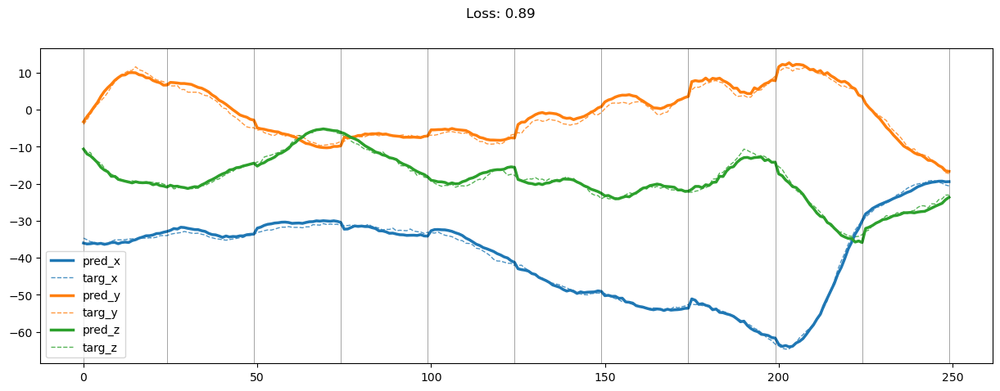

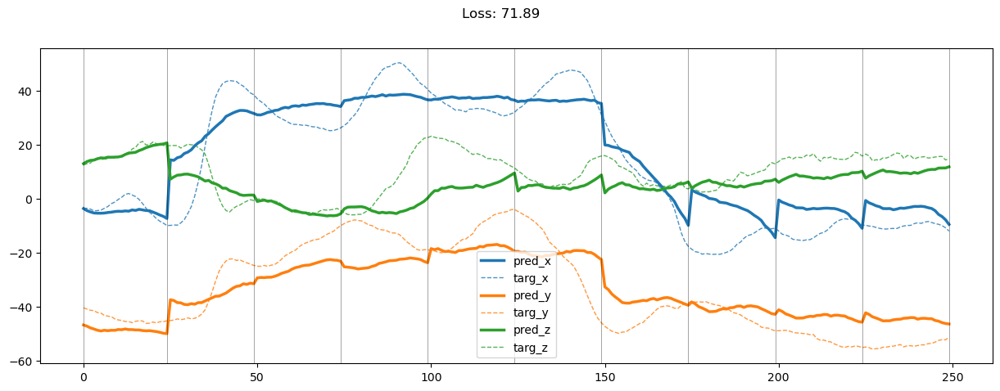

01299: train total loss:  2.756, pred loss:  1.378, valid total loss:  165.095, pred loss:  82.547


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01300: train total loss:  2.834, pred loss:  1.417, valid total loss:  167.568, pred loss:  83.784


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01301: train total loss:  2.877, pred loss:  1.438, valid total loss:  171.771, pred loss:  85.885


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01302: train total loss:  2.960, pred loss:  1.480, valid total loss:  166.254, pred loss:  83.127


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01303: train total loss:  2.981, pred loss:  1.491, valid total loss:  171.975, pred loss:  85.988


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01304: train total loss:  3.019, pred loss:  1.510, valid total loss:  166.057, pred loss:  83.029


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01305: train total loss:  2.926, pred loss:  1.463, valid total loss:  166.037, pred loss:  83.019


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01306: train total loss:  3.065, pred loss:  1.533, valid total loss:  174.297, pred loss:  87.148


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01307: train total loss:  2.842, pred loss:  1.421, valid total loss:  163.638, pred loss:  81.819


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01308: train total loss:  2.804, pred loss:  1.402, valid total loss:  165.128, pred loss:  82.564


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01309: train total loss:  2.687, pred loss:  1.344, valid total loss:  175.459, pred loss:  87.729


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01310: train total loss:  2.616, pred loss:  1.308, valid total loss:  163.984, pred loss:  81.992


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01311: train total loss:  2.600, pred loss:  1.300, valid total loss:  167.966, pred loss:  83.983


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01312: train total loss:  2.657, pred loss:  1.328, valid total loss:  162.152, pred loss:  81.076


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01313: train total loss:  2.757, pred loss:  1.378, valid total loss:  169.148, pred loss:  84.574


100%|██████████| 6/6 [00:00<00:00, 18.60it/s]


01314: train total loss:  2.778, pred loss:  1.389, valid total loss:  166.926, pred loss:  83.463


100%|██████████| 6/6 [00:00<00:00, 18.48it/s]


01315: train total loss:  2.693, pred loss:  1.346, valid total loss:  163.199, pred loss:  81.599


100%|██████████| 6/6 [00:00<00:00, 18.91it/s]


01316: train total loss:  2.651, pred loss:  1.326, valid total loss:  161.165, pred loss:  80.583


100%|██████████| 6/6 [00:00<00:00, 19.04it/s]


01317: train total loss:  2.672, pred loss:  1.336, valid total loss:  163.405, pred loss:  81.702


100%|██████████| 6/6 [00:00<00:00, 19.75it/s]


01318: train total loss:  2.852, pred loss:  1.426, valid total loss:  165.577, pred loss:  82.789


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01319: train total loss:  2.754, pred loss:  1.377, valid total loss:  165.402, pred loss:  82.701


100%|██████████| 6/6 [00:00<00:00, 17.72it/s]


01320: train total loss:  2.689, pred loss:  1.344, valid total loss:  166.450, pred loss:  83.225


100%|██████████| 6/6 [00:00<00:00, 19.74it/s]


01321: train total loss:  2.737, pred loss:  1.369, valid total loss:  164.905, pred loss:  82.452


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01322: train total loss:  2.699, pred loss:  1.350, valid total loss:  160.339, pred loss:  80.169


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01323: train total loss:  2.615, pred loss:  1.307, valid total loss:  168.942, pred loss:  84.471


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01324: train total loss:  2.633, pred loss:  1.316, valid total loss:  165.859, pred loss:  82.929


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01325: train total loss:  2.723, pred loss:  1.362, valid total loss:  166.919, pred loss:  83.459


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01326: train total loss:  2.713, pred loss:  1.356, valid total loss:  164.339, pred loss:  82.169


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01327: train total loss:  2.638, pred loss:  1.319, valid total loss:  159.412, pred loss:  79.706


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01328: train total loss:  2.730, pred loss:  1.365, valid total loss:  160.105, pred loss:  80.053


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01329: train total loss:  2.672, pred loss:  1.336, valid total loss:  164.393, pred loss:  82.196


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01330: train total loss:  2.673, pred loss:  1.337, valid total loss:  164.488, pred loss:  82.244


100%|██████████| 6/6 [00:00<00:00, 19.99it/s]


01331: train total loss:  2.686, pred loss:  1.343, valid total loss:  165.218, pred loss:  82.609


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01332: train total loss:  2.602, pred loss:  1.301, valid total loss:  165.784, pred loss:  82.892


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01333: train total loss:  2.628, pred loss:  1.314, valid total loss:  161.959, pred loss:  80.980


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01334: train total loss:  2.594, pred loss:  1.297, valid total loss:  163.537, pred loss:  81.768


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01335: train total loss:  2.583, pred loss:  1.292, valid total loss:  166.113, pred loss:  83.056


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01336: train total loss:  2.652, pred loss:  1.326, valid total loss:  169.177, pred loss:  84.588


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01337: train total loss:  2.617, pred loss:  1.308, valid total loss:  171.542, pred loss:  85.771


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01338: train total loss:  2.600, pred loss:  1.300, valid total loss:  166.057, pred loss:  83.029


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


01339: train total loss:  2.565, pred loss:  1.282, valid total loss:  169.284, pred loss:  84.642


100%|██████████| 6/6 [00:00<00:00, 17.77it/s]


01340: train total loss:  2.564, pred loss:  1.282, valid total loss:  172.264, pred loss:  86.132


100%|██████████| 6/6 [00:00<00:00, 17.92it/s]


01341: train total loss:  2.481, pred loss:  1.240, valid total loss:  165.484, pred loss:  82.742


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


01342: train total loss:  2.506, pred loss:  1.253, valid total loss:  165.774, pred loss:  82.887


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01343: train total loss:  2.543, pred loss:  1.272, valid total loss:  167.855, pred loss:  83.927


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01344: train total loss:  2.528, pred loss:  1.264, valid total loss:  160.533, pred loss:  80.267


100%|██████████| 6/6 [00:00<00:00, 19.24it/s]


01345: train total loss:  2.497, pred loss:  1.249, valid total loss:  163.906, pred loss:  81.953


100%|██████████| 6/6 [00:00<00:00, 17.88it/s]


01346: train total loss:  2.400, pred loss:  1.200, valid total loss:  163.523, pred loss:  81.761


100%|██████████| 6/6 [00:00<00:00, 18.49it/s]


01347: train total loss:  2.525, pred loss:  1.263, valid total loss:  164.547, pred loss:  82.273


100%|██████████| 6/6 [00:00<00:00, 19.46it/s]


01348: train total loss:  2.552, pred loss:  1.276, valid total loss:  167.304, pred loss:  83.652


100%|██████████| 6/6 [00:00<00:00, 18.00it/s]


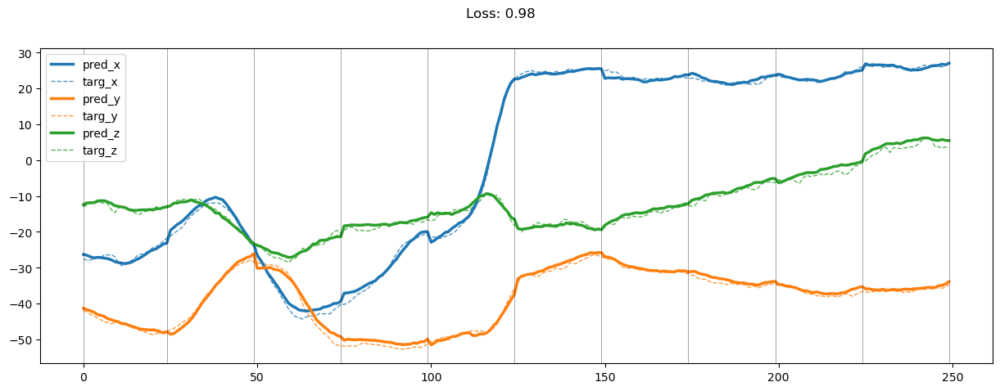

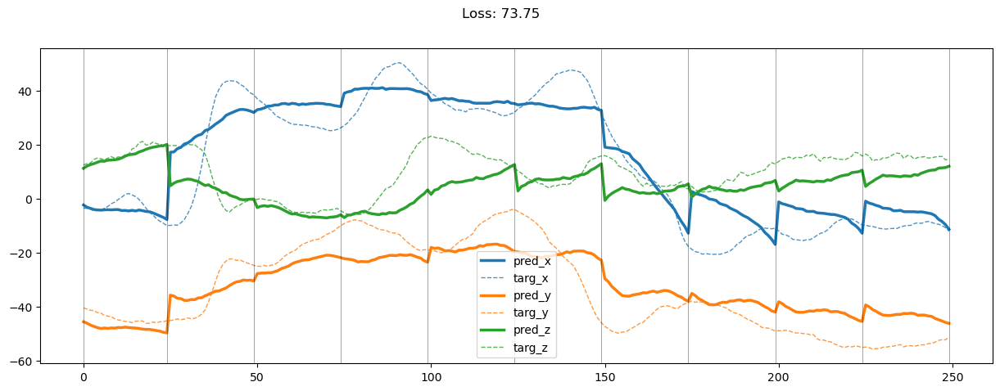

01349: train total loss:  2.482, pred loss:  1.241, valid total loss:  169.206, pred loss:  84.603


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01350: train total loss:  2.540, pred loss:  1.270, valid total loss:  167.107, pred loss:  83.553


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01351: train total loss:  2.499, pred loss:  1.249, valid total loss:  165.257, pred loss:  82.629


100%|██████████| 6/6 [00:00<00:00, 19.47it/s]


01352: train total loss:  2.595, pred loss:  1.298, valid total loss:  165.492, pred loss:  82.746


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01353: train total loss:  2.542, pred loss:  1.271, valid total loss:  168.032, pred loss:  84.016


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01354: train total loss:  2.524, pred loss:  1.262, valid total loss:  170.890, pred loss:  85.445


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01355: train total loss:  2.656, pred loss:  1.328, valid total loss:  169.547, pred loss:  84.773


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01356: train total loss:  2.616, pred loss:  1.308, valid total loss:  167.575, pred loss:  83.788


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01357: train total loss:  2.693, pred loss:  1.346, valid total loss:  160.558, pred loss:  80.279


100%|██████████| 6/6 [00:00<00:00, 18.37it/s]


01358: train total loss:  2.801, pred loss:  1.400, valid total loss:  163.317, pred loss:  81.658


100%|██████████| 6/6 [00:00<00:00, 19.45it/s]


01359: train total loss:  2.843, pred loss:  1.422, valid total loss:  173.351, pred loss:  86.676


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01360: train total loss:  2.757, pred loss:  1.379, valid total loss:  173.885, pred loss:  86.942


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01361: train total loss:  2.674, pred loss:  1.337, valid total loss:  170.989, pred loss:  85.495


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


01362: train total loss:  2.730, pred loss:  1.365, valid total loss:  171.084, pred loss:  85.542


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01363: train total loss:  2.765, pred loss:  1.382, valid total loss:  166.830, pred loss:  83.415


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01364: train total loss:  2.758, pred loss:  1.379, valid total loss:  162.871, pred loss:  81.435


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01365: train total loss:  2.649, pred loss:  1.325, valid total loss:  170.648, pred loss:  85.324


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01366: train total loss:  2.752, pred loss:  1.376, valid total loss:  168.463, pred loss:  84.232


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01367: train total loss:  2.671, pred loss:  1.335, valid total loss:  164.075, pred loss:  82.038


100%|██████████| 6/6 [00:00<00:00, 20.46it/s]


01368: train total loss:  2.661, pred loss:  1.330, valid total loss:  166.453, pred loss:  83.227


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01369: train total loss:  2.564, pred loss:  1.282, valid total loss:  165.631, pred loss:  82.815


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01370: train total loss:  2.545, pred loss:  1.273, valid total loss:  163.610, pred loss:  81.805


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01371: train total loss:  2.553, pred loss:  1.277, valid total loss:  167.038, pred loss:  83.519


100%|██████████| 6/6 [00:00<00:00, 19.48it/s]


01372: train total loss:  2.608, pred loss:  1.304, valid total loss:  169.582, pred loss:  84.791


100%|██████████| 6/6 [00:00<00:00, 20.02it/s]


01373: train total loss:  2.793, pred loss:  1.397, valid total loss:  163.764, pred loss:  81.882


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01374: train total loss:  2.583, pred loss:  1.291, valid total loss:  168.924, pred loss:  84.462


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01375: train total loss:  2.600, pred loss:  1.300, valid total loss:  162.117, pred loss:  81.059


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01376: train total loss:  2.526, pred loss:  1.263, valid total loss:  163.998, pred loss:  81.999


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01377: train total loss:  2.527, pred loss:  1.264, valid total loss:  167.008, pred loss:  83.504


100%|██████████| 6/6 [00:00<00:00, 19.76it/s]


01378: train total loss:  2.528, pred loss:  1.264, valid total loss:  165.368, pred loss:  82.684


100%|██████████| 6/6 [00:00<00:00, 18.20it/s]


01379: train total loss:  2.429, pred loss:  1.214, valid total loss:  167.948, pred loss:  83.974


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01380: train total loss:  2.455, pred loss:  1.228, valid total loss:  171.360, pred loss:  85.680


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01381: train total loss:  2.487, pred loss:  1.243, valid total loss:  168.821, pred loss:  84.410


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01382: train total loss:  2.712, pred loss:  1.356, valid total loss:  169.578, pred loss:  84.789


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01383: train total loss:  2.632, pred loss:  1.316, valid total loss:  156.164, pred loss:  78.082


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01384: train total loss:  2.573, pred loss:  1.287, valid total loss:  160.888, pred loss:  80.444


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01385: train total loss:  2.544, pred loss:  1.272, valid total loss:  164.318, pred loss:  82.159


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01386: train total loss:  2.547, pred loss:  1.273, valid total loss:  165.638, pred loss:  82.819


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01387: train total loss:  2.499, pred loss:  1.250, valid total loss:  162.717, pred loss:  81.358


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01388: train total loss:  2.521, pred loss:  1.260, valid total loss:  168.647, pred loss:  84.324


100%|██████████| 6/6 [00:00<00:00, 19.86it/s]


01389: train total loss:  2.574, pred loss:  1.287, valid total loss:  167.863, pred loss:  83.932


100%|██████████| 6/6 [00:00<00:00, 19.62it/s]


01390: train total loss:  2.558, pred loss:  1.279, valid total loss:  172.249, pred loss:  86.125


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01391: train total loss:  2.600, pred loss:  1.300, valid total loss:  164.075, pred loss:  82.037


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01392: train total loss:  2.718, pred loss:  1.359, valid total loss:  165.523, pred loss:  82.762


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01393: train total loss:  2.772, pred loss:  1.386, valid total loss:  164.730, pred loss:  82.365


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01394: train total loss:  2.621, pred loss:  1.311, valid total loss:  175.765, pred loss:  87.882


100%|██████████| 6/6 [00:00<00:00, 20.27it/s]


01395: train total loss:  2.654, pred loss:  1.327, valid total loss:  166.086, pred loss:  83.043


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01396: train total loss:  2.601, pred loss:  1.301, valid total loss:  169.781, pred loss:  84.890


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01397: train total loss:  2.657, pred loss:  1.328, valid total loss:  168.394, pred loss:  84.197


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01398: train total loss:  2.505, pred loss:  1.252, valid total loss:  166.868, pred loss:  83.434


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


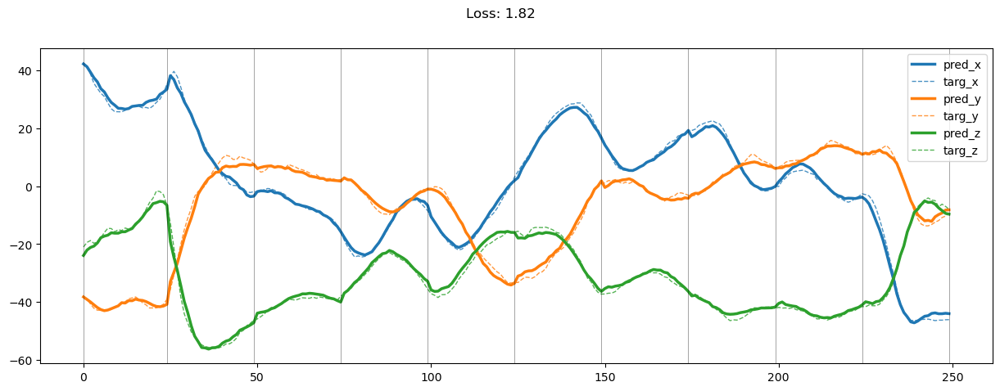

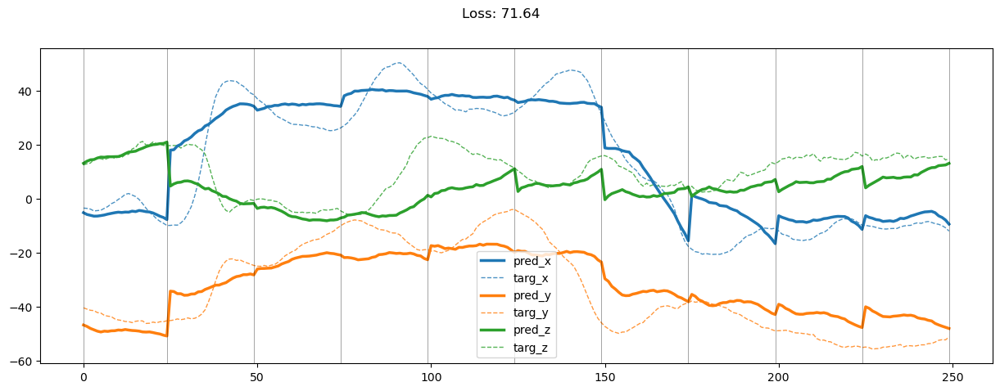

01399: train total loss:  2.423, pred loss:  1.211, valid total loss:  167.476, pred loss:  83.738


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


01400: train total loss:  2.379, pred loss:  1.190, valid total loss:  166.778, pred loss:  83.389


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01401: train total loss:  2.437, pred loss:  1.219, valid total loss:  167.556, pred loss:  83.778


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01402: train total loss:  2.387, pred loss:  1.193, valid total loss:  163.009, pred loss:  81.504


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01403: train total loss:  2.391, pred loss:  1.196, valid total loss:  165.893, pred loss:  82.946


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01404: train total loss:  2.337, pred loss:  1.168, valid total loss:  167.531, pred loss:  83.765


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01405: train total loss:  2.456, pred loss:  1.228, valid total loss:  166.324, pred loss:  83.162


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01406: train total loss:  2.432, pred loss:  1.216, valid total loss:  167.652, pred loss:  83.826


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01407: train total loss:  2.326, pred loss:  1.163, valid total loss:  164.478, pred loss:  82.239


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01408: train total loss:  2.400, pred loss:  1.200, valid total loss:  165.426, pred loss:  82.713


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01409: train total loss:  2.393, pred loss:  1.196, valid total loss:  168.855, pred loss:  84.427


100%|██████████| 6/6 [00:00<00:00, 19.34it/s]


01410: train total loss:  2.463, pred loss:  1.231, valid total loss:  166.438, pred loss:  83.219


100%|██████████| 6/6 [00:00<00:00, 19.53it/s]


01411: train total loss:  2.451, pred loss:  1.225, valid total loss:  167.350, pred loss:  83.675


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01412: train total loss:  2.550, pred loss:  1.275, valid total loss:  165.985, pred loss:  82.992


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01413: train total loss:  2.634, pred loss:  1.317, valid total loss:  166.226, pred loss:  83.113


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01414: train total loss:  2.585, pred loss:  1.293, valid total loss:  167.465, pred loss:  83.733


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01415: train total loss:  2.567, pred loss:  1.284, valid total loss:  164.323, pred loss:  82.162


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01416: train total loss:  2.547, pred loss:  1.273, valid total loss:  163.234, pred loss:  81.617


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01417: train total loss:  2.685, pred loss:  1.342, valid total loss:  164.426, pred loss:  82.213


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01418: train total loss:  2.557, pred loss:  1.279, valid total loss:  174.134, pred loss:  87.067


100%|██████████| 6/6 [00:00<00:00, 19.74it/s]


01419: train total loss:  2.577, pred loss:  1.289, valid total loss:  170.975, pred loss:  85.487


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01420: train total loss:  2.527, pred loss:  1.264, valid total loss:  168.858, pred loss:  84.429


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01421: train total loss:  2.378, pred loss:  1.189, valid total loss:  166.921, pred loss:  83.461


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01422: train total loss:  2.352, pred loss:  1.176, valid total loss:  163.254, pred loss:  81.627


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01423: train total loss:  2.333, pred loss:  1.167, valid total loss:  165.121, pred loss:  82.560


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01424: train total loss:  2.317, pred loss:  1.158, valid total loss:  170.407, pred loss:  85.203


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01425: train total loss:  2.241, pred loss:  1.121, valid total loss:  168.908, pred loss:  84.454


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01426: train total loss:  2.295, pred loss:  1.148, valid total loss:  165.518, pred loss:  82.759


100%|██████████| 6/6 [00:00<00:00, 20.22it/s]


01427: train total loss:  2.340, pred loss:  1.170, valid total loss:  167.490, pred loss:  83.745


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01428: train total loss:  2.421, pred loss:  1.211, valid total loss:  162.937, pred loss:  81.469


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01429: train total loss:  2.367, pred loss:  1.184, valid total loss:  172.226, pred loss:  86.113


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01430: train total loss:  2.444, pred loss:  1.222, valid total loss:  163.937, pred loss:  81.969


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01431: train total loss:  2.422, pred loss:  1.211, valid total loss:  164.159, pred loss:  82.079


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01432: train total loss:  2.384, pred loss:  1.192, valid total loss:  163.335, pred loss:  81.667


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01433: train total loss:  2.340, pred loss:  1.170, valid total loss:  168.703, pred loss:  84.352


100%|██████████| 6/6 [00:00<00:00, 18.73it/s]


01434: train total loss:  2.461, pred loss:  1.231, valid total loss:  166.071, pred loss:  83.036


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01435: train total loss:  2.422, pred loss:  1.211, valid total loss:  168.281, pred loss:  84.141


100%|██████████| 6/6 [00:00<00:00, 18.80it/s]


01436: train total loss:  2.459, pred loss:  1.230, valid total loss:  164.828, pred loss:  82.414


100%|██████████| 6/6 [00:00<00:00, 19.50it/s]


01437: train total loss:  2.423, pred loss:  1.211, valid total loss:  165.453, pred loss:  82.726


100%|██████████| 6/6 [00:00<00:00, 19.90it/s]


01438: train total loss:  2.316, pred loss:  1.158, valid total loss:  169.914, pred loss:  84.957


100%|██████████| 6/6 [00:00<00:00, 19.91it/s]


01439: train total loss:  2.339, pred loss:  1.169, valid total loss:  168.029, pred loss:  84.014


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01440: train total loss:  2.285, pred loss:  1.142, valid total loss:  168.960, pred loss:  84.480


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01441: train total loss:  2.336, pred loss:  1.168, valid total loss:  170.666, pred loss:  85.333


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01442: train total loss:  2.346, pred loss:  1.173, valid total loss:  168.481, pred loss:  84.241


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01443: train total loss:  2.398, pred loss:  1.199, valid total loss:  170.099, pred loss:  85.049


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01444: train total loss:  2.361, pred loss:  1.180, valid total loss:  167.575, pred loss:  83.788


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01445: train total loss:  2.405, pred loss:  1.203, valid total loss:  168.595, pred loss:  84.298


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01446: train total loss:  2.383, pred loss:  1.192, valid total loss:  163.419, pred loss:  81.709


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01447: train total loss:  2.423, pred loss:  1.211, valid total loss:  161.828, pred loss:  80.914


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01448: train total loss:  2.440, pred loss:  1.220, valid total loss:  165.654, pred loss:  82.827


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


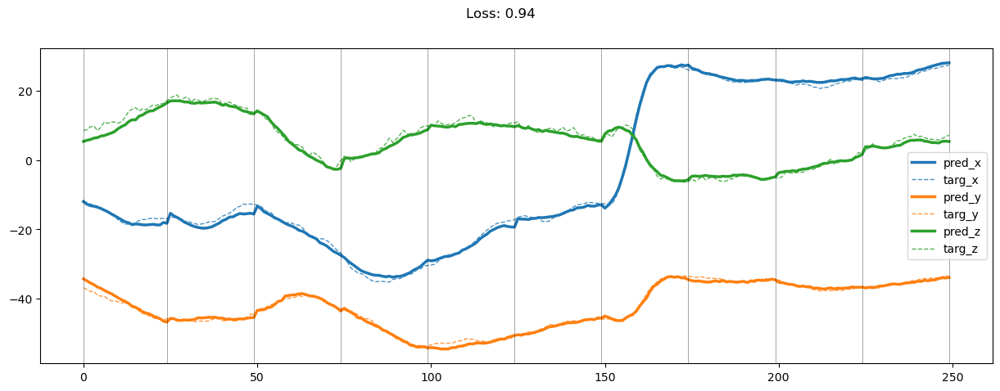

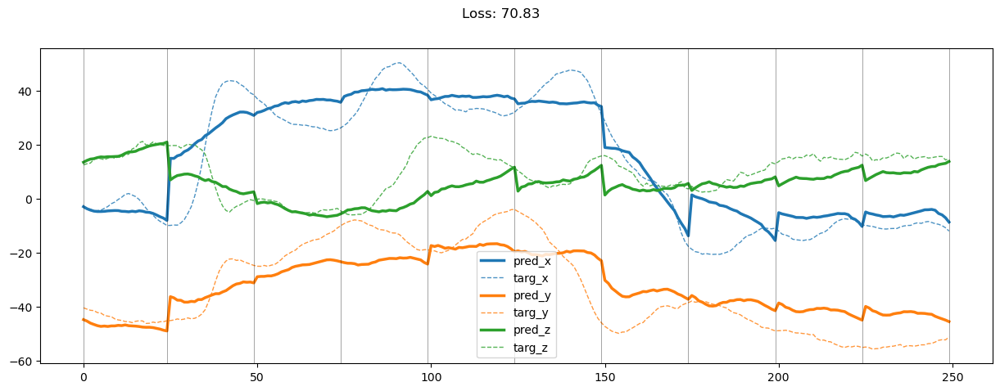

01449: train total loss:  2.484, pred loss:  1.242, valid total loss:  166.631, pred loss:  83.316


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01450: train total loss:  2.414, pred loss:  1.207, valid total loss:  175.318, pred loss:  87.659


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01451: train total loss:  2.353, pred loss:  1.177, valid total loss:  168.077, pred loss:  84.038


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01452: train total loss:  2.357, pred loss:  1.178, valid total loss:  168.315, pred loss:  84.157


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01453: train total loss:  2.326, pred loss:  1.163, valid total loss:  163.850, pred loss:  81.925


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01454: train total loss:  2.366, pred loss:  1.183, valid total loss:  163.351, pred loss:  81.676


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01455: train total loss:  2.359, pred loss:  1.180, valid total loss:  164.681, pred loss:  82.340


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01456: train total loss:  2.394, pred loss:  1.197, valid total loss:  171.400, pred loss:  85.700


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01457: train total loss:  2.266, pred loss:  1.133, valid total loss:  173.013, pred loss:  86.506


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01458: train total loss:  2.312, pred loss:  1.156, valid total loss:  169.101, pred loss:  84.551


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01459: train total loss:  2.326, pred loss:  1.163, valid total loss:  167.131, pred loss:  83.566


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01460: train total loss:  2.335, pred loss:  1.168, valid total loss:  166.890, pred loss:  83.445


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01461: train total loss:  2.302, pred loss:  1.151, valid total loss:  168.123, pred loss:  84.062


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01462: train total loss:  2.288, pred loss:  1.144, valid total loss:  169.955, pred loss:  84.978


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


01463: train total loss:  2.362, pred loss:  1.181, valid total loss:  170.828, pred loss:  85.414


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01464: train total loss:  2.343, pred loss:  1.171, valid total loss:  169.074, pred loss:  84.537


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01465: train total loss:  2.255, pred loss:  1.128, valid total loss:  167.147, pred loss:  83.573


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01466: train total loss:  2.242, pred loss:  1.121, valid total loss:  166.921, pred loss:  83.461


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


01467: train total loss:  2.305, pred loss:  1.153, valid total loss:  169.684, pred loss:  84.842


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01468: train total loss:  2.243, pred loss:  1.121, valid total loss:  167.986, pred loss:  83.993


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01469: train total loss:  2.282, pred loss:  1.141, valid total loss:  166.503, pred loss:  83.252


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01470: train total loss:  2.369, pred loss:  1.184, valid total loss:  167.447, pred loss:  83.724


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01471: train total loss:  2.382, pred loss:  1.191, valid total loss:  170.788, pred loss:  85.394


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01472: train total loss:  2.397, pred loss:  1.199, valid total loss:  165.963, pred loss:  82.982


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01473: train total loss:  2.443, pred loss:  1.221, valid total loss:  168.029, pred loss:  84.015


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01474: train total loss:  2.344, pred loss:  1.172, valid total loss:  166.303, pred loss:  83.152


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01475: train total loss:  2.329, pred loss:  1.164, valid total loss:  169.088, pred loss:  84.544


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01476: train total loss:  2.371, pred loss:  1.185, valid total loss:  163.001, pred loss:  81.501


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01477: train total loss:  2.374, pred loss:  1.187, valid total loss:  165.805, pred loss:  82.903


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01478: train total loss:  2.346, pred loss:  1.173, valid total loss:  166.571, pred loss:  83.285


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01479: train total loss:  2.221, pred loss:  1.110, valid total loss:  167.952, pred loss:  83.976


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01480: train total loss:  2.244, pred loss:  1.122, valid total loss:  167.822, pred loss:  83.911


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01481: train total loss:  2.256, pred loss:  1.128, valid total loss:  170.392, pred loss:  85.196


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01482: train total loss:  2.292, pred loss:  1.146, valid total loss:  166.591, pred loss:  83.295


100%|██████████| 6/6 [00:00<00:00, 20.31it/s]


01483: train total loss:  2.221, pred loss:  1.111, valid total loss:  166.145, pred loss:  83.072


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01484: train total loss:  2.365, pred loss:  1.183, valid total loss:  172.352, pred loss:  86.176


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01485: train total loss:  2.455, pred loss:  1.227, valid total loss:  167.284, pred loss:  83.642


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01486: train total loss:  2.358, pred loss:  1.179, valid total loss:  159.987, pred loss:  79.993


100%|██████████| 6/6 [00:00<00:00, 20.18it/s]


01487: train total loss:  2.373, pred loss:  1.186, valid total loss:  169.030, pred loss:  84.515


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01488: train total loss:  2.350, pred loss:  1.175, valid total loss:  165.737, pred loss:  82.869


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01489: train total loss:  2.490, pred loss:  1.245, valid total loss:  169.807, pred loss:  84.903


100%|██████████| 6/6 [00:00<00:00, 19.71it/s]


01490: train total loss:  2.305, pred loss:  1.153, valid total loss:  170.589, pred loss:  85.295


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01491: train total loss:  2.422, pred loss:  1.211, valid total loss:  171.161, pred loss:  85.581


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01492: train total loss:  2.507, pred loss:  1.253, valid total loss:  165.446, pred loss:  82.723


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01493: train total loss:  2.600, pred loss:  1.300, valid total loss:  168.534, pred loss:  84.267


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01494: train total loss:  2.537, pred loss:  1.268, valid total loss:  170.585, pred loss:  85.293


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01495: train total loss:  2.549, pred loss:  1.275, valid total loss:  171.288, pred loss:  85.644


100%|██████████| 6/6 [00:00<00:00, 18.44it/s]


01496: train total loss:  2.422, pred loss:  1.211, valid total loss:  170.730, pred loss:  85.365


100%|██████████| 6/6 [00:00<00:00, 20.01it/s]


01497: train total loss:  2.386, pred loss:  1.193, valid total loss:  170.519, pred loss:  85.259


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01498: train total loss:  2.295, pred loss:  1.147, valid total loss:  170.691, pred loss:  85.346


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


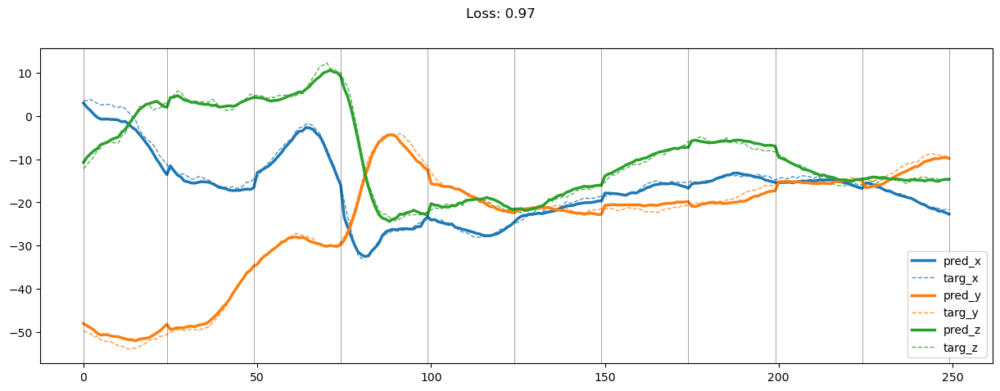

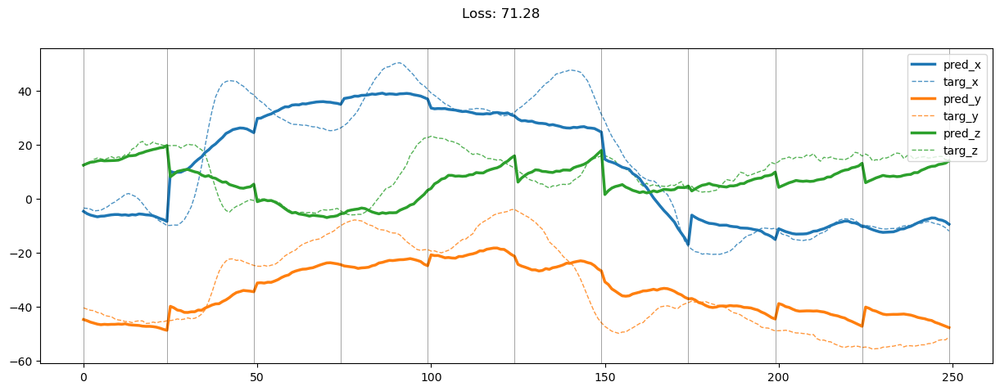

01499: train total loss:  2.194, pred loss:  1.097, valid total loss:  169.986, pred loss:  84.993


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01500: train total loss:  2.268, pred loss:  1.134, valid total loss:  166.479, pred loss:  83.239


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01501: train total loss:  2.361, pred loss:  1.181, valid total loss:  169.083, pred loss:  84.541


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01502: train total loss:  2.315, pred loss:  1.158, valid total loss:  171.550, pred loss:  85.775


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01503: train total loss:  2.236, pred loss:  1.118, valid total loss:  167.754, pred loss:  83.877


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01504: train total loss:  2.346, pred loss:  1.173, valid total loss:  164.338, pred loss:  82.169


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01505: train total loss:  2.217, pred loss:  1.109, valid total loss:  163.454, pred loss:  81.727


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01506: train total loss:  2.277, pred loss:  1.138, valid total loss:  165.330, pred loss:  82.665


100%|██████████| 6/6 [00:00<00:00, 18.34it/s]


01507: train total loss:  2.235, pred loss:  1.117, valid total loss:  168.714, pred loss:  84.357


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01508: train total loss:  2.306, pred loss:  1.153, valid total loss:  169.013, pred loss:  84.507


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01509: train total loss:  2.340, pred loss:  1.170, valid total loss:  169.568, pred loss:  84.784


100%|██████████| 6/6 [00:00<00:00, 19.60it/s]


01510: train total loss:  2.336, pred loss:  1.168, valid total loss:  168.804, pred loss:  84.402


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


01511: train total loss:  2.341, pred loss:  1.170, valid total loss:  169.858, pred loss:  84.929


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01512: train total loss:  2.224, pred loss:  1.112, valid total loss:  168.342, pred loss:  84.171


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01513: train total loss:  2.292, pred loss:  1.146, valid total loss:  171.433, pred loss:  85.716


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01514: train total loss:  2.290, pred loss:  1.145, valid total loss:  165.873, pred loss:  82.937


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01515: train total loss:  2.335, pred loss:  1.167, valid total loss:  170.147, pred loss:  85.073


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01516: train total loss:  2.349, pred loss:  1.174, valid total loss:  171.410, pred loss:  85.705


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01517: train total loss:  2.285, pred loss:  1.143, valid total loss:  170.687, pred loss:  85.343


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01518: train total loss:  2.284, pred loss:  1.142, valid total loss:  169.584, pred loss:  84.792


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01519: train total loss:  2.204, pred loss:  1.102, valid total loss:  170.241, pred loss:  85.121


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01520: train total loss:  2.190, pred loss:  1.095, valid total loss:  170.012, pred loss:  85.006


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01521: train total loss:  2.182, pred loss:  1.091, valid total loss:  172.728, pred loss:  86.364


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01522: train total loss:  2.158, pred loss:  1.079, valid total loss:  169.657, pred loss:  84.828


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01523: train total loss:  2.176, pred loss:  1.088, valid total loss:  170.369, pred loss:  85.185


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01524: train total loss:  2.182, pred loss:  1.091, valid total loss:  167.777, pred loss:  83.888


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01525: train total loss:  2.145, pred loss:  1.073, valid total loss:  169.292, pred loss:  84.646


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01526: train total loss:  2.230, pred loss:  1.115, valid total loss:  166.825, pred loss:  83.413


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01527: train total loss:  2.275, pred loss:  1.137, valid total loss:  171.458, pred loss:  85.729


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01528: train total loss:  2.254, pred loss:  1.127, valid total loss:  172.921, pred loss:  86.460


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01529: train total loss:  2.205, pred loss:  1.102, valid total loss:  174.759, pred loss:  87.379


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01530: train total loss:  2.339, pred loss:  1.170, valid total loss:  167.645, pred loss:  83.823


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01531: train total loss:  2.292, pred loss:  1.146, valid total loss:  172.772, pred loss:  86.386


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01532: train total loss:  2.226, pred loss:  1.113, valid total loss:  177.142, pred loss:  88.571


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01533: train total loss:  2.349, pred loss:  1.175, valid total loss:  172.634, pred loss:  86.317


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01534: train total loss:  2.393, pred loss:  1.197, valid total loss:  170.591, pred loss:  85.295


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01535: train total loss:  2.335, pred loss:  1.168, valid total loss:  176.383, pred loss:  88.191


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01536: train total loss:  2.271, pred loss:  1.136, valid total loss:  169.947, pred loss:  84.973


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01537: train total loss:  2.197, pred loss:  1.099, valid total loss:  167.952, pred loss:  83.976


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01538: train total loss:  2.241, pred loss:  1.120, valid total loss:  169.215, pred loss:  84.608


100%|██████████| 6/6 [00:00<00:00, 19.77it/s]


01539: train total loss:  2.155, pred loss:  1.078, valid total loss:  164.644, pred loss:  82.322


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01540: train total loss:  2.154, pred loss:  1.077, valid total loss:  169.618, pred loss:  84.809


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01541: train total loss:  2.127, pred loss:  1.063, valid total loss:  168.993, pred loss:  84.497


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01542: train total loss:  2.102, pred loss:  1.051, valid total loss:  167.960, pred loss:  83.980


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01543: train total loss:  2.032, pred loss:  1.016, valid total loss:  171.067, pred loss:  85.534


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01544: train total loss:  2.094, pred loss:  1.047, valid total loss:  169.333, pred loss:  84.667


100%|██████████| 6/6 [00:00<00:00, 19.72it/s]


01545: train total loss:  2.069, pred loss:  1.035, valid total loss:  167.788, pred loss:  83.894


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01546: train total loss:  2.042, pred loss:  1.021, valid total loss:  166.531, pred loss:  83.266


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01547: train total loss:  2.123, pred loss:  1.062, valid total loss:  170.143, pred loss:  85.071


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


01548: train total loss:  2.169, pred loss:  1.085, valid total loss:  174.419, pred loss:  87.210


100%|██████████| 6/6 [00:00<00:00, 19.57it/s]


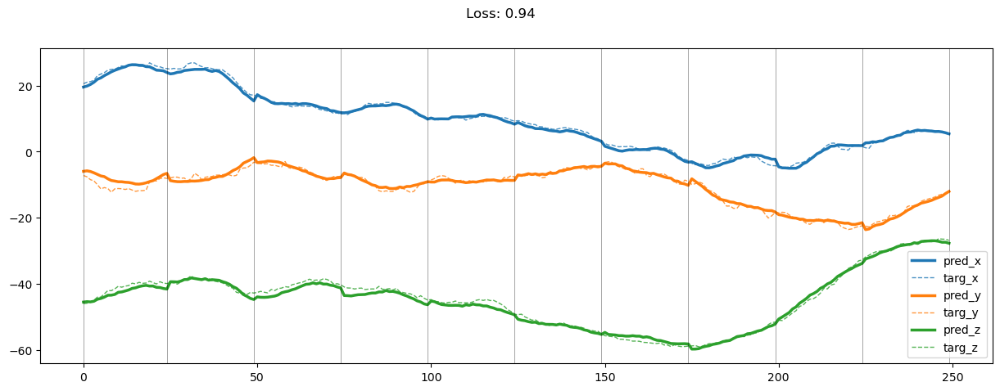

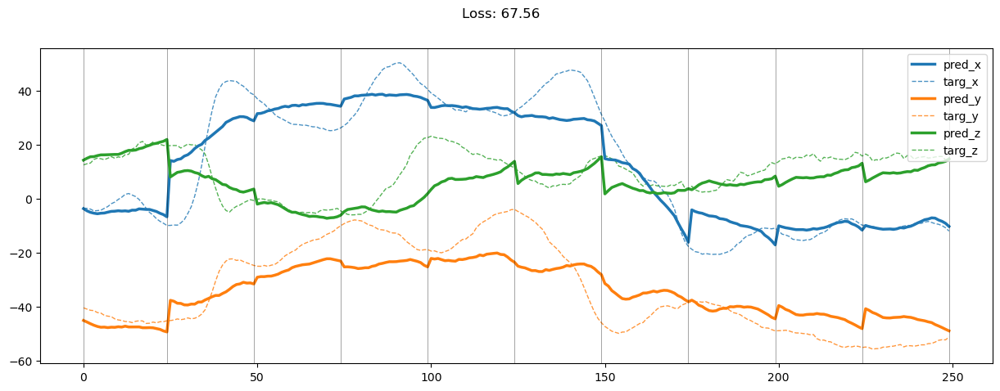

01549: train total loss:  2.161, pred loss:  1.081, valid total loss:  172.872, pred loss:  86.436


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01550: train total loss:  2.147, pred loss:  1.074, valid total loss:  170.884, pred loss:  85.442


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


01551: train total loss:  2.119, pred loss:  1.059, valid total loss:  169.600, pred loss:  84.800


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01552: train total loss:  2.159, pred loss:  1.080, valid total loss:  170.284, pred loss:  85.142


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01553: train total loss:  2.140, pred loss:  1.070, valid total loss:  166.812, pred loss:  83.406


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01554: train total loss:  2.227, pred loss:  1.114, valid total loss:  167.444, pred loss:  83.722


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01555: train total loss:  2.319, pred loss:  1.160, valid total loss:  168.064, pred loss:  84.032


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01556: train total loss:  2.284, pred loss:  1.142, valid total loss:  170.098, pred loss:  85.049


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01557: train total loss:  2.191, pred loss:  1.095, valid total loss:  172.454, pred loss:  86.227


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01558: train total loss:  2.333, pred loss:  1.166, valid total loss:  173.010, pred loss:  86.505


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01559: train total loss:  2.391, pred loss:  1.195, valid total loss:  166.341, pred loss:  83.171


100%|██████████| 6/6 [00:00<00:00, 18.97it/s]


01560: train total loss:  2.238, pred loss:  1.119, valid total loss:  166.757, pred loss:  83.378


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01561: train total loss:  2.188, pred loss:  1.094, valid total loss:  169.316, pred loss:  84.658


100%|██████████| 6/6 [00:00<00:00, 20.26it/s]


01562: train total loss:  2.207, pred loss:  1.104, valid total loss:  170.958, pred loss:  85.479


100%|██████████| 6/6 [00:00<00:00, 19.50it/s]


01563: train total loss:  2.222, pred loss:  1.111, valid total loss:  170.048, pred loss:  85.024


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01564: train total loss:  2.093, pred loss:  1.047, valid total loss:  170.686, pred loss:  85.343


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01565: train total loss:  2.121, pred loss:  1.060, valid total loss:  170.222, pred loss:  85.111


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01566: train total loss:  2.088, pred loss:  1.044, valid total loss:  171.829, pred loss:  85.915


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01567: train total loss:  2.115, pred loss:  1.057, valid total loss:  165.527, pred loss:  82.764


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01568: train total loss:  2.141, pred loss:  1.071, valid total loss:  166.191, pred loss:  83.095


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01569: train total loss:  2.148, pred loss:  1.074, valid total loss:  169.594, pred loss:  84.797


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01570: train total loss:  2.145, pred loss:  1.073, valid total loss:  170.363, pred loss:  85.181


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01571: train total loss:  2.203, pred loss:  1.102, valid total loss:  167.285, pred loss:  83.642


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01572: train total loss:  2.132, pred loss:  1.066, valid total loss:  171.563, pred loss:  85.782


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01573: train total loss:  2.213, pred loss:  1.106, valid total loss:  167.750, pred loss:  83.875


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01574: train total loss:  2.216, pred loss:  1.108, valid total loss:  168.966, pred loss:  84.483


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01575: train total loss:  2.271, pred loss:  1.136, valid total loss:  172.096, pred loss:  86.048


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01576: train total loss:  2.247, pred loss:  1.124, valid total loss:  165.316, pred loss:  82.658


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01577: train total loss:  2.213, pred loss:  1.107, valid total loss:  169.341, pred loss:  84.671


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01578: train total loss:  2.244, pred loss:  1.122, valid total loss:  168.811, pred loss:  84.406


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01579: train total loss:  2.243, pred loss:  1.122, valid total loss:  165.524, pred loss:  82.762


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01580: train total loss:  2.215, pred loss:  1.108, valid total loss:  172.156, pred loss:  86.078


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01581: train total loss:  2.138, pred loss:  1.069, valid total loss:  169.264, pred loss:  84.632


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01582: train total loss:  2.093, pred loss:  1.046, valid total loss:  167.669, pred loss:  83.834


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01583: train total loss:  2.163, pred loss:  1.082, valid total loss:  172.207, pred loss:  86.103


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


01584: train total loss:  2.115, pred loss:  1.057, valid total loss:  172.745, pred loss:  86.373


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


01585: train total loss:  2.214, pred loss:  1.107, valid total loss:  169.867, pred loss:  84.933


100%|██████████| 6/6 [00:00<00:00, 20.19it/s]


01586: train total loss:  2.187, pred loss:  1.094, valid total loss:  174.288, pred loss:  87.144


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01587: train total loss:  2.116, pred loss:  1.058, valid total loss:  171.573, pred loss:  85.787


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01588: train total loss:  2.121, pred loss:  1.061, valid total loss:  171.575, pred loss:  85.788


100%|██████████| 6/6 [00:00<00:00, 18.16it/s]


01589: train total loss:  2.173, pred loss:  1.086, valid total loss:  174.493, pred loss:  87.246


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01590: train total loss:  2.144, pred loss:  1.072, valid total loss:  172.290, pred loss:  86.145


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01591: train total loss:  2.101, pred loss:  1.050, valid total loss:  172.258, pred loss:  86.129


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01592: train total loss:  2.062, pred loss:  1.031, valid total loss:  169.380, pred loss:  84.690


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01593: train total loss:  2.085, pred loss:  1.043, valid total loss:  166.723, pred loss:  83.362


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01594: train total loss:  2.106, pred loss:  1.053, valid total loss:  170.957, pred loss:  85.478


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01595: train total loss:  2.105, pred loss:  1.053, valid total loss:  170.775, pred loss:  85.388


100%|██████████| 6/6 [00:00<00:00, 18.71it/s]


01596: train total loss:  2.082, pred loss:  1.041, valid total loss:  172.228, pred loss:  86.114


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01597: train total loss:  2.157, pred loss:  1.078, valid total loss:  170.937, pred loss:  85.469


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01598: train total loss:  2.196, pred loss:  1.098, valid total loss:  169.958, pred loss:  84.979


100%|██████████| 6/6 [00:00<00:00, 20.39it/s]


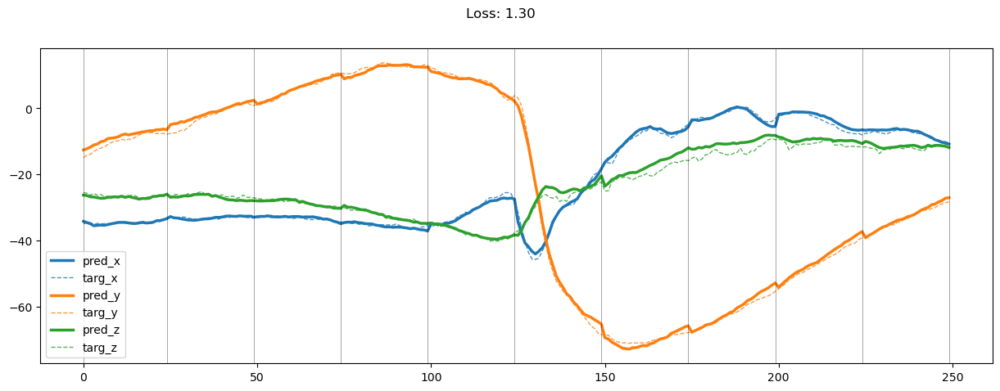

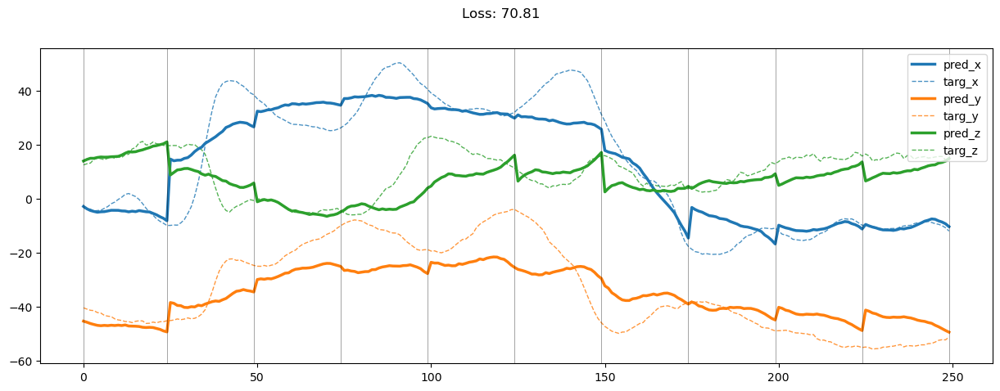

01599: train total loss:  2.127, pred loss:  1.064, valid total loss:  173.934, pred loss:  86.967


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01600: train total loss:  2.074, pred loss:  1.037, valid total loss:  173.563, pred loss:  86.781


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01601: train total loss:  2.125, pred loss:  1.062, valid total loss:  171.043, pred loss:  85.522


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01602: train total loss:  2.120, pred loss:  1.060, valid total loss:  171.660, pred loss:  85.830


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01603: train total loss:  2.096, pred loss:  1.048, valid total loss:  171.243, pred loss:  85.622


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01604: train total loss:  2.213, pred loss:  1.106, valid total loss:  174.233, pred loss:  87.117


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01605: train total loss:  2.206, pred loss:  1.103, valid total loss:  169.644, pred loss:  84.822


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01606: train total loss:  2.153, pred loss:  1.076, valid total loss:  169.651, pred loss:  84.826


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01607: train total loss:  2.146, pred loss:  1.073, valid total loss:  170.891, pred loss:  85.445


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01608: train total loss:  2.084, pred loss:  1.042, valid total loss:  169.202, pred loss:  84.601


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01609: train total loss:  2.225, pred loss:  1.112, valid total loss:  170.723, pred loss:  85.361


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01610: train total loss:  2.139, pred loss:  1.069, valid total loss:  177.080, pred loss:  88.540


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01611: train total loss:  2.094, pred loss:  1.047, valid total loss:  174.026, pred loss:  87.013


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01612: train total loss:  2.173, pred loss:  1.087, valid total loss:  175.500, pred loss:  87.750


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01613: train total loss:  2.245, pred loss:  1.123, valid total loss:  174.023, pred loss:  87.011


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01614: train total loss:  2.277, pred loss:  1.138, valid total loss:  175.842, pred loss:  87.921


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01615: train total loss:  2.165, pred loss:  1.082, valid total loss:  169.218, pred loss:  84.609


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01616: train total loss:  2.022, pred loss:  1.011, valid total loss:  169.103, pred loss:  84.552


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01617: train total loss:  2.015, pred loss:  1.008, valid total loss:  172.106, pred loss:  86.053


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01618: train total loss:  2.026, pred loss:  1.013, valid total loss:  166.146, pred loss:  83.073


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01619: train total loss:  2.049, pred loss:  1.024, valid total loss:  172.134, pred loss:  86.067


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01620: train total loss:  1.990, pred loss:  0.995, valid total loss:  173.238, pred loss:  86.619


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01621: train total loss:  2.040, pred loss:  1.020, valid total loss:  174.689, pred loss:  87.344


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01622: train total loss:  1.993, pred loss:  0.997, valid total loss:  168.344, pred loss:  84.172


100%|██████████| 6/6 [00:00<00:00, 19.20it/s]


01623: train total loss:  2.060, pred loss:  1.030, valid total loss:  172.946, pred loss:  86.473


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01624: train total loss:  2.032, pred loss:  1.016, valid total loss:  174.937, pred loss:  87.469


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01625: train total loss:  2.013, pred loss:  1.006, valid total loss:  173.933, pred loss:  86.967


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01626: train total loss:  2.083, pred loss:  1.042, valid total loss:  171.658, pred loss:  85.829


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01627: train total loss:  1.984, pred loss:  0.992, valid total loss:  175.153, pred loss:  87.576


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01628: train total loss:  1.961, pred loss:  0.981, valid total loss:  173.587, pred loss:  86.794


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01629: train total loss:  2.069, pred loss:  1.034, valid total loss:  173.519, pred loss:  86.759


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01630: train total loss:  2.082, pred loss:  1.041, valid total loss:  167.598, pred loss:  83.799


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01631: train total loss:  2.086, pred loss:  1.043, valid total loss:  165.392, pred loss:  82.696


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01632: train total loss:  2.169, pred loss:  1.085, valid total loss:  172.847, pred loss:  86.423


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01633: train total loss:  2.115, pred loss:  1.058, valid total loss:  171.761, pred loss:  85.880


100%|██████████| 6/6 [00:00<00:00, 20.24it/s]


01634: train total loss:  2.104, pred loss:  1.052, valid total loss:  167.123, pred loss:  83.562


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01635: train total loss:  2.206, pred loss:  1.103, valid total loss:  168.971, pred loss:  84.486


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01636: train total loss:  1.987, pred loss:  0.994, valid total loss:  171.951, pred loss:  85.975


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01637: train total loss:  2.062, pred loss:  1.031, valid total loss:  170.248, pred loss:  85.124


100%|██████████| 6/6 [00:00<00:00, 19.69it/s]


01638: train total loss:  2.076, pred loss:  1.038, valid total loss:  173.023, pred loss:  86.511


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01639: train total loss:  2.142, pred loss:  1.071, valid total loss:  169.245, pred loss:  84.623


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01640: train total loss:  2.030, pred loss:  1.015, valid total loss:  172.189, pred loss:  86.094


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01641: train total loss:  1.978, pred loss:  0.989, valid total loss:  175.182, pred loss:  87.591


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01642: train total loss:  1.974, pred loss:  0.987, valid total loss:  173.523, pred loss:  86.762


100%|██████████| 6/6 [00:00<00:00, 18.46it/s]


01643: train total loss:  2.046, pred loss:  1.023, valid total loss:  164.461, pred loss:  82.230


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01644: train total loss:  2.061, pred loss:  1.030, valid total loss:  167.834, pred loss:  83.917


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01645: train total loss:  2.040, pred loss:  1.020, valid total loss:  169.171, pred loss:  84.586


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01646: train total loss:  2.084, pred loss:  1.042, valid total loss:  169.283, pred loss:  84.641


100%|██████████| 6/6 [00:00<00:00, 19.67it/s]


01647: train total loss:  2.067, pred loss:  1.033, valid total loss:  169.271, pred loss:  84.636


100%|██████████| 6/6 [00:00<00:00, 18.42it/s]


01648: train total loss:  2.154, pred loss:  1.077, valid total loss:  171.350, pred loss:  85.675


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


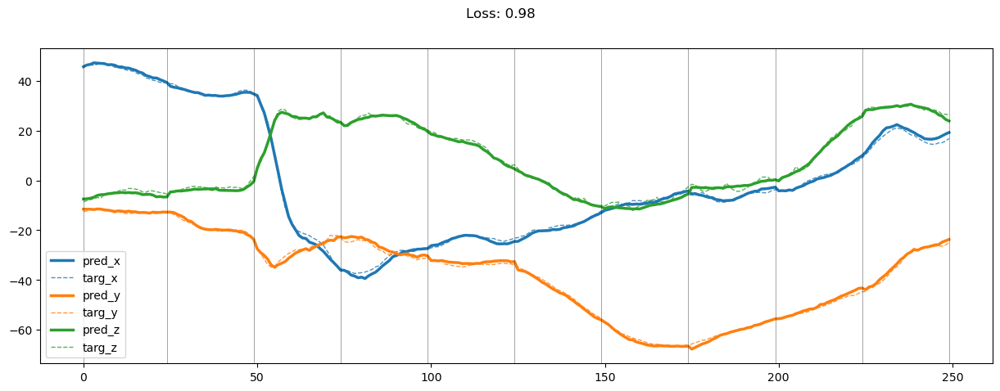

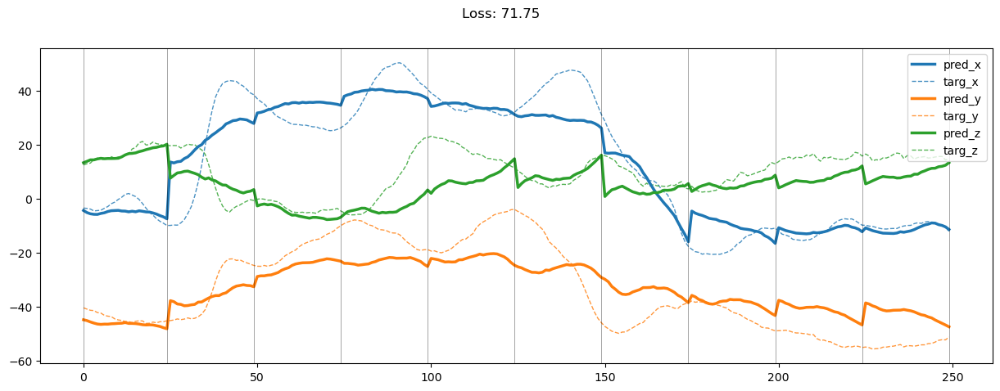

01649: train total loss:  2.223, pred loss:  1.112, valid total loss:  173.000, pred loss:  86.500


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01650: train total loss:  2.161, pred loss:  1.080, valid total loss:  170.744, pred loss:  85.372


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01651: train total loss:  2.448, pred loss:  1.224, valid total loss:  173.171, pred loss:  86.585


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01652: train total loss:  2.270, pred loss:  1.135, valid total loss:  179.513, pred loss:  89.757


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01653: train total loss:  2.334, pred loss:  1.167, valid total loss:  174.202, pred loss:  87.101


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01654: train total loss:  2.289, pred loss:  1.145, valid total loss:  180.467, pred loss:  90.233


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01655: train total loss:  2.221, pred loss:  1.110, valid total loss:  189.377, pred loss:  94.689


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01656: train total loss:  2.206, pred loss:  1.103, valid total loss:  184.357, pred loss:  92.179


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01657: train total loss:  2.315, pred loss:  1.157, valid total loss:  180.373, pred loss:  90.186


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01658: train total loss:  2.222, pred loss:  1.111, valid total loss:  179.412, pred loss:  89.706


100%|██████████| 6/6 [00:00<00:00, 20.23it/s]


01659: train total loss:  2.113, pred loss:  1.057, valid total loss:  178.931, pred loss:  89.465


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01660: train total loss:  2.123, pred loss:  1.062, valid total loss:  184.789, pred loss:  92.394


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01661: train total loss:  2.121, pred loss:  1.061, valid total loss:  180.372, pred loss:  90.186


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01662: train total loss:  2.086, pred loss:  1.043, valid total loss:  176.616, pred loss:  88.308


100%|██████████| 6/6 [00:00<00:00, 19.87it/s]


01663: train total loss:  2.022, pred loss:  1.011, valid total loss:  182.955, pred loss:  91.477


100%|██████████| 6/6 [00:00<00:00, 19.76it/s]


01664: train total loss:  1.979, pred loss:  0.989, valid total loss:  180.458, pred loss:  90.229


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01665: train total loss:  2.030, pred loss:  1.015, valid total loss:  172.816, pred loss:  86.408


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01666: train total loss:  1.946, pred loss:  0.973, valid total loss:  174.439, pred loss:  87.219


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01667: train total loss:  2.027, pred loss:  1.014, valid total loss:  170.211, pred loss:  85.105


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01668: train total loss:  2.013, pred loss:  1.007, valid total loss:  176.562, pred loss:  88.281


100%|██████████| 6/6 [00:00<00:00, 19.13it/s]


01669: train total loss:  2.016, pred loss:  1.008, valid total loss:  179.242, pred loss:  89.621


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01670: train total loss:  2.018, pred loss:  1.009, valid total loss:  173.976, pred loss:  86.988


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01671: train total loss:  2.052, pred loss:  1.026, valid total loss:  173.559, pred loss:  86.780


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01672: train total loss:  2.047, pred loss:  1.024, valid total loss:  171.493, pred loss:  85.746


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01673: train total loss:  2.110, pred loss:  1.055, valid total loss:  170.757, pred loss:  85.378


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01674: train total loss:  2.032, pred loss:  1.016, valid total loss:  175.142, pred loss:  87.571


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01675: train total loss:  1.983, pred loss:  0.991, valid total loss:  178.476, pred loss:  89.238


100%|██████████| 6/6 [00:00<00:00, 19.61it/s]


01676: train total loss:  1.989, pred loss:  0.994, valid total loss:  184.753, pred loss:  92.376


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01677: train total loss:  2.110, pred loss:  1.055, valid total loss:  173.881, pred loss:  86.940


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01678: train total loss:  1.996, pred loss:  0.998, valid total loss:  177.016, pred loss:  88.508


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01679: train total loss:  1.963, pred loss:  0.981, valid total loss:  181.804, pred loss:  90.902


100%|██████████| 6/6 [00:00<00:00, 17.94it/s]


01680: train total loss:  1.951, pred loss:  0.975, valid total loss:  179.010, pred loss:  89.505


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01681: train total loss:  1.971, pred loss:  0.985, valid total loss:  178.751, pred loss:  89.376


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01682: train total loss:  1.909, pred loss:  0.954, valid total loss:  178.186, pred loss:  89.093


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01683: train total loss:  1.922, pred loss:  0.961, valid total loss:  174.999, pred loss:  87.499


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01684: train total loss:  1.934, pred loss:  0.967, valid total loss:  174.228, pred loss:  87.114


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01685: train total loss:  2.013, pred loss:  1.007, valid total loss:  169.850, pred loss:  84.925


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01686: train total loss:  2.035, pred loss:  1.017, valid total loss:  174.242, pred loss:  87.121


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01687: train total loss:  2.032, pred loss:  1.016, valid total loss:  173.849, pred loss:  86.925


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01688: train total loss:  2.118, pred loss:  1.059, valid total loss:  179.619, pred loss:  89.809


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01689: train total loss:  2.144, pred loss:  1.072, valid total loss:  175.407, pred loss:  87.703


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01690: train total loss:  2.163, pred loss:  1.081, valid total loss:  170.316, pred loss:  85.158


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01691: train total loss:  2.080, pred loss:  1.040, valid total loss:  171.025, pred loss:  85.512


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01692: train total loss:  2.152, pred loss:  1.076, valid total loss:  160.968, pred loss:  80.484


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01693: train total loss:  2.242, pred loss:  1.121, valid total loss:  169.804, pred loss:  84.902


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01694: train total loss:  2.238, pred loss:  1.119, valid total loss:  172.275, pred loss:  86.137


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01695: train total loss:  2.208, pred loss:  1.104, valid total loss:  173.171, pred loss:  86.586


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01696: train total loss:  2.370, pred loss:  1.185, valid total loss:  170.489, pred loss:  85.245


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01697: train total loss:  2.355, pred loss:  1.177, valid total loss:  164.999, pred loss:  82.500


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01698: train total loss:  2.168, pred loss:  1.084, valid total loss:  173.980, pred loss:  86.990


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


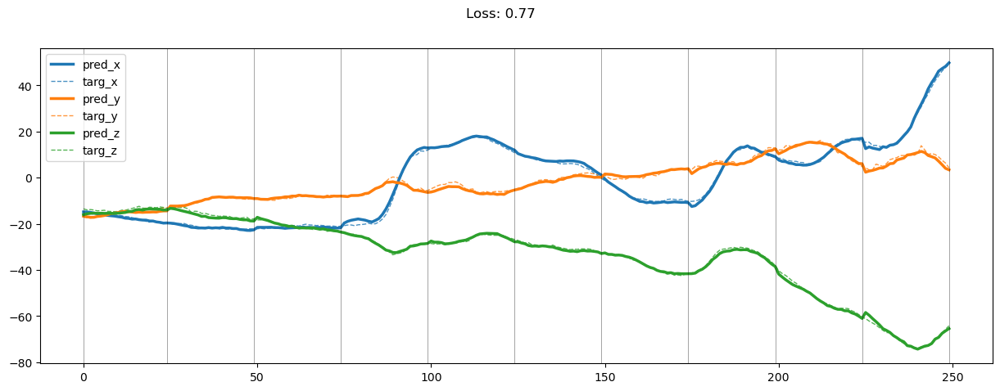

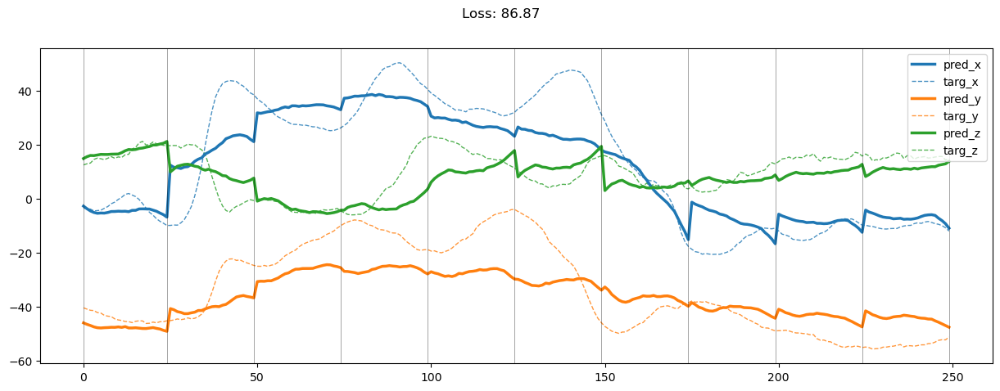

01699: train total loss:  2.157, pred loss:  1.078, valid total loss:  172.398, pred loss:  86.199


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01700: train total loss:  2.082, pred loss:  1.041, valid total loss:  169.990, pred loss:  84.995


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01701: train total loss:  2.041, pred loss:  1.021, valid total loss:  173.712, pred loss:  86.856


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01702: train total loss:  2.002, pred loss:  1.001, valid total loss:  175.580, pred loss:  87.790


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01703: train total loss:  1.991, pred loss:  0.996, valid total loss:  176.668, pred loss:  88.334


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01704: train total loss:  1.983, pred loss:  0.991, valid total loss:  177.510, pred loss:  88.755


100%|██████████| 6/6 [00:00<00:00, 17.87it/s]


01705: train total loss:  1.916, pred loss:  0.958, valid total loss:  171.767, pred loss:  85.884


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


01706: train total loss:  1.947, pred loss:  0.973, valid total loss:  171.286, pred loss:  85.643


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01707: train total loss:  1.941, pred loss:  0.971, valid total loss:  179.020, pred loss:  89.510


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01708: train total loss:  1.966, pred loss:  0.983, valid total loss:  181.381, pred loss:  90.690


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01709: train total loss:  1.888, pred loss:  0.944, valid total loss:  178.607, pred loss:  89.304


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01710: train total loss:  1.914, pred loss:  0.957, valid total loss:  176.441, pred loss:  88.221


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01711: train total loss:  1.897, pred loss:  0.948, valid total loss:  177.586, pred loss:  88.793


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01712: train total loss:  1.913, pred loss:  0.957, valid total loss:  170.605, pred loss:  85.302


100%|██████████| 6/6 [00:00<00:00, 19.66it/s]


01713: train total loss:  1.856, pred loss:  0.928, valid total loss:  173.158, pred loss:  86.579


100%|██████████| 6/6 [00:00<00:00, 20.34it/s]


01714: train total loss:  1.893, pred loss:  0.947, valid total loss:  175.323, pred loss:  87.662


100%|██████████| 6/6 [00:00<00:00, 18.80it/s]


01715: train total loss:  1.822, pred loss:  0.911, valid total loss:  176.912, pred loss:  88.456


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01716: train total loss:  1.885, pred loss:  0.943, valid total loss:  177.312, pred loss:  88.656


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01717: train total loss:  1.871, pred loss:  0.936, valid total loss:  178.082, pred loss:  89.041


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01718: train total loss:  1.906, pred loss:  0.953, valid total loss:  175.339, pred loss:  87.670


100%|██████████| 6/6 [00:00<00:00, 19.02it/s]


01719: train total loss:  1.889, pred loss:  0.945, valid total loss:  175.333, pred loss:  87.667


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01720: train total loss:  1.922, pred loss:  0.961, valid total loss:  176.685, pred loss:  88.342


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01721: train total loss:  1.934, pred loss:  0.967, valid total loss:  175.262, pred loss:  87.631


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01722: train total loss:  1.882, pred loss:  0.941, valid total loss:  178.921, pred loss:  89.460


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01723: train total loss:  1.895, pred loss:  0.948, valid total loss:  176.593, pred loss:  88.296


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01724: train total loss:  1.862, pred loss:  0.931, valid total loss:  174.645, pred loss:  87.322


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01725: train total loss:  1.912, pred loss:  0.956, valid total loss:  173.612, pred loss:  86.806


100%|██████████| 6/6 [00:00<00:00, 20.08it/s]


01726: train total loss:  1.941, pred loss:  0.970, valid total loss:  174.097, pred loss:  87.048


100%|██████████| 6/6 [00:00<00:00, 20.09it/s]


01727: train total loss:  1.885, pred loss:  0.943, valid total loss:  174.068, pred loss:  87.034


100%|██████████| 6/6 [00:00<00:00, 20.06it/s]


01728: train total loss:  1.930, pred loss:  0.965, valid total loss:  179.058, pred loss:  89.529


100%|██████████| 6/6 [00:00<00:00, 20.21it/s]


01729: train total loss:  1.905, pred loss:  0.953, valid total loss:  177.934, pred loss:  88.967


100%|██████████| 6/6 [00:00<00:00, 19.65it/s]


01730: train total loss:  1.887, pred loss:  0.943, valid total loss:  172.688, pred loss:  86.344


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01731: train total loss:  1.874, pred loss:  0.937, valid total loss:  173.766, pred loss:  86.883


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01732: train total loss:  1.914, pred loss:  0.957, valid total loss:  173.920, pred loss:  86.960


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01733: train total loss:  1.893, pred loss:  0.947, valid total loss:  170.216, pred loss:  85.108


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01734: train total loss:  1.903, pred loss:  0.951, valid total loss:  176.855, pred loss:  88.427


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01735: train total loss:  1.901, pred loss:  0.950, valid total loss:  170.123, pred loss:  85.062


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01736: train total loss:  1.902, pred loss:  0.951, valid total loss:  170.767, pred loss:  85.383


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01737: train total loss:  2.004, pred loss:  1.002, valid total loss:  174.302, pred loss:  87.151


100%|██████████| 6/6 [00:00<00:00, 20.28it/s]


01738: train total loss:  1.937, pred loss:  0.969, valid total loss:  180.593, pred loss:  90.296


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01739: train total loss:  1.893, pred loss:  0.946, valid total loss:  179.164, pred loss:  89.582


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01740: train total loss:  1.959, pred loss:  0.979, valid total loss:  178.533, pred loss:  89.266


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01741: train total loss:  1.945, pred loss:  0.972, valid total loss:  174.906, pred loss:  87.453


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01742: train total loss:  1.952, pred loss:  0.976, valid total loss:  174.194, pred loss:  87.097


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01743: train total loss:  1.834, pred loss:  0.917, valid total loss:  168.934, pred loss:  84.467


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01744: train total loss:  1.811, pred loss:  0.906, valid total loss:  171.799, pred loss:  85.899


100%|██████████| 6/6 [00:00<00:00, 20.11it/s]


01745: train total loss:  1.785, pred loss:  0.893, valid total loss:  173.951, pred loss:  86.976


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01746: train total loss:  1.779, pred loss:  0.889, valid total loss:  173.462, pred loss:  86.731


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01747: train total loss:  1.868, pred loss:  0.934, valid total loss:  178.397, pred loss:  89.198


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01748: train total loss:  1.721, pred loss:  0.860, valid total loss:  178.882, pred loss:  89.441


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


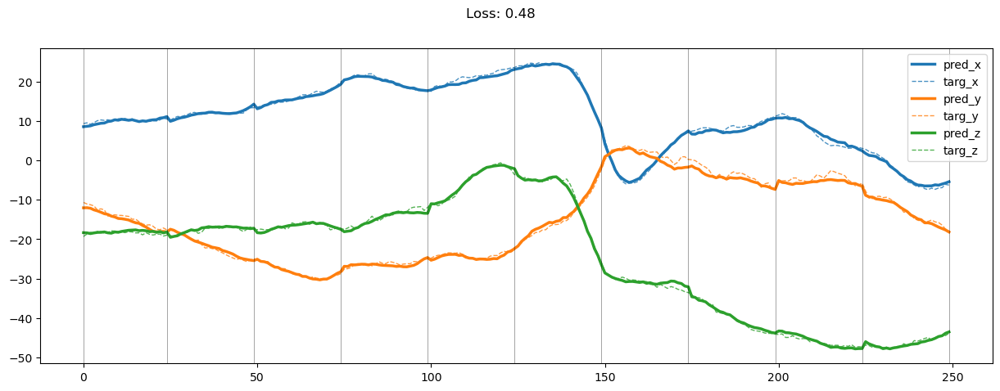

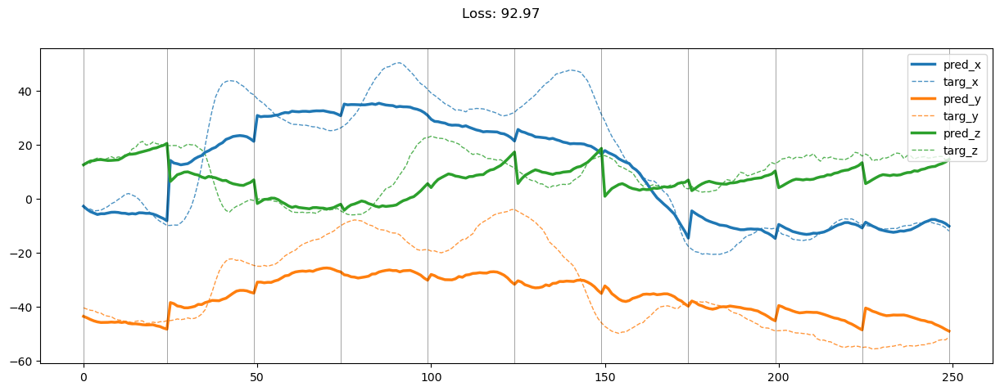

01749: train total loss:  1.810, pred loss:  0.905, valid total loss:  174.364, pred loss:  87.182


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01750: train total loss:  1.874, pred loss:  0.937, valid total loss:  179.681, pred loss:  89.840


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01751: train total loss:  1.865, pred loss:  0.933, valid total loss:  176.796, pred loss:  88.398


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01752: train total loss:  1.838, pred loss:  0.919, valid total loss:  176.346, pred loss:  88.173


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01753: train total loss:  1.818, pred loss:  0.909, valid total loss:  180.844, pred loss:  90.422


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01754: train total loss:  1.744, pred loss:  0.872, valid total loss:  173.168, pred loss:  86.584


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01755: train total loss:  1.840, pred loss:  0.920, valid total loss:  168.325, pred loss:  84.163


100%|██████████| 6/6 [00:00<00:00, 20.51it/s]


01756: train total loss:  1.818, pred loss:  0.909, valid total loss:  175.678, pred loss:  87.839


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01757: train total loss:  1.884, pred loss:  0.942, valid total loss:  166.923, pred loss:  83.461


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01758: train total loss:  1.973, pred loss:  0.986, valid total loss:  167.476, pred loss:  83.738


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01759: train total loss:  1.922, pred loss:  0.961, valid total loss:  175.193, pred loss:  87.596


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01760: train total loss:  1.939, pred loss:  0.969, valid total loss:  173.715, pred loss:  86.858


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


01761: train total loss:  1.851, pred loss:  0.926, valid total loss:  174.577, pred loss:  87.288


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01762: train total loss:  1.887, pred loss:  0.944, valid total loss:  172.992, pred loss:  86.496


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01763: train total loss:  1.956, pred loss:  0.978, valid total loss:  169.205, pred loss:  84.602


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01764: train total loss:  2.035, pred loss:  1.017, valid total loss:  172.895, pred loss:  86.447


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01765: train total loss:  1.996, pred loss:  0.998, valid total loss:  168.612, pred loss:  84.306


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01766: train total loss:  2.018, pred loss:  1.009, valid total loss:  170.474, pred loss:  85.237


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01767: train total loss:  2.025, pred loss:  1.012, valid total loss:  173.735, pred loss:  86.868


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01768: train total loss:  1.890, pred loss:  0.945, valid total loss:  172.945, pred loss:  86.473


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01769: train total loss:  1.858, pred loss:  0.929, valid total loss:  171.875, pred loss:  85.938


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01770: train total loss:  1.823, pred loss:  0.912, valid total loss:  171.138, pred loss:  85.569


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01771: train total loss:  1.884, pred loss:  0.942, valid total loss:  169.012, pred loss:  84.506


100%|██████████| 6/6 [00:00<00:00, 18.97it/s]


01772: train total loss:  2.083, pred loss:  1.042, valid total loss:  170.269, pred loss:  85.134


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01773: train total loss:  2.120, pred loss:  1.060, valid total loss:  173.053, pred loss:  86.527


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01774: train total loss:  2.034, pred loss:  1.017, valid total loss:  182.777, pred loss:  91.388


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01775: train total loss:  2.071, pred loss:  1.036, valid total loss:  175.634, pred loss:  87.817


100%|██████████| 6/6 [00:00<00:00, 20.38it/s]


01776: train total loss:  2.013, pred loss:  1.006, valid total loss:  171.811, pred loss:  85.905


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01777: train total loss:  1.909, pred loss:  0.954, valid total loss:  178.462, pred loss:  89.231


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01778: train total loss:  1.920, pred loss:  0.960, valid total loss:  173.671, pred loss:  86.836


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01779: train total loss:  1.902, pred loss:  0.951, valid total loss:  178.532, pred loss:  89.266


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01780: train total loss:  1.928, pred loss:  0.964, valid total loss:  180.495, pred loss:  90.247


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01781: train total loss:  1.930, pred loss:  0.965, valid total loss:  176.258, pred loss:  88.129


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01782: train total loss:  2.003, pred loss:  1.001, valid total loss:  169.703, pred loss:  84.852


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01783: train total loss:  2.038, pred loss:  1.019, valid total loss:  176.037, pred loss:  88.019


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01784: train total loss:  2.075, pred loss:  1.038, valid total loss:  179.503, pred loss:  89.752


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01785: train total loss:  2.037, pred loss:  1.018, valid total loss:  175.407, pred loss:  87.704


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01786: train total loss:  2.010, pred loss:  1.005, valid total loss:  166.200, pred loss:  83.100


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01787: train total loss:  1.947, pred loss:  0.973, valid total loss:  169.067, pred loss:  84.534


100%|██████████| 6/6 [00:00<00:00, 17.86it/s]


01788: train total loss:  1.958, pred loss:  0.979, valid total loss:  167.056, pred loss:  83.528


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01789: train total loss:  1.867, pred loss:  0.934, valid total loss:  167.333, pred loss:  83.667


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01790: train total loss:  1.916, pred loss:  0.958, valid total loss:  170.351, pred loss:  85.176


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01791: train total loss:  1.819, pred loss:  0.910, valid total loss:  168.865, pred loss:  84.432


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01792: train total loss:  1.891, pred loss:  0.945, valid total loss:  167.584, pred loss:  83.792


100%|██████████| 6/6 [00:00<00:00, 20.04it/s]


01793: train total loss:  1.876, pred loss:  0.938, valid total loss:  170.800, pred loss:  85.400


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01794: train total loss:  1.818, pred loss:  0.909, valid total loss:  170.561, pred loss:  85.280


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01795: train total loss:  1.860, pred loss:  0.930, valid total loss:  177.722, pred loss:  88.861


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01796: train total loss:  1.828, pred loss:  0.914, valid total loss:  176.294, pred loss:  88.147


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01797: train total loss:  1.754, pred loss:  0.877, valid total loss:  178.438, pred loss:  89.219


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01798: train total loss:  1.856, pred loss:  0.928, valid total loss:  172.983, pred loss:  86.492


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


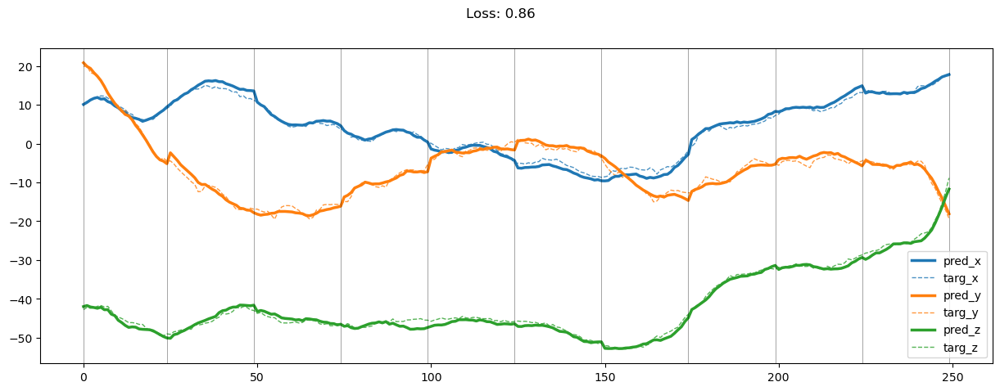

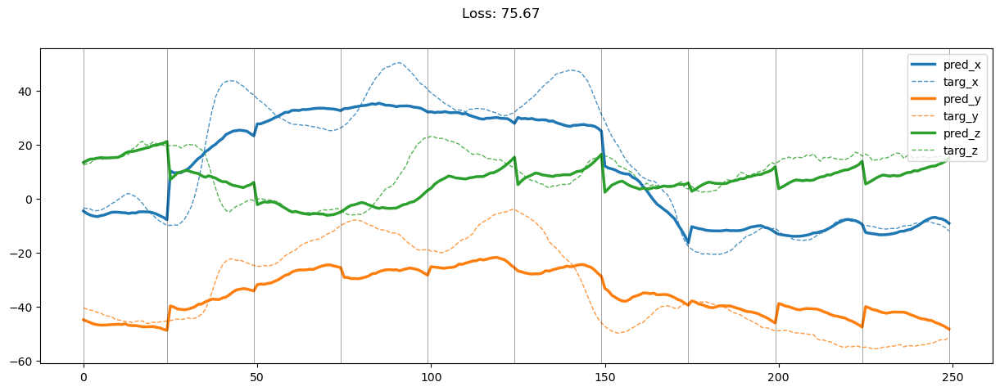

01799: train total loss:  1.791, pred loss:  0.895, valid total loss:  168.179, pred loss:  84.089


100%|██████████| 6/6 [00:00<00:00, 19.07it/s]


01800: train total loss:  1.778, pred loss:  0.889, valid total loss:  172.904, pred loss:  86.452


100%|██████████| 6/6 [00:00<00:00, 20.32it/s]


01801: train total loss:  1.838, pred loss:  0.919, valid total loss:  171.342, pred loss:  85.671


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01802: train total loss:  1.745, pred loss:  0.872, valid total loss:  175.765, pred loss:  87.882


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01803: train total loss:  1.799, pred loss:  0.900, valid total loss:  179.048, pred loss:  89.524


100%|██████████| 6/6 [00:00<00:00, 20.37it/s]


01804: train total loss:  1.812, pred loss:  0.906, valid total loss:  176.528, pred loss:  88.264


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01805: train total loss:  1.791, pred loss:  0.896, valid total loss:  176.748, pred loss:  88.374


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01806: train total loss:  1.783, pred loss:  0.892, valid total loss:  180.416, pred loss:  90.208


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01807: train total loss:  1.757, pred loss:  0.879, valid total loss:  177.571, pred loss:  88.785


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01808: train total loss:  1.745, pred loss:  0.873, valid total loss:  174.357, pred loss:  87.178


100%|██████████| 6/6 [00:00<00:00, 18.29it/s]


01809: train total loss:  1.741, pred loss:  0.871, valid total loss:  171.395, pred loss:  85.698


100%|██████████| 6/6 [00:00<00:00, 19.98it/s]


01810: train total loss:  1.792, pred loss:  0.896, valid total loss:  166.583, pred loss:  83.291


100%|██████████| 6/6 [00:00<00:00, 19.56it/s]


01811: train total loss:  1.772, pred loss:  0.886, valid total loss:  170.381, pred loss:  85.190


100%|██████████| 6/6 [00:00<00:00, 17.66it/s]


01812: train total loss:  1.691, pred loss:  0.845, valid total loss:  169.910, pred loss:  84.955


100%|██████████| 6/6 [00:00<00:00, 17.84it/s]


01813: train total loss:  1.731, pred loss:  0.865, valid total loss:  175.051, pred loss:  87.525


100%|██████████| 6/6 [00:00<00:00, 17.87it/s]


01814: train total loss:  1.782, pred loss:  0.891, valid total loss:  166.319, pred loss:  83.159


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01815: train total loss:  1.665, pred loss:  0.832, valid total loss:  166.252, pred loss:  83.126


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01816: train total loss:  1.668, pred loss:  0.834, valid total loss:  170.370, pred loss:  85.185


100%|██████████| 6/6 [00:00<00:00, 19.97it/s]


01817: train total loss:  1.713, pred loss:  0.856, valid total loss:  176.956, pred loss:  88.478


100%|██████████| 6/6 [00:00<00:00, 18.02it/s]


01818: train total loss:  1.738, pred loss:  0.869, valid total loss:  166.671, pred loss:  83.336


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01819: train total loss:  1.819, pred loss:  0.910, valid total loss:  165.791, pred loss:  82.896


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01820: train total loss:  1.805, pred loss:  0.903, valid total loss:  166.805, pred loss:  83.403


100%|██████████| 6/6 [00:00<00:00, 19.73it/s]


01821: train total loss:  1.803, pred loss:  0.902, valid total loss:  163.412, pred loss:  81.706


100%|██████████| 6/6 [00:00<00:00, 17.87it/s]


01822: train total loss:  1.820, pred loss:  0.910, valid total loss:  166.155, pred loss:  83.078


100%|██████████| 6/6 [00:00<00:00, 17.93it/s]


01823: train total loss:  1.767, pred loss:  0.883, valid total loss:  167.046, pred loss:  83.523


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01824: train total loss:  1.736, pred loss:  0.868, valid total loss:  165.347, pred loss:  82.673


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01825: train total loss:  1.721, pred loss:  0.860, valid total loss:  165.980, pred loss:  82.990


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01826: train total loss:  1.749, pred loss:  0.875, valid total loss:  165.305, pred loss:  82.653


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01827: train total loss:  1.770, pred loss:  0.885, valid total loss:  166.916, pred loss:  83.458


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01828: train total loss:  1.726, pred loss:  0.863, valid total loss:  170.698, pred loss:  85.349


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01829: train total loss:  1.687, pred loss:  0.843, valid total loss:  170.075, pred loss:  85.038


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01830: train total loss:  1.760, pred loss:  0.880, valid total loss:  167.470, pred loss:  83.735


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01831: train total loss:  1.803, pred loss:  0.902, valid total loss:  171.684, pred loss:  85.842


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01832: train total loss:  1.818, pred loss:  0.909, valid total loss:  169.485, pred loss:  84.743


100%|██████████| 6/6 [00:00<00:00, 20.82it/s]


01833: train total loss:  1.765, pred loss:  0.882, valid total loss:  165.708, pred loss:  82.854


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01834: train total loss:  1.780, pred loss:  0.890, valid total loss:  170.227, pred loss:  85.114


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01835: train total loss:  1.771, pred loss:  0.886, valid total loss:  174.468, pred loss:  87.234


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01836: train total loss:  1.765, pred loss:  0.882, valid total loss:  171.380, pred loss:  85.690


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01837: train total loss:  1.735, pred loss:  0.867, valid total loss:  168.186, pred loss:  84.093


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01838: train total loss:  1.719, pred loss:  0.859, valid total loss:  171.006, pred loss:  85.503


100%|██████████| 6/6 [00:00<00:00, 20.80it/s]


01839: train total loss:  1.824, pred loss:  0.912, valid total loss:  163.729, pred loss:  81.865


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01840: train total loss:  1.790, pred loss:  0.895, valid total loss:  165.700, pred loss:  82.850


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01841: train total loss:  1.749, pred loss:  0.874, valid total loss:  168.204, pred loss:  84.102


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01842: train total loss:  1.752, pred loss:  0.876, valid total loss:  170.434, pred loss:  85.217


100%|██████████| 6/6 [00:00<00:00, 20.78it/s]


01843: train total loss:  1.648, pred loss:  0.824, valid total loss:  170.126, pred loss:  85.063


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01844: train total loss:  1.742, pred loss:  0.871, valid total loss:  171.878, pred loss:  85.939


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01845: train total loss:  1.700, pred loss:  0.850, valid total loss:  170.705, pred loss:  85.352


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01846: train total loss:  1.811, pred loss:  0.906, valid total loss:  173.630, pred loss:  86.815


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01847: train total loss:  1.810, pred loss:  0.905, valid total loss:  170.168, pred loss:  85.084


100%|██████████| 6/6 [00:00<00:00, 19.96it/s]


01848: train total loss:  1.811, pred loss:  0.905, valid total loss:  170.441, pred loss:  85.221


100%|██████████| 6/6 [00:00<00:00, 19.93it/s]


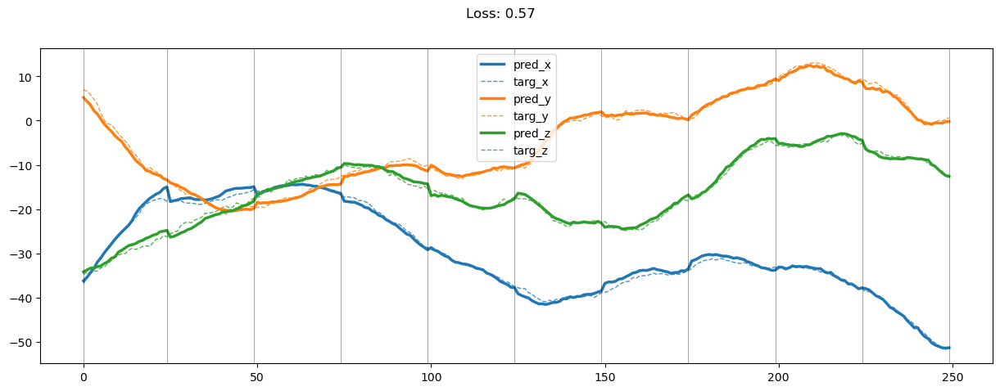

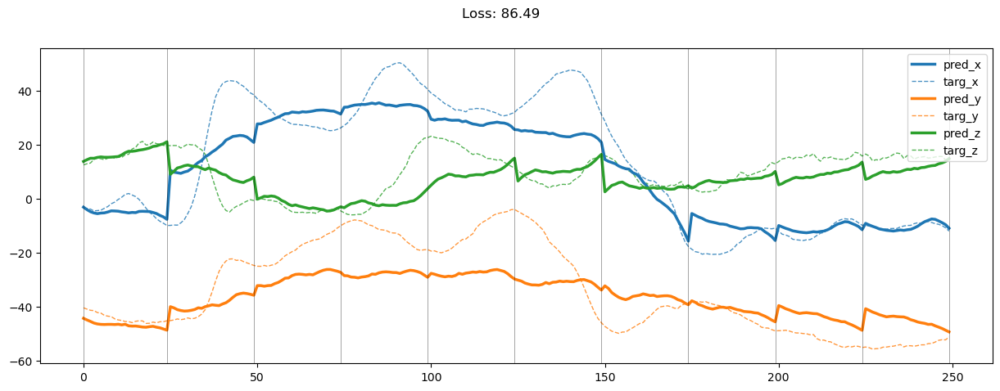

01849: train total loss:  1.723, pred loss:  0.861, valid total loss:  168.202, pred loss:  84.101


100%|██████████| 6/6 [00:00<00:00, 17.51it/s]


01850: train total loss:  1.748, pred loss:  0.874, valid total loss:  167.216, pred loss:  83.608


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01851: train total loss:  1.720, pred loss:  0.860, valid total loss:  168.423, pred loss:  84.211


100%|██████████| 6/6 [00:00<00:00, 19.36it/s]


01852: train total loss:  1.719, pred loss:  0.859, valid total loss:  169.557, pred loss:  84.779


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01853: train total loss:  1.746, pred loss:  0.873, valid total loss:  168.512, pred loss:  84.256


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01854: train total loss:  1.744, pred loss:  0.872, valid total loss:  166.437, pred loss:  83.219


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01855: train total loss:  1.825, pred loss:  0.912, valid total loss:  164.117, pred loss:  82.059


100%|██████████| 6/6 [00:00<00:00, 20.20it/s]


01856: train total loss:  1.826, pred loss:  0.913, valid total loss:  165.098, pred loss:  82.549


100%|██████████| 6/6 [00:00<00:00, 20.05it/s]


01857: train total loss:  1.777, pred loss:  0.888, valid total loss:  169.539, pred loss:  84.770


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01858: train total loss:  1.813, pred loss:  0.907, valid total loss:  169.289, pred loss:  84.645


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01859: train total loss:  1.765, pred loss:  0.882, valid total loss:  168.001, pred loss:  84.000


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01860: train total loss:  1.761, pred loss:  0.881, valid total loss:  165.927, pred loss:  82.963


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01861: train total loss:  1.706, pred loss:  0.853, valid total loss:  171.096, pred loss:  85.548


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01862: train total loss:  1.763, pred loss:  0.882, valid total loss:  171.267, pred loss:  85.634


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01863: train total loss:  1.749, pred loss:  0.875, valid total loss:  168.085, pred loss:  84.043


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01864: train total loss:  1.757, pred loss:  0.878, valid total loss:  166.338, pred loss:  83.169


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01865: train total loss:  1.706, pred loss:  0.853, valid total loss:  166.345, pred loss:  83.173


100%|██████████| 6/6 [00:00<00:00, 18.04it/s]


01866: train total loss:  1.799, pred loss:  0.899, valid total loss:  171.054, pred loss:  85.527


100%|██████████| 6/6 [00:00<00:00, 18.29it/s]


01867: train total loss:  1.777, pred loss:  0.888, valid total loss:  173.252, pred loss:  86.626


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01868: train total loss:  1.861, pred loss:  0.930, valid total loss:  175.194, pred loss:  87.597


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01869: train total loss:  1.741, pred loss:  0.870, valid total loss:  168.977, pred loss:  84.489


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01870: train total loss:  1.764, pred loss:  0.882, valid total loss:  171.756, pred loss:  85.878


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01871: train total loss:  1.790, pred loss:  0.895, valid total loss:  174.956, pred loss:  87.478


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01872: train total loss:  1.915, pred loss:  0.957, valid total loss:  181.423, pred loss:  90.712


100%|██████████| 6/6 [00:00<00:00, 20.16it/s]


01873: train total loss:  1.963, pred loss:  0.981, valid total loss:  186.738, pred loss:  93.369


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01874: train total loss:  1.984, pred loss:  0.992, valid total loss:  172.000, pred loss:  86.000


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01875: train total loss:  2.016, pred loss:  1.008, valid total loss:  177.128, pred loss:  88.564


100%|██████████| 6/6 [00:00<00:00, 18.21it/s]


01876: train total loss:  1.943, pred loss:  0.971, valid total loss:  178.639, pred loss:  89.320


100%|██████████| 6/6 [00:00<00:00, 17.68it/s]


01877: train total loss:  1.908, pred loss:  0.954, valid total loss:  173.222, pred loss:  86.611


100%|██████████| 6/6 [00:00<00:00, 19.55it/s]


01878: train total loss:  1.885, pred loss:  0.943, valid total loss:  174.658, pred loss:  87.329


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01879: train total loss:  1.870, pred loss:  0.935, valid total loss:  178.596, pred loss:  89.298


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01880: train total loss:  1.881, pred loss:  0.940, valid total loss:  180.887, pred loss:  90.444


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01881: train total loss:  1.819, pred loss:  0.909, valid total loss:  174.005, pred loss:  87.002


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01882: train total loss:  1.799, pred loss:  0.900, valid total loss:  173.136, pred loss:  86.568


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01883: train total loss:  1.778, pred loss:  0.889, valid total loss:  175.366, pred loss:  87.683


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01884: train total loss:  1.684, pred loss:  0.842, valid total loss:  171.618, pred loss:  85.809


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01885: train total loss:  1.712, pred loss:  0.856, valid total loss:  175.578, pred loss:  87.789


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01886: train total loss:  1.715, pred loss:  0.857, valid total loss:  177.870, pred loss:  88.935


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01887: train total loss:  1.754, pred loss:  0.877, valid total loss:  177.531, pred loss:  88.765


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01888: train total loss:  1.747, pred loss:  0.873, valid total loss:  167.567, pred loss:  83.784


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01889: train total loss:  1.770, pred loss:  0.885, valid total loss:  167.584, pred loss:  83.792


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01890: train total loss:  1.752, pred loss:  0.876, valid total loss:  170.913, pred loss:  85.456


100%|██████████| 6/6 [00:00<00:00, 19.52it/s]


01891: train total loss:  1.765, pred loss:  0.882, valid total loss:  174.085, pred loss:  87.042


100%|██████████| 6/6 [00:00<00:00, 19.07it/s]


01892: train total loss:  1.685, pred loss:  0.843, valid total loss:  173.142, pred loss:  86.571


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01893: train total loss:  1.680, pred loss:  0.840, valid total loss:  174.583, pred loss:  87.292


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01894: train total loss:  1.725, pred loss:  0.862, valid total loss:  170.317, pred loss:  85.158


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01895: train total loss:  1.696, pred loss:  0.848, valid total loss:  172.447, pred loss:  86.223


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01896: train total loss:  1.669, pred loss:  0.834, valid total loss:  169.508, pred loss:  84.754


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01897: train total loss:  1.662, pred loss:  0.831, valid total loss:  169.052, pred loss:  84.526


100%|██████████| 6/6 [00:00<00:00, 20.29it/s]


01898: train total loss:  1.698, pred loss:  0.849, valid total loss:  168.858, pred loss:  84.429


100%|██████████| 6/6 [00:00<00:00, 19.94it/s]


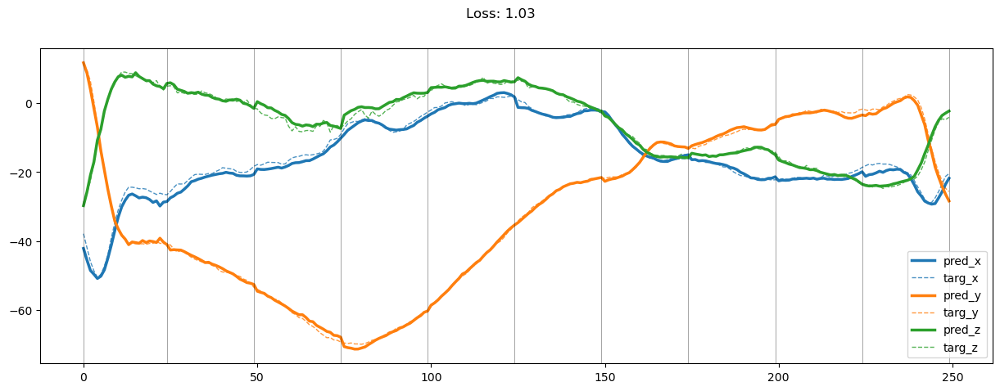

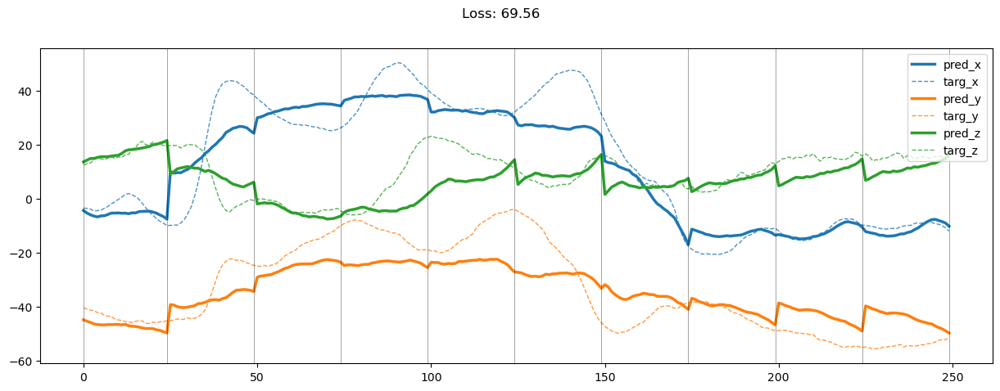

01899: train total loss:  1.647, pred loss:  0.823, valid total loss:  172.464, pred loss:  86.232


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01900: train total loss:  1.715, pred loss:  0.858, valid total loss:  171.069, pred loss:  85.534


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01901: train total loss:  1.678, pred loss:  0.839, valid total loss:  174.802, pred loss:  87.401


100%|██████████| 6/6 [00:00<00:00, 20.79it/s]


01902: train total loss:  1.633, pred loss:  0.816, valid total loss:  175.478, pred loss:  87.739


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01903: train total loss:  1.740, pred loss:  0.870, valid total loss:  175.858, pred loss:  87.929


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01904: train total loss:  1.701, pred loss:  0.851, valid total loss:  170.922, pred loss:  85.461


100%|██████████| 6/6 [00:00<00:00, 18.93it/s]


01905: train total loss:  1.742, pred loss:  0.871, valid total loss:  170.209, pred loss:  85.105


100%|██████████| 6/6 [00:00<00:00, 17.66it/s]


01906: train total loss:  1.637, pred loss:  0.819, valid total loss:  171.805, pred loss:  85.902


100%|██████████| 6/6 [00:00<00:00, 18.03it/s]


01907: train total loss:  1.634, pred loss:  0.817, valid total loss:  168.353, pred loss:  84.177


100%|██████████| 6/6 [00:00<00:00, 20.70it/s]


01908: train total loss:  1.675, pred loss:  0.838, valid total loss:  177.643, pred loss:  88.822


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01909: train total loss:  1.651, pred loss:  0.826, valid total loss:  177.070, pred loss:  88.535


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01910: train total loss:  1.703, pred loss:  0.852, valid total loss:  168.913, pred loss:  84.457


100%|██████████| 6/6 [00:00<00:00, 20.71it/s]


01911: train total loss:  1.676, pred loss:  0.838, valid total loss:  174.511, pred loss:  87.256


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01912: train total loss:  1.686, pred loss:  0.843, valid total loss:  177.833, pred loss:  88.916


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01913: train total loss:  1.706, pred loss:  0.853, valid total loss:  177.223, pred loss:  88.611


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01914: train total loss:  1.681, pred loss:  0.840, valid total loss:  173.592, pred loss:  86.796


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01915: train total loss:  1.646, pred loss:  0.823, valid total loss:  171.395, pred loss:  85.698


100%|██████████| 6/6 [00:00<00:00, 20.73it/s]


01916: train total loss:  1.737, pred loss:  0.868, valid total loss:  171.225, pred loss:  85.612


100%|██████████| 6/6 [00:00<00:00, 20.81it/s]


01917: train total loss:  1.662, pred loss:  0.831, valid total loss:  178.497, pred loss:  89.249


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01918: train total loss:  1.665, pred loss:  0.832, valid total loss:  175.648, pred loss:  87.824


100%|██████████| 6/6 [00:00<00:00, 20.75it/s]


01919: train total loss:  1.647, pred loss:  0.824, valid total loss:  173.509, pred loss:  86.755


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01920: train total loss:  1.662, pred loss:  0.831, valid total loss:  173.705, pred loss:  86.852


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01921: train total loss:  1.704, pred loss:  0.852, valid total loss:  172.445, pred loss:  86.223


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01922: train total loss:  1.692, pred loss:  0.846, valid total loss:  182.825, pred loss:  91.412


100%|██████████| 6/6 [00:00<00:00, 20.77it/s]


01923: train total loss:  1.712, pred loss:  0.856, valid total loss:  178.390, pred loss:  89.195


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01924: train total loss:  1.600, pred loss:  0.800, valid total loss:  172.960, pred loss:  86.480


100%|██████████| 6/6 [00:00<00:00, 18.36it/s]


01925: train total loss:  1.649, pred loss:  0.824, valid total loss:  177.928, pred loss:  88.964


100%|██████████| 6/6 [00:00<00:00, 18.23it/s]


01926: train total loss:  1.660, pred loss:  0.830, valid total loss:  175.619, pred loss:  87.810


100%|██████████| 6/6 [00:00<00:00, 20.49it/s]


01927: train total loss:  1.716, pred loss:  0.858, valid total loss:  170.518, pred loss:  85.259


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01928: train total loss:  1.683, pred loss:  0.842, valid total loss:  170.733, pred loss:  85.367


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01929: train total loss:  1.675, pred loss:  0.838, valid total loss:  172.426, pred loss:  86.213


100%|██████████| 6/6 [00:00<00:00, 20.68it/s]


01930: train total loss:  1.648, pred loss:  0.824, valid total loss:  178.534, pred loss:  89.267


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01931: train total loss:  1.687, pred loss:  0.844, valid total loss:  176.296, pred loss:  88.148


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01932: train total loss:  1.650, pred loss:  0.825, valid total loss:  172.492, pred loss:  86.246


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01933: train total loss:  1.612, pred loss:  0.806, valid total loss:  171.798, pred loss:  85.899


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01934: train total loss:  1.610, pred loss:  0.805, valid total loss:  180.072, pred loss:  90.036


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01935: train total loss:  1.749, pred loss:  0.874, valid total loss:  182.665, pred loss:  91.333


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01936: train total loss:  1.777, pred loss:  0.889, valid total loss:  182.613, pred loss:  91.306


100%|██████████| 6/6 [00:00<00:00, 20.35it/s]


01937: train total loss:  1.767, pred loss:  0.884, valid total loss:  167.288, pred loss:  83.644


100%|██████████| 6/6 [00:00<00:00, 19.79it/s]


01938: train total loss:  1.702, pred loss:  0.851, valid total loss:  173.510, pred loss:  86.755


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01939: train total loss:  1.827, pred loss:  0.913, valid total loss:  178.173, pred loss:  89.087


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01940: train total loss:  1.859, pred loss:  0.930, valid total loss:  176.690, pred loss:  88.345


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01941: train total loss:  1.793, pred loss:  0.897, valid total loss:  183.685, pred loss:  91.842


100%|██████████| 6/6 [00:00<00:00, 20.72it/s]


01942: train total loss:  1.951, pred loss:  0.976, valid total loss:  180.050, pred loss:  90.025


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01943: train total loss:  1.878, pred loss:  0.939, valid total loss:  170.918, pred loss:  85.459


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


01944: train total loss:  1.769, pred loss:  0.885, valid total loss:  174.731, pred loss:  87.366


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01945: train total loss:  1.838, pred loss:  0.919, valid total loss:  173.933, pred loss:  86.966


100%|██████████| 6/6 [00:00<00:00, 20.53it/s]


01946: train total loss:  1.831, pred loss:  0.916, valid total loss:  173.047, pred loss:  86.523


100%|██████████| 6/6 [00:00<00:00, 20.43it/s]


01947: train total loss:  1.869, pred loss:  0.934, valid total loss:  177.676, pred loss:  88.838


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01948: train total loss:  1.930, pred loss:  0.965, valid total loss:  174.503, pred loss:  87.252


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


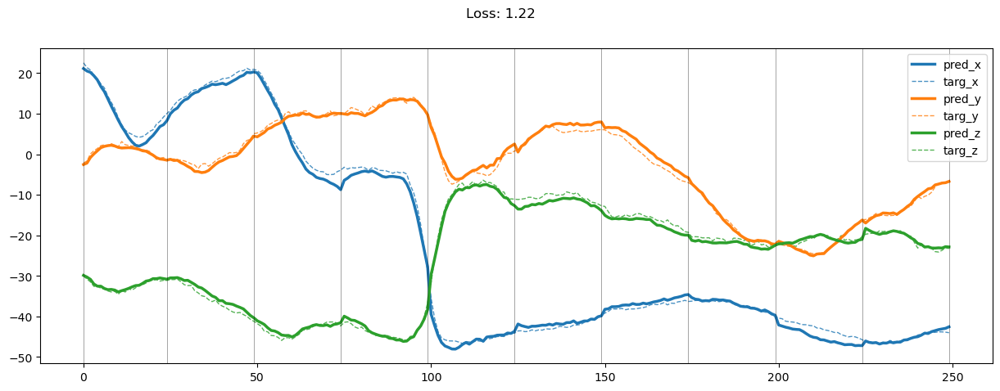

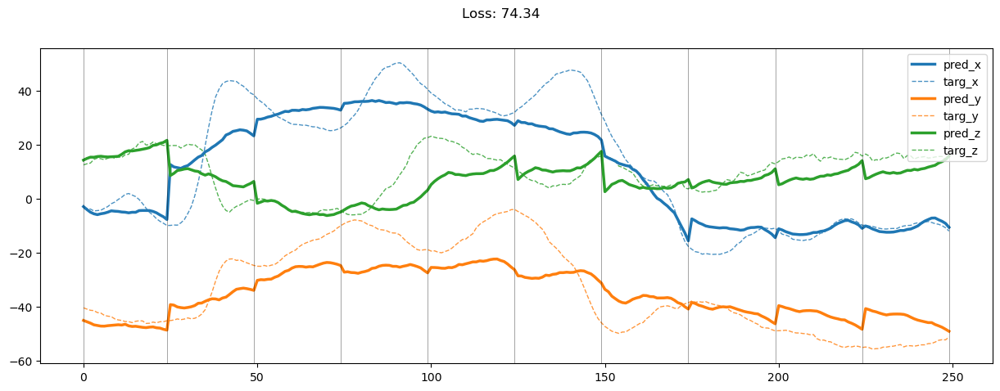

01949: train total loss:  1.827, pred loss:  0.914, valid total loss:  172.749, pred loss:  86.375


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01950: train total loss:  1.730, pred loss:  0.865, valid total loss:  176.784, pred loss:  88.392


100%|██████████| 6/6 [00:00<00:00, 20.65it/s]


01951: train total loss:  1.690, pred loss:  0.845, valid total loss:  174.562, pred loss:  87.281


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01952: train total loss:  1.679, pred loss:  0.840, valid total loss:  179.933, pred loss:  89.967


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01953: train total loss:  1.683, pred loss:  0.841, valid total loss:  175.321, pred loss:  87.660


100%|██████████| 6/6 [00:00<00:00, 20.60it/s]


01954: train total loss:  1.660, pred loss:  0.830, valid total loss:  173.445, pred loss:  86.722


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01955: train total loss:  1.624, pred loss:  0.812, valid total loss:  176.449, pred loss:  88.225


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01956: train total loss:  1.595, pred loss:  0.797, valid total loss:  179.274, pred loss:  89.637


100%|██████████| 6/6 [00:00<00:00, 20.76it/s]


01957: train total loss:  1.622, pred loss:  0.811, valid total loss:  176.673, pred loss:  88.336


100%|██████████| 6/6 [00:00<00:00, 20.41it/s]


01958: train total loss:  1.594, pred loss:  0.797, valid total loss:  176.594, pred loss:  88.297


100%|██████████| 6/6 [00:00<00:00, 20.07it/s]


01959: train total loss:  1.576, pred loss:  0.788, valid total loss:  173.566, pred loss:  86.783


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01960: train total loss:  1.660, pred loss:  0.830, valid total loss:  175.058, pred loss:  87.529


100%|██████████| 6/6 [00:00<00:00, 20.56it/s]


01961: train total loss:  1.610, pred loss:  0.805, valid total loss:  175.970, pred loss:  87.985


100%|██████████| 6/6 [00:00<00:00, 20.69it/s]


01962: train total loss:  1.631, pred loss:  0.815, valid total loss:  176.255, pred loss:  88.127


100%|██████████| 6/6 [00:00<00:00, 19.63it/s]


01963: train total loss:  1.595, pred loss:  0.798, valid total loss:  176.731, pred loss:  88.366


100%|██████████| 6/6 [00:00<00:00, 20.33it/s]


01964: train total loss:  1.640, pred loss:  0.820, valid total loss:  173.281, pred loss:  86.640


100%|██████████| 6/6 [00:00<00:00, 20.62it/s]


01965: train total loss:  1.578, pred loss:  0.789, valid total loss:  171.310, pred loss:  85.655


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01966: train total loss:  1.611, pred loss:  0.805, valid total loss:  172.563, pred loss:  86.282


100%|██████████| 6/6 [00:00<00:00, 20.45it/s]


01967: train total loss:  1.683, pred loss:  0.842, valid total loss:  167.890, pred loss:  83.945


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01968: train total loss:  1.651, pred loss:  0.826, valid total loss:  171.646, pred loss:  85.823


100%|██████████| 6/6 [00:00<00:00, 20.30it/s]


01969: train total loss:  1.690, pred loss:  0.845, valid total loss:  174.240, pred loss:  87.120


100%|██████████| 6/6 [00:00<00:00, 19.54it/s]


01970: train total loss:  1.668, pred loss:  0.834, valid total loss:  177.163, pred loss:  88.581


100%|██████████| 6/6 [00:00<00:00, 19.49it/s]


01971: train total loss:  1.672, pred loss:  0.836, valid total loss:  173.359, pred loss:  86.679


100%|██████████| 6/6 [00:00<00:00, 18.17it/s]


01972: train total loss:  1.675, pred loss:  0.838, valid total loss:  170.123, pred loss:  85.062


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01973: train total loss:  1.642, pred loss:  0.821, valid total loss:  171.632, pred loss:  85.816


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01974: train total loss:  1.653, pred loss:  0.827, valid total loss:  174.356, pred loss:  87.178


100%|██████████| 6/6 [00:00<00:00, 19.78it/s]


01975: train total loss:  1.604, pred loss:  0.802, valid total loss:  170.109, pred loss:  85.055


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01976: train total loss:  1.609, pred loss:  0.805, valid total loss:  174.375, pred loss:  87.188


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01977: train total loss:  1.557, pred loss:  0.779, valid total loss:  168.554, pred loss:  84.277


100%|██████████| 6/6 [00:00<00:00, 20.59it/s]


01978: train total loss:  1.554, pred loss:  0.777, valid total loss:  170.325, pred loss:  85.163


100%|██████████| 6/6 [00:00<00:00, 20.58it/s]


01979: train total loss:  1.571, pred loss:  0.786, valid total loss:  170.048, pred loss:  85.024


100%|██████████| 6/6 [00:00<00:00, 17.78it/s]


01980: train total loss:  1.602, pred loss:  0.801, valid total loss:  172.413, pred loss:  86.206


100%|██████████| 6/6 [00:00<00:00, 20.74it/s]


01981: train total loss:  1.575, pred loss:  0.788, valid total loss:  171.414, pred loss:  85.707


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01982: train total loss:  1.553, pred loss:  0.776, valid total loss:  173.610, pred loss:  86.805


100%|██████████| 6/6 [00:00<00:00, 20.63it/s]


01983: train total loss:  1.689, pred loss:  0.845, valid total loss:  170.134, pred loss:  85.067


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01984: train total loss:  1.736, pred loss:  0.868, valid total loss:  173.374, pred loss:  86.687


100%|██████████| 6/6 [00:00<00:00, 20.47it/s]


01985: train total loss:  1.771, pred loss:  0.886, valid total loss:  172.293, pred loss:  86.147


100%|██████████| 6/6 [00:00<00:00, 20.66it/s]


01986: train total loss:  1.858, pred loss:  0.929, valid total loss:  174.180, pred loss:  87.090


100%|██████████| 6/6 [00:00<00:00, 20.64it/s]


01987: train total loss:  1.726, pred loss:  0.863, valid total loss:  173.173, pred loss:  86.587


100%|██████████| 6/6 [00:00<00:00, 20.67it/s]


01988: train total loss:  1.716, pred loss:  0.858, valid total loss:  174.945, pred loss:  87.473


100%|██████████| 6/6 [00:00<00:00, 20.52it/s]


01989: train total loss:  1.740, pred loss:  0.870, valid total loss:  173.708, pred loss:  86.854


100%|██████████| 6/6 [00:00<00:00, 20.55it/s]


01990: train total loss:  1.687, pred loss:  0.844, valid total loss:  171.194, pred loss:  85.597


100%|██████████| 6/6 [00:00<00:00, 20.25it/s]


01991: train total loss:  1.611, pred loss:  0.805, valid total loss:  174.519, pred loss:  87.260


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


01992: train total loss:  1.554, pred loss:  0.777, valid total loss:  168.567, pred loss:  84.283


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01993: train total loss:  1.629, pred loss:  0.815, valid total loss:  175.442, pred loss:  87.721


100%|██████████| 6/6 [00:00<00:00, 20.54it/s]


01994: train total loss:  1.599, pred loss:  0.799, valid total loss:  178.580, pred loss:  89.290


100%|██████████| 6/6 [00:00<00:00, 19.94it/s]


01995: train total loss:  1.615, pred loss:  0.807, valid total loss:  173.001, pred loss:  86.501


100%|██████████| 6/6 [00:00<00:00, 20.50it/s]


01996: train total loss:  1.529, pred loss:  0.764, valid total loss:  178.837, pred loss:  89.418


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01997: train total loss:  1.574, pred loss:  0.787, valid total loss:  175.197, pred loss:  87.598


100%|██████████| 6/6 [00:00<00:00, 20.61it/s]


01998: train total loss:  1.586, pred loss:  0.793, valid total loss:  172.659, pred loss:  86.329


100%|██████████| 6/6 [00:00<00:00, 20.57it/s]


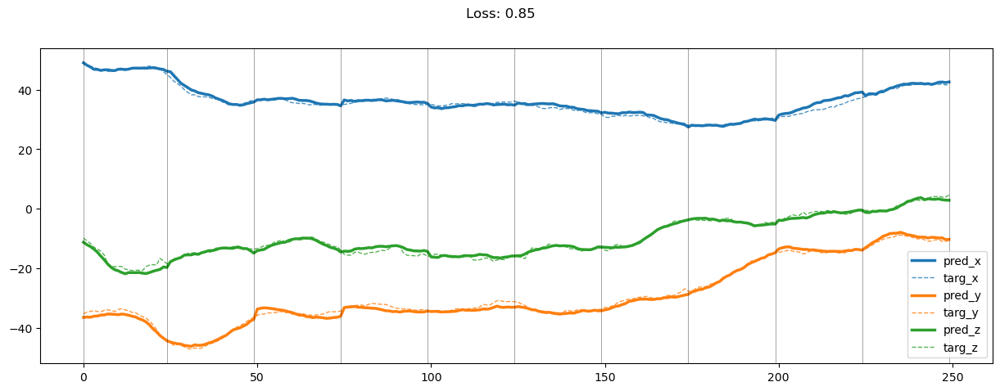

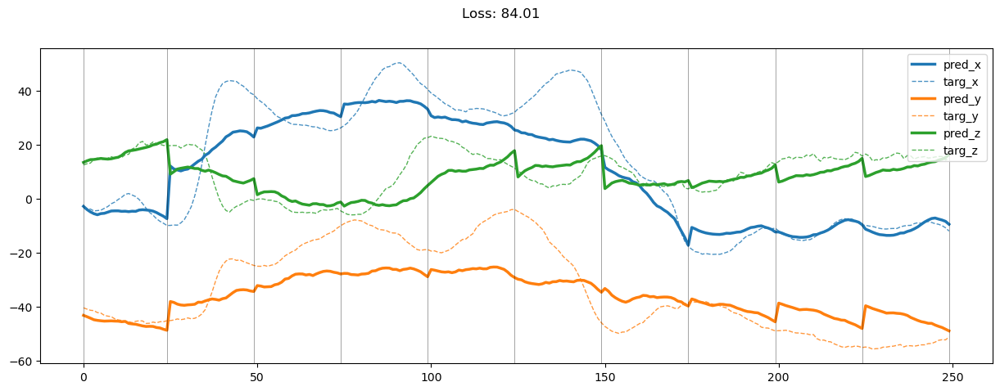

01999: train total loss:  1.643, pred loss:  0.822, valid total loss:  172.077, pred loss:  86.038


In [28]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 50 == 0:
        draw = True
    
    train_loss, train_pred_loss = train(model, train_loader, optimizer, draw)
    valid_loss, valid_pred_loss = evalute(model, valid_loader, draw)
    
    draw = False
    
    ep = str(epoch).zfill(5)
    print(f'{ep}: train total loss: {train_loss: 2.3f}, pred loss: {train_pred_loss: 2.3f}, valid total loss: {valid_loss: 2.3f}, pred loss: {valid_pred_loss: 2.3f}')

In [29]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            target_data = target_data.to(device)

            #############
            # generator #
            #############
            predict_mag = model(source_data[:, :, :, 9:12])

            predict_loss = mse_loss(predict_mag, target_data[:, :, :, 9:12])
            
            results.extend(zip(predict_mag.detach().cpu().numpy(), target_data[:, :, :, 9:12].cpu().numpy()))
            
            break
    
    return np.array(results)

In [30]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    for i in range(0, chunk_size+1):
        plt.axvline(x=int(i * seq_len - 0.5), linewidth=0.5, linestyle='-', color='k', alpha=0.5)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [31]:
results = output_eval(model, train_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)

TypeError: forward() missing 1 required positional argument: 'source_mag'

In [ ]:
results = output_eval(model, valid_loader)

print(results.shape)

for rs in results[::5]:
    plot_result(rs)